In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms

from utilscaae import mnist, plot_graphs, plot_mnist, to_onehot
import numpy as np
import os 

%matplotlib inline

In [2]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [3]:
root_folder = 'FC_CAAEn_results'
fixed_folder = root_folder + '/Fixed_results/'
recon_folder = root_folder + '/Recon_results/'

if os.path.isdir(root_folder):
    !rm -r $root_folder
os.mkdir(root_folder)
os.mkdir(fixed_folder)
os.mkdir(recon_folder)

In [4]:
mnist_tanh = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize((0.5,), (0.5,)),
                lambda x: x.to(device)
           ])

In [5]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

lr = 0.0001
prior_size = 10
train_epoch = 50
batch_size = 50
train_loader, valid_loader, test_loader = mnist(batch_size=batch_size, valid=10000, transform=mnist_tanh)
fixed_z = torch.randn((10, prior_size)).repeat((1,5)).view(-1, prior_size).to(device)
fixed_z_label = to_onehot(torch.tensor(list(range(10))).repeat((5)), 10).to(device)
fixed_data, fixed_label = next(iter(test_loader))
fixed_data = fixed_data[:batch_size].to(device)
fixed_label = to_onehot(fixed_label[:batch_size], 10).to(device)

cpu


In [6]:
data, label = next(iter(train_loader))

In [7]:
class FullyConnected(nn.Module):
    def __init__(self, sizes, dropout=False, activation_fn=nn.Tanh(), flatten=False, 
                 last_fn=None, first_fn=None, device='cpu'):
        super(FullyConnected, self).__init__()
        layers = []
        self.flatten = flatten
        if first_fn is not None:
            layers.append(first_fn)
        for i in range(len(sizes) - 2):
            layers.append(nn.Linear(sizes[i], sizes[i+1]))
            if dropout:
                layers.append(nn.Dropout(dropout))
            layers.append(activation_fn) # нам не нужен дропаут и фнкция активации в последнем слое
        else: 
            layers.append(nn.Linear(sizes[-2], sizes[-1]))
        if last_fn is not None:
            layers.append(last_fn)
        self.model = nn.Sequential(*layers)
        self.to(device)
        
    def forward(self, x, y=None):
        if self.flatten:
            x = x.view(x.shape[0], -1)
        if y is not None:
            x = torch.cat([x, y], dim=1)
        return self.model(x)

In [8]:
## Честный CAAE

In [55]:
Enc = FullyConnected([28*28, 500, 501, prior_size], activation_fn=nn.LeakyReLU(0.2), flatten=True, device=device)
Dec = FullyConnected([prior_size+10, 500, 501, 28*28], activation_fn=nn.LeakyReLU(0.2), last_fn=nn.Tanh(), device=device)
Disc = FullyConnected([prior_size+10, 500, 501, 1], dropout=0.3, activation_fn=nn.LeakyReLU(0.2), device=device)

Enc_optimizer = optim.Adam(Enc.parameters(), lr=lr)
Dec_optimizer = optim.Adam(Dec.parameters(), lr=lr)
Disc_optimizer = optim.Adam(Disc.parameters(), lr=lr)

In [9]:
train_log = {'E': [],'AE': [], 'D': []}
test_log = {'E': [],'AE': [], 'D': []}

In [16]:
batch_zeros = torch.zeros((batch_size, 1)).to(device)
batch_ones = torch.ones((batch_size, 1)).to(device)

In [11]:
def train(epoch, Enc, Dec, Disc, log=None):
    train_size = len(train_loader.sampler)
    for batch_idx, (data, label) in enumerate(train_loader):
        label = to_onehot(label, 10, device)
        # train D
        Enc.zero_grad()
        Disc.zero_grad()
        
        z = torch.randn((batch_size, prior_size)).to(device)
        z_label = to_onehot(np.random.randint(0, 10, (batch_size)), 10, device)

        fake_pred = Disc(Enc(data), label)
        true_pred = Disc(z, z_label)

        
        fake_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_zeros)
        true_loss = F.binary_cross_entropy_with_logits(true_pred, batch_ones)
        
        Disc_loss = 0.5*(fake_loss + true_loss)
        
        Disc_loss.backward()
        Disc_optimizer.step()
        
        # train AE
        Enc.zero_grad()
        Dec.zero_grad()
        Disc.zero_grad()
        
        z = torch.randn((batch_size, prior_size))
        z_label = to_onehot(np.random.randint(0, 10, (batch_size)), 10)
        
        latent = Enc(data)
        reconstructed = Dec(latent, label).view(-1, 1, 28, 28)
        fake_pred = Disc(latent, label)
        
        Enc_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_ones)
        AE_loss = F.mse_loss(reconstructed, data)
        G_loss = AE_loss + Enc_loss
        
        G_loss.backward()
        Dec_optimizer.step()
        Enc_optimizer.step()
            
        if batch_idx % 100 == 0:
            line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
                epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
            losses = 'E: {:.4f}, AE: {:.4f}, D: {:.4f}'.format(Enc_loss.item(), AE_loss.item(), Disc_loss.item())
            print(line + losses)
            
    else:
        batch_idx += 1
        line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
            epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
        losses = 'E: {:.4f}, AE: {:.4f}, D: {:.4f}'.format(Enc_loss.item(), AE_loss.item(), Disc_loss.item())
        print(line + losses)
        log['E'].append(Enc_loss.item())
        log['AE'].append(AE_loss.item())
        log['D'].append(Disc_loss.item())

In [12]:
def test(Enc, Dec, Disc, loader, epoch, log=None):
    test_size = len(loader)
    E_loss = 0.
    AE_loss = 0.
    D_loss = 0.
    test_loss = {'E': 0., 'AE': 0., 'D': 0.}
    with torch.no_grad():
        for data, label in loader:
            label = to_onehot(label, 10, device)
            z = torch.randn((batch_size, prior_size)).to(device)
            z_label = to_onehot(np.random.randint(0, 10, (batch_size)), 10, device)
            latent = Enc(data)
            reconstructed = Dec(latent, label).view(-1, 1, 28, 28)
            fake_pred = Disc(latent, label)
            true_pred = Disc(z, z_label)
        
            fake_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_zeros).item()
            true_loss = F.binary_cross_entropy_with_logits(true_pred, batch_ones).item()
            
            D_loss += 0.5*(fake_loss + true_loss)
            E_loss += F.binary_cross_entropy_with_logits(fake_pred, batch_ones).item()
            AE_loss += F.mse_loss(reconstructed, data)
            
        E_loss /= test_size
        D_loss /= test_size
        AE_loss /= test_size

        fixed_gen = Dec(fixed_z, fixed_z_label).cpu().data.numpy().reshape(batch_size, 1, 28, 28)
        plot_mnist(fixed_gen, (10, 10), True, fixed_folder + '%03d.png' % epoch)
        fixed_reconstruction = Dec(Enc(fixed_data), fixed_label).cpu().data.numpy().reshape(batch_size, 1, 28, 28)
        plot_mnist(fixed_reconstruction, (10, 10), True, recon_folder + '%03d.png' % epoch)
        
    report = 'Test losses. E: {:.4f}, AE: {:.4f}, D: {:.4f}'.format(E_loss, AE_loss, D_loss)
    print(report)

Train Epoch: 1 [0/50000 (0%)]	Losses E: 0.6686, AE: 0.9263, D: 0.6983
Train Epoch: 1 [5000/50000 (10%)]	Losses E: 1.1852, AE: 0.2888, D: 1.3149
Train Epoch: 1 [10000/50000 (20%)]	Losses E: 2.5025, AE: 0.2738, D: 0.7989
Train Epoch: 1 [15000/50000 (30%)]	Losses E: 0.7301, AE: 0.2812, D: 0.8734
Train Epoch: 1 [20000/50000 (40%)]	Losses E: 0.6781, AE: 0.2697, D: 0.7894
Train Epoch: 1 [25000/50000 (50%)]	Losses E: 0.6631, AE: 0.2497, D: 0.7381
Train Epoch: 1 [30000/50000 (60%)]	Losses E: 0.6061, AE: 0.2504, D: 0.7981
Train Epoch: 1 [35000/50000 (70%)]	Losses E: 0.6297, AE: 0.2644, D: 0.7771
Train Epoch: 1 [40000/50000 (80%)]	Losses E: 0.6200, AE: 0.2364, D: 0.7437
Train Epoch: 1 [45000/50000 (90%)]	Losses E: 0.6370, AE: 0.2246, D: 0.6999
Train Epoch: 1 [50000/50000 (100%)]	Losses E: 0.7281, AE: 0.2183, D: 0.6809


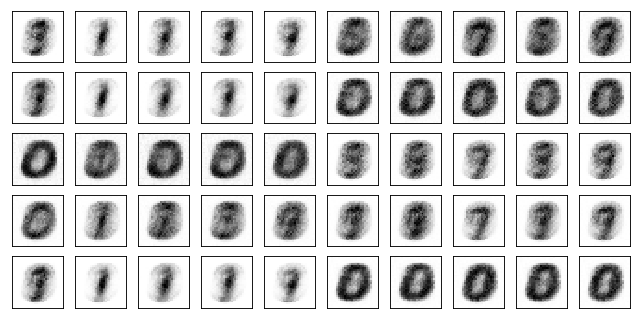

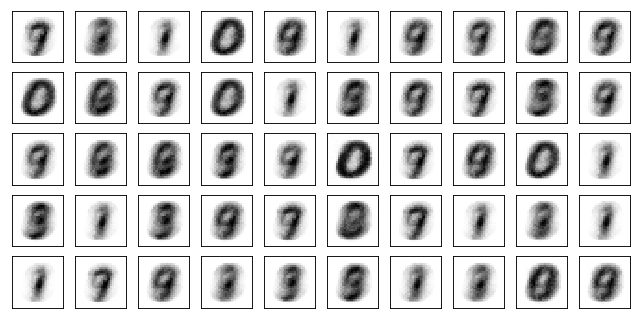

Test losses. E: 0.7056, AE: 0.2275, D: 0.6824
Train Epoch: 2 [0/50000 (0%)]	Losses E: 0.7456, AE: 0.2139, D: 0.6889
Train Epoch: 2 [5000/50000 (10%)]	Losses E: 0.6472, AE: 0.2306, D: 0.7687
Train Epoch: 2 [10000/50000 (20%)]	Losses E: 0.6393, AE: 0.2218, D: 0.7288
Train Epoch: 2 [15000/50000 (30%)]	Losses E: 0.6334, AE: 0.2058, D: 0.6975
Train Epoch: 2 [20000/50000 (40%)]	Losses E: 0.6624, AE: 0.2159, D: 0.7151
Train Epoch: 2 [25000/50000 (50%)]	Losses E: 0.6416, AE: 0.2014, D: 0.7421
Train Epoch: 2 [30000/50000 (60%)]	Losses E: 0.6007, AE: 0.1912, D: 0.7199
Train Epoch: 2 [35000/50000 (70%)]	Losses E: 0.6398, AE: 0.1844, D: 0.6946
Train Epoch: 2 [40000/50000 (80%)]	Losses E: 0.7251, AE: 0.1873, D: 0.6592
Train Epoch: 2 [45000/50000 (90%)]	Losses E: 0.7196, AE: 0.2003, D: 0.7496
Train Epoch: 2 [50000/50000 (100%)]	Losses E: 0.7240, AE: 0.2166, D: 0.7130


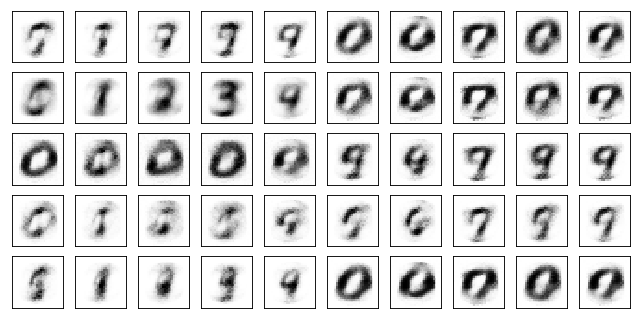

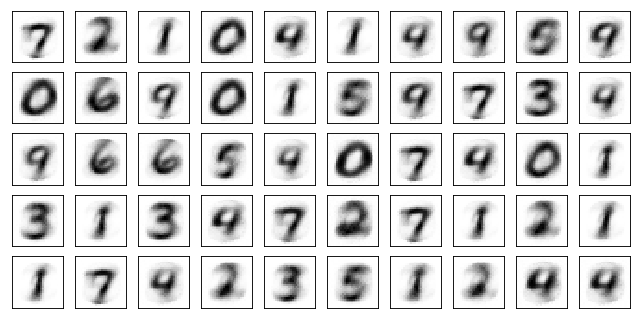

Test losses. E: 0.7251, AE: 0.1961, D: 0.7092
Train Epoch: 3 [0/50000 (0%)]	Losses E: 0.7277, AE: 0.2097, D: 0.7142
Train Epoch: 3 [5000/50000 (10%)]	Losses E: 0.6429, AE: 0.1957, D: 0.7089
Train Epoch: 3 [10000/50000 (20%)]	Losses E: 0.6765, AE: 0.1809, D: 0.6766
Train Epoch: 3 [15000/50000 (30%)]	Losses E: 0.7731, AE: 0.1803, D: 0.6667
Train Epoch: 3 [20000/50000 (40%)]	Losses E: 0.7087, AE: 0.1957, D: 0.7302
Train Epoch: 3 [25000/50000 (50%)]	Losses E: 0.6715, AE: 0.1671, D: 0.7157
Train Epoch: 3 [30000/50000 (60%)]	Losses E: 0.6408, AE: 0.1706, D: 0.6976
Train Epoch: 3 [35000/50000 (70%)]	Losses E: 0.5767, AE: 0.1688, D: 0.7488
Train Epoch: 3 [40000/50000 (80%)]	Losses E: 0.7226, AE: 0.1537, D: 0.7159
Train Epoch: 3 [45000/50000 (90%)]	Losses E: 0.6890, AE: 0.1566, D: 0.7070
Train Epoch: 3 [50000/50000 (100%)]	Losses E: 0.6568, AE: 0.1520, D: 0.6985


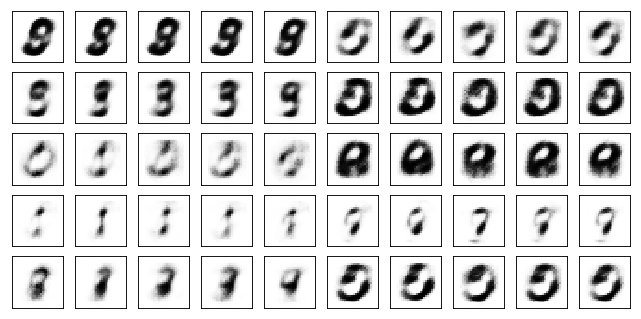

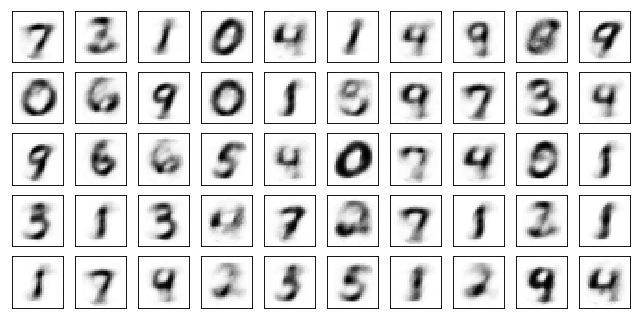

Test losses. E: 0.6592, AE: 0.1563, D: 0.6962
Train Epoch: 4 [0/50000 (0%)]	Losses E: 0.6572, AE: 0.1427, D: 0.6987
Train Epoch: 4 [5000/50000 (10%)]	Losses E: 0.6789, AE: 0.1725, D: 0.7014
Train Epoch: 4 [10000/50000 (20%)]	Losses E: 0.7772, AE: 0.1531, D: 0.6702
Train Epoch: 4 [15000/50000 (30%)]	Losses E: 0.6959, AE: 0.1522, D: 0.7040
Train Epoch: 4 [20000/50000 (40%)]	Losses E: 0.6945, AE: 0.1552, D: 0.6913
Train Epoch: 4 [25000/50000 (50%)]	Losses E: 0.6467, AE: 0.1513, D: 0.7158
Train Epoch: 4 [30000/50000 (60%)]	Losses E: 0.7072, AE: 0.1537, D: 0.6971
Train Epoch: 4 [35000/50000 (70%)]	Losses E: 0.6846, AE: 0.1528, D: 0.7012
Train Epoch: 4 [40000/50000 (80%)]	Losses E: 0.6704, AE: 0.1475, D: 0.6871
Train Epoch: 4 [45000/50000 (90%)]	Losses E: 0.6780, AE: 0.1337, D: 0.7353
Train Epoch: 4 [50000/50000 (100%)]	Losses E: 0.7222, AE: 0.1386, D: 0.7016


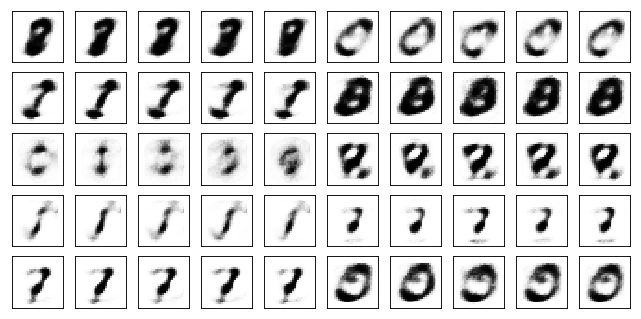

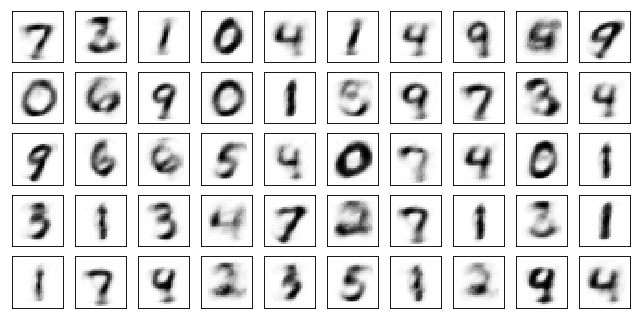

Test losses. E: 0.7172, AE: 0.1402, D: 0.7032
Train Epoch: 5 [0/50000 (0%)]	Losses E: 0.7215, AE: 0.1375, D: 0.7060
Train Epoch: 5 [5000/50000 (10%)]	Losses E: 0.6992, AE: 0.1331, D: 0.7007
Train Epoch: 5 [10000/50000 (20%)]	Losses E: 0.6720, AE: 0.1397, D: 0.6907
Train Epoch: 5 [15000/50000 (30%)]	Losses E: 0.7043, AE: 0.1484, D: 0.6971
Train Epoch: 5 [20000/50000 (40%)]	Losses E: 0.6878, AE: 0.1436, D: 0.7038
Train Epoch: 5 [25000/50000 (50%)]	Losses E: 0.6745, AE: 0.1295, D: 0.6914
Train Epoch: 5 [30000/50000 (60%)]	Losses E: 0.7388, AE: 0.1310, D: 0.6897
Train Epoch: 5 [35000/50000 (70%)]	Losses E: 0.6948, AE: 0.1360, D: 0.6975
Train Epoch: 5 [40000/50000 (80%)]	Losses E: 0.6845, AE: 0.1311, D: 0.6884
Train Epoch: 5 [45000/50000 (90%)]	Losses E: 0.6724, AE: 0.1237, D: 0.6994
Train Epoch: 5 [50000/50000 (100%)]	Losses E: 0.6884, AE: 0.1153, D: 0.7027


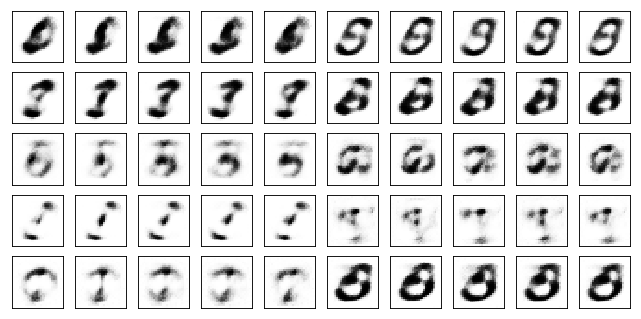

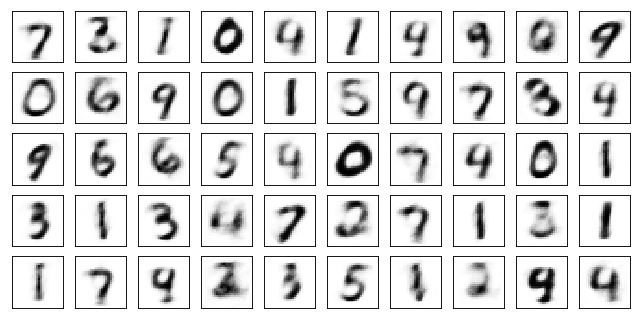

Test losses. E: 0.6878, AE: 0.1211, D: 0.7038
Train Epoch: 6 [0/50000 (0%)]	Losses E: 0.6887, AE: 0.1198, D: 0.7052
Train Epoch: 6 [5000/50000 (10%)]	Losses E: 0.6955, AE: 0.1081, D: 0.6961
Train Epoch: 6 [10000/50000 (20%)]	Losses E: 0.6842, AE: 0.1296, D: 0.6990
Train Epoch: 6 [15000/50000 (30%)]	Losses E: 0.7065, AE: 0.1177, D: 0.6947
Train Epoch: 6 [20000/50000 (40%)]	Losses E: 0.6812, AE: 0.1037, D: 0.6913
Train Epoch: 6 [25000/50000 (50%)]	Losses E: 0.6966, AE: 0.1015, D: 0.6941
Train Epoch: 6 [30000/50000 (60%)]	Losses E: 0.6757, AE: 0.1249, D: 0.7051
Train Epoch: 6 [35000/50000 (70%)]	Losses E: 0.6862, AE: 0.1130, D: 0.6979
Train Epoch: 6 [40000/50000 (80%)]	Losses E: 0.6938, AE: 0.1079, D: 0.6968
Train Epoch: 6 [45000/50000 (90%)]	Losses E: 0.6938, AE: 0.1196, D: 0.6927
Train Epoch: 6 [50000/50000 (100%)]	Losses E: 0.6816, AE: 0.0971, D: 0.6970


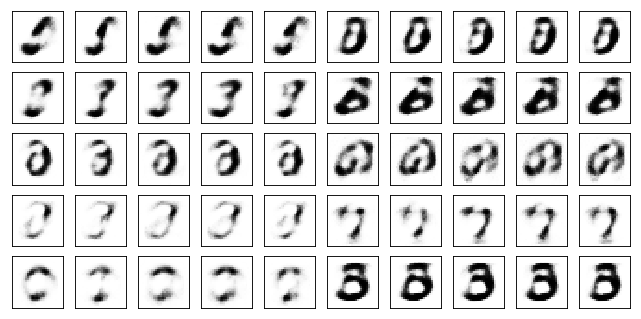

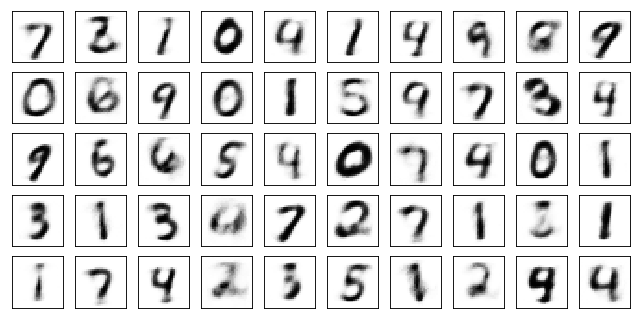

Test losses. E: 0.6781, AE: 0.1080, D: 0.6955
Train Epoch: 7 [0/50000 (0%)]	Losses E: 0.6833, AE: 0.1013, D: 0.6903
Train Epoch: 7 [5000/50000 (10%)]	Losses E: 0.7206, AE: 0.1126, D: 0.6878
Train Epoch: 7 [10000/50000 (20%)]	Losses E: 0.6907, AE: 0.0959, D: 0.6992
Train Epoch: 7 [15000/50000 (30%)]	Losses E: 0.6798, AE: 0.1099, D: 0.6975
Train Epoch: 7 [20000/50000 (40%)]	Losses E: 0.6801, AE: 0.1001, D: 0.6958
Train Epoch: 7 [25000/50000 (50%)]	Losses E: 0.6899, AE: 0.1034, D: 0.7005
Train Epoch: 7 [30000/50000 (60%)]	Losses E: 0.6830, AE: 0.0971, D: 0.7008
Train Epoch: 7 [35000/50000 (70%)]	Losses E: 0.6791, AE: 0.0970, D: 0.6949
Train Epoch: 7 [40000/50000 (80%)]	Losses E: 0.7119, AE: 0.1061, D: 0.6901
Train Epoch: 7 [45000/50000 (90%)]	Losses E: 0.6911, AE: 0.1061, D: 0.6916
Train Epoch: 7 [50000/50000 (100%)]	Losses E: 0.6809, AE: 0.1139, D: 0.6989


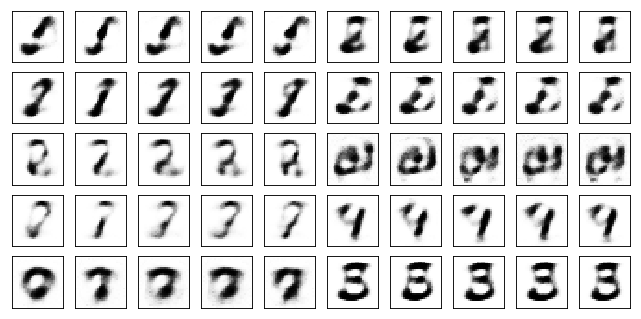

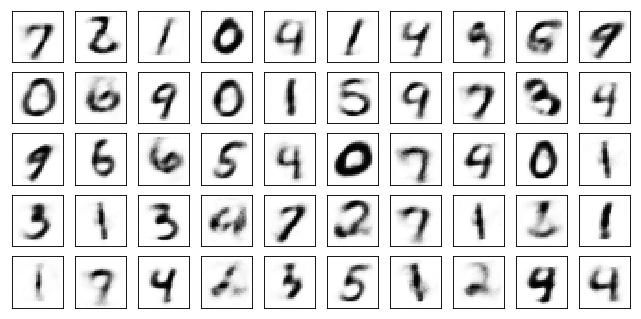

Test losses. E: 0.6864, AE: 0.1018, D: 0.6960
Train Epoch: 8 [0/50000 (0%)]	Losses E: 0.6903, AE: 0.1009, D: 0.6974
Train Epoch: 8 [5000/50000 (10%)]	Losses E: 0.6529, AE: 0.1178, D: 0.7048
Train Epoch: 8 [10000/50000 (20%)]	Losses E: 0.7108, AE: 0.1066, D: 0.6872
Train Epoch: 8 [15000/50000 (30%)]	Losses E: 0.6930, AE: 0.1124, D: 0.6886
Train Epoch: 8 [20000/50000 (40%)]	Losses E: 0.7306, AE: 0.1080, D: 0.7010
Train Epoch: 8 [25000/50000 (50%)]	Losses E: 0.6679, AE: 0.1132, D: 0.6985
Train Epoch: 8 [30000/50000 (60%)]	Losses E: 0.6990, AE: 0.1138, D: 0.7069
Train Epoch: 8 [35000/50000 (70%)]	Losses E: 0.6850, AE: 0.1168, D: 0.6990
Train Epoch: 8 [40000/50000 (80%)]	Losses E: 0.6866, AE: 0.1175, D: 0.7022
Train Epoch: 8 [45000/50000 (90%)]	Losses E: 0.7008, AE: 0.1047, D: 0.6995
Train Epoch: 8 [50000/50000 (100%)]	Losses E: 0.6762, AE: 0.1092, D: 0.7068


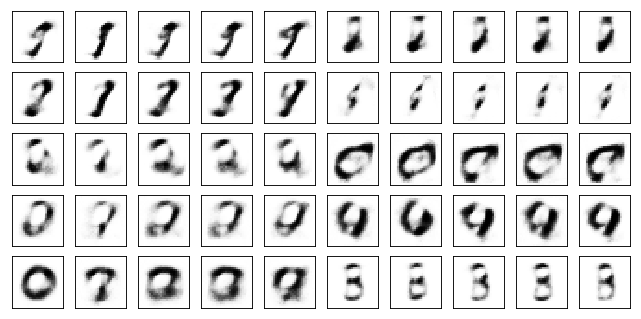

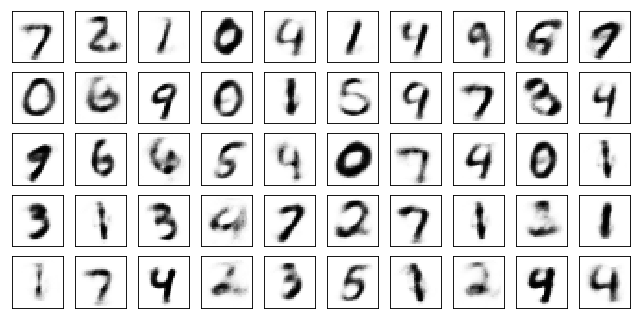

Test losses. E: 0.6852, AE: 0.1061, D: 0.6930
Train Epoch: 9 [0/50000 (0%)]	Losses E: 0.6878, AE: 0.1007, D: 0.6930
Train Epoch: 9 [5000/50000 (10%)]	Losses E: 0.6963, AE: 0.1164, D: 0.7082
Train Epoch: 9 [10000/50000 (20%)]	Losses E: 0.6837, AE: 0.0981, D: 0.6939
Train Epoch: 9 [15000/50000 (30%)]	Losses E: 0.6767, AE: 0.1312, D: 0.6980
Train Epoch: 9 [20000/50000 (40%)]	Losses E: 0.7143, AE: 0.1249, D: 0.6921
Train Epoch: 9 [25000/50000 (50%)]	Losses E: 0.6762, AE: 0.1195, D: 0.7016
Train Epoch: 9 [30000/50000 (60%)]	Losses E: 0.7079, AE: 0.0955, D: 0.6844
Train Epoch: 9 [35000/50000 (70%)]	Losses E: 0.7109, AE: 0.1166, D: 0.6891
Train Epoch: 9 [40000/50000 (80%)]	Losses E: 0.6697, AE: 0.1262, D: 0.7120
Train Epoch: 9 [45000/50000 (90%)]	Losses E: 0.6814, AE: 0.1227, D: 0.6897
Train Epoch: 9 [50000/50000 (100%)]	Losses E: 0.6932, AE: 0.1031, D: 0.6907


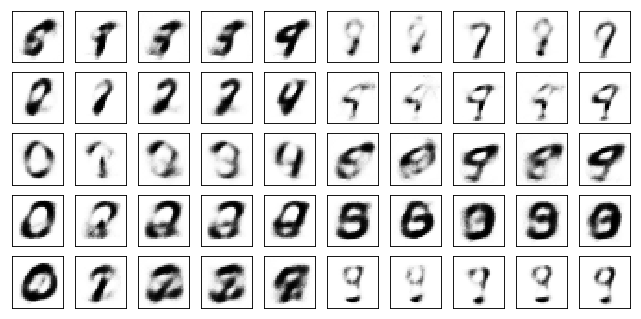

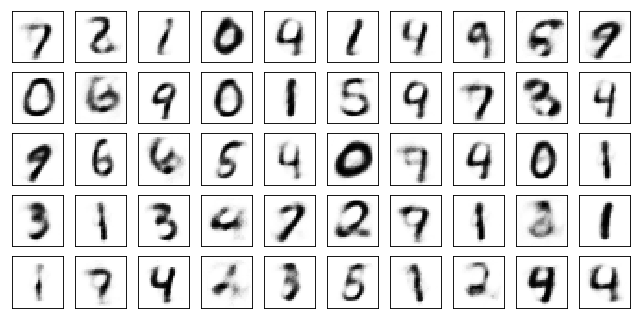

Test losses. E: 0.6969, AE: 0.1050, D: 0.6909
Train Epoch: 10 [0/50000 (0%)]	Losses E: 0.7006, AE: 0.1080, D: 0.6863
Train Epoch: 10 [5000/50000 (10%)]	Losses E: 0.7000, AE: 0.1123, D: 0.6975
Train Epoch: 10 [10000/50000 (20%)]	Losses E: 0.6858, AE: 0.1131, D: 0.6963
Train Epoch: 10 [15000/50000 (30%)]	Losses E: 0.6944, AE: 0.1023, D: 0.6988
Train Epoch: 10 [20000/50000 (40%)]	Losses E: 0.7613, AE: 0.1359, D: 0.6867
Train Epoch: 10 [25000/50000 (50%)]	Losses E: 0.7092, AE: 0.1015, D: 0.6882
Train Epoch: 10 [30000/50000 (60%)]	Losses E: 0.6954, AE: 0.0994, D: 0.6943
Train Epoch: 10 [35000/50000 (70%)]	Losses E: 0.6778, AE: 0.1030, D: 0.6940
Train Epoch: 10 [40000/50000 (80%)]	Losses E: 0.6985, AE: 0.1139, D: 0.6965
Train Epoch: 10 [45000/50000 (90%)]	Losses E: 0.6931, AE: 0.0889, D: 0.6901
Train Epoch: 10 [50000/50000 (100%)]	Losses E: 0.6837, AE: 0.1036, D: 0.6907


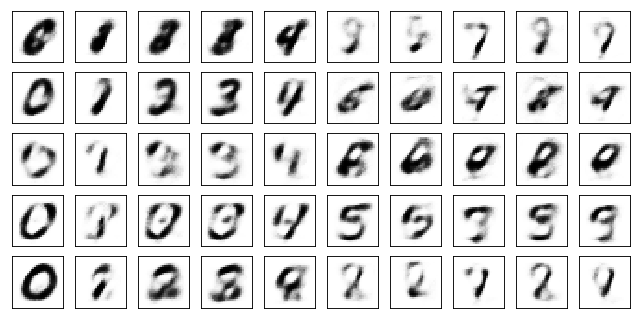

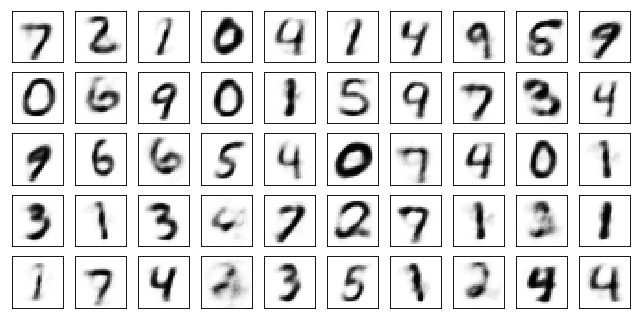

Test losses. E: 0.6890, AE: 0.0998, D: 0.6905
Train Epoch: 11 [0/50000 (0%)]	Losses E: 0.6907, AE: 0.0983, D: 0.6901
Train Epoch: 11 [5000/50000 (10%)]	Losses E: 0.6927, AE: 0.1114, D: 0.6970
Train Epoch: 11 [10000/50000 (20%)]	Losses E: 0.7034, AE: 0.0915, D: 0.6956
Train Epoch: 11 [15000/50000 (30%)]	Losses E: 0.7030, AE: 0.1047, D: 0.6877
Train Epoch: 11 [20000/50000 (40%)]	Losses E: 0.6921, AE: 0.1024, D: 0.6919
Train Epoch: 11 [25000/50000 (50%)]	Losses E: 0.6874, AE: 0.1044, D: 0.6916
Train Epoch: 11 [30000/50000 (60%)]	Losses E: 0.6987, AE: 0.0981, D: 0.6866
Train Epoch: 11 [35000/50000 (70%)]	Losses E: 0.6770, AE: 0.0911, D: 0.7002
Train Epoch: 11 [40000/50000 (80%)]	Losses E: 0.7203, AE: 0.1030, D: 0.6897
Train Epoch: 11 [45000/50000 (90%)]	Losses E: 0.7130, AE: 0.0968, D: 0.6839
Train Epoch: 11 [50000/50000 (100%)]	Losses E: 0.6955, AE: 0.0980, D: 0.6944


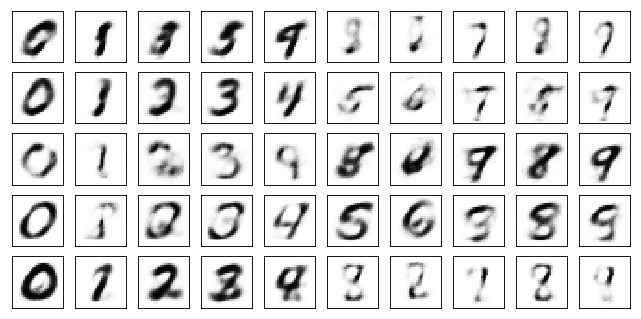

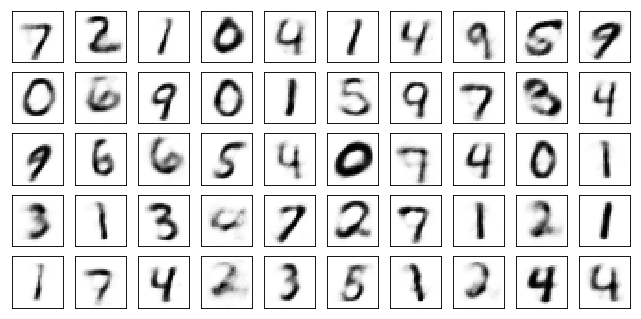

Test losses. E: 0.6920, AE: 0.0989, D: 0.6966
Train Epoch: 12 [0/50000 (0%)]	Losses E: 0.6867, AE: 0.1093, D: 0.6997
Train Epoch: 12 [5000/50000 (10%)]	Losses E: 0.6689, AE: 0.1040, D: 0.7002
Train Epoch: 12 [10000/50000 (20%)]	Losses E: 0.6996, AE: 0.0971, D: 0.6890
Train Epoch: 12 [15000/50000 (30%)]	Losses E: 0.7032, AE: 0.0818, D: 0.6934
Train Epoch: 12 [20000/50000 (40%)]	Losses E: 0.6819, AE: 0.0983, D: 0.6900
Train Epoch: 12 [25000/50000 (50%)]	Losses E: 0.7087, AE: 0.0995, D: 0.6892
Train Epoch: 12 [30000/50000 (60%)]	Losses E: 0.6947, AE: 0.1009, D: 0.6948
Train Epoch: 12 [35000/50000 (70%)]	Losses E: 0.6836, AE: 0.0929, D: 0.6942
Train Epoch: 12 [40000/50000 (80%)]	Losses E: 0.7017, AE: 0.1033, D: 0.6964
Train Epoch: 12 [45000/50000 (90%)]	Losses E: 0.6989, AE: 0.0948, D: 0.6909
Train Epoch: 12 [50000/50000 (100%)]	Losses E: 0.6822, AE: 0.0948, D: 0.6975


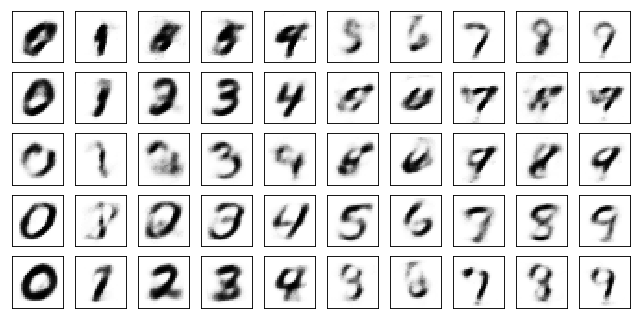

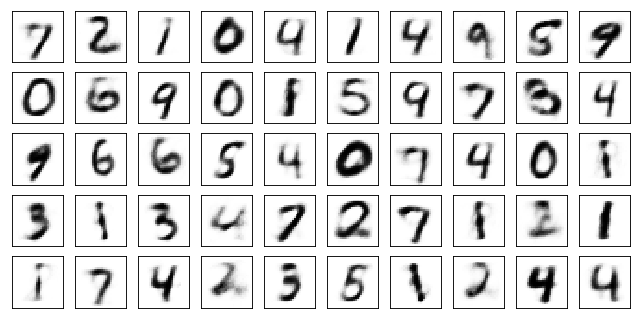

Test losses. E: 0.6747, AE: 0.0979, D: 0.6987
Train Epoch: 13 [0/50000 (0%)]	Losses E: 0.6809, AE: 0.0867, D: 0.6989
Train Epoch: 13 [5000/50000 (10%)]	Losses E: 0.6958, AE: 0.0968, D: 0.6945
Train Epoch: 13 [10000/50000 (20%)]	Losses E: 0.6977, AE: 0.0932, D: 0.6932
Train Epoch: 13 [15000/50000 (30%)]	Losses E: 0.6845, AE: 0.0924, D: 0.6996
Train Epoch: 13 [20000/50000 (40%)]	Losses E: 0.6796, AE: 0.0996, D: 0.6962
Train Epoch: 13 [25000/50000 (50%)]	Losses E: 0.7158, AE: 0.0948, D: 0.6914
Train Epoch: 13 [30000/50000 (60%)]	Losses E: 0.6807, AE: 0.1159, D: 0.6982
Train Epoch: 13 [35000/50000 (70%)]	Losses E: 0.6950, AE: 0.0846, D: 0.6871
Train Epoch: 13 [40000/50000 (80%)]	Losses E: 0.7098, AE: 0.0955, D: 0.6943
Train Epoch: 13 [45000/50000 (90%)]	Losses E: 0.7003, AE: 0.0840, D: 0.6853
Train Epoch: 13 [50000/50000 (100%)]	Losses E: 0.6921, AE: 0.0949, D: 0.6905


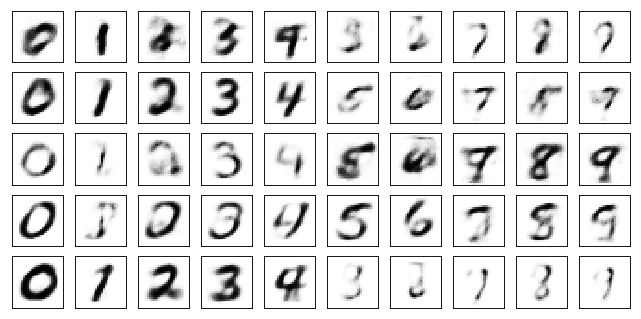

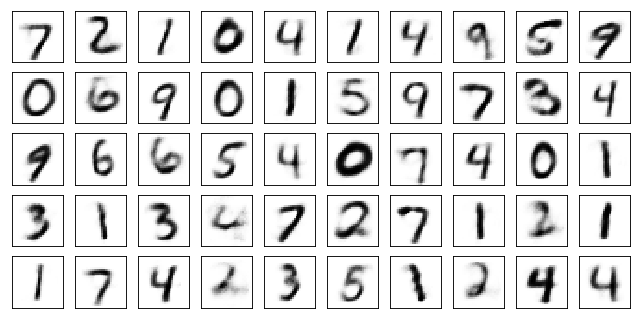

Test losses. E: 0.6980, AE: 0.0892, D: 0.6914
Train Epoch: 14 [0/50000 (0%)]	Losses E: 0.6940, AE: 0.0912, D: 0.6967
Train Epoch: 14 [5000/50000 (10%)]	Losses E: 0.6781, AE: 0.0780, D: 0.6990
Train Epoch: 14 [10000/50000 (20%)]	Losses E: 0.6887, AE: 0.0904, D: 0.6978
Train Epoch: 14 [15000/50000 (30%)]	Losses E: 0.6839, AE: 0.0994, D: 0.6953
Train Epoch: 14 [20000/50000 (40%)]	Losses E: 0.6986, AE: 0.0993, D: 0.6960
Train Epoch: 14 [25000/50000 (50%)]	Losses E: 0.7039, AE: 0.0851, D: 0.6944
Train Epoch: 14 [30000/50000 (60%)]	Losses E: 0.6901, AE: 0.0806, D: 0.6926
Train Epoch: 14 [35000/50000 (70%)]	Losses E: 0.6862, AE: 0.0810, D: 0.6959
Train Epoch: 14 [40000/50000 (80%)]	Losses E: 0.6912, AE: 0.0870, D: 0.6941
Train Epoch: 14 [45000/50000 (90%)]	Losses E: 0.6841, AE: 0.0914, D: 0.6947
Train Epoch: 14 [50000/50000 (100%)]	Losses E: 0.7063, AE: 0.0808, D: 0.6925


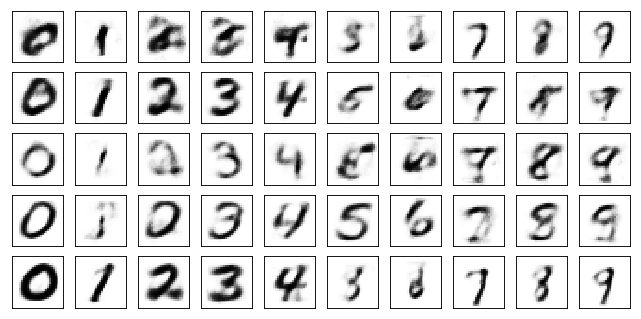

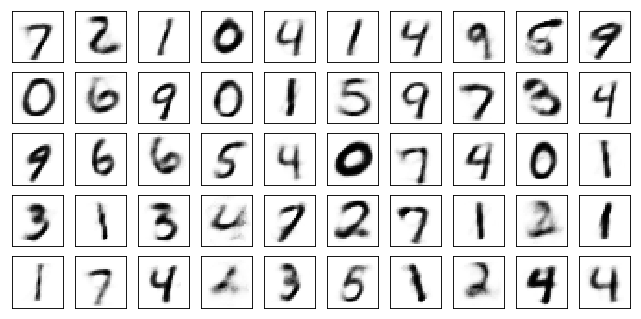

Test losses. E: 0.6916, AE: 0.0846, D: 0.6923
Train Epoch: 15 [0/50000 (0%)]	Losses E: 0.6996, AE: 0.0896, D: 0.6908
Train Epoch: 15 [5000/50000 (10%)]	Losses E: 0.7040, AE: 0.0813, D: 0.6885
Train Epoch: 15 [10000/50000 (20%)]	Losses E: 0.6948, AE: 0.0913, D: 0.6922
Train Epoch: 15 [15000/50000 (30%)]	Losses E: 0.7013, AE: 0.0854, D: 0.6932
Train Epoch: 15 [20000/50000 (40%)]	Losses E: 0.6905, AE: 0.0821, D: 0.6988
Train Epoch: 15 [25000/50000 (50%)]	Losses E: 0.6844, AE: 0.0898, D: 0.6890
Train Epoch: 15 [30000/50000 (60%)]	Losses E: 0.6825, AE: 0.0854, D: 0.6926
Train Epoch: 15 [35000/50000 (70%)]	Losses E: 0.7032, AE: 0.0751, D: 0.6880
Train Epoch: 15 [40000/50000 (80%)]	Losses E: 0.7036, AE: 0.0803, D: 0.6912
Train Epoch: 15 [45000/50000 (90%)]	Losses E: 0.7092, AE: 0.0786, D: 0.6959
Train Epoch: 15 [50000/50000 (100%)]	Losses E: 0.6925, AE: 0.0865, D: 0.6974


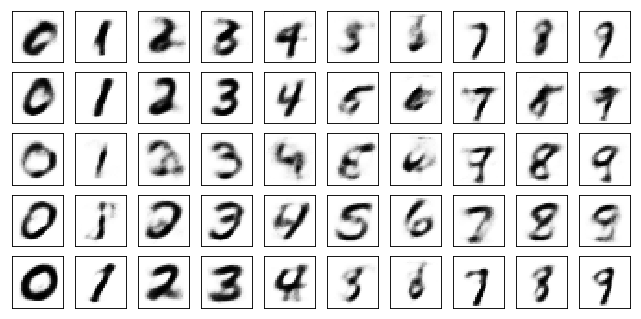

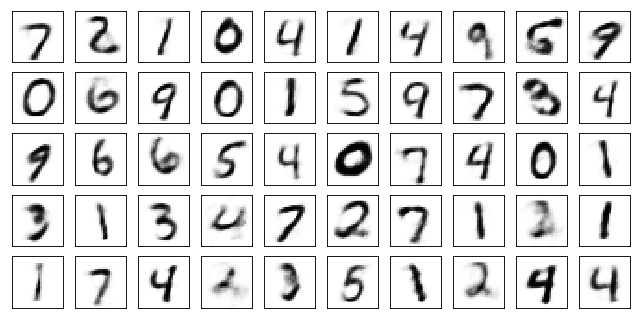

Test losses. E: 0.6970, AE: 0.0874, D: 0.6936
Train Epoch: 16 [0/50000 (0%)]	Losses E: 0.7068, AE: 0.0906, D: 0.6936
Train Epoch: 16 [5000/50000 (10%)]	Losses E: 0.6839, AE: 0.0794, D: 0.6967
Train Epoch: 16 [10000/50000 (20%)]	Losses E: 0.7251, AE: 0.0799, D: 0.6817
Train Epoch: 16 [15000/50000 (30%)]	Losses E: 0.6704, AE: 0.0770, D: 0.6968
Train Epoch: 16 [20000/50000 (40%)]	Losses E: 0.7083, AE: 0.0853, D: 0.6897
Train Epoch: 16 [25000/50000 (50%)]	Losses E: 0.6874, AE: 0.0760, D: 0.6939
Train Epoch: 16 [30000/50000 (60%)]	Losses E: 0.6843, AE: 0.0791, D: 0.6936
Train Epoch: 16 [35000/50000 (70%)]	Losses E: 0.7124, AE: 0.0718, D: 0.6888
Train Epoch: 16 [40000/50000 (80%)]	Losses E: 0.6909, AE: 0.0839, D: 0.6924
Train Epoch: 16 [45000/50000 (90%)]	Losses E: 0.6951, AE: 0.0840, D: 0.6912
Train Epoch: 16 [50000/50000 (100%)]	Losses E: 0.7011, AE: 0.0803, D: 0.6899


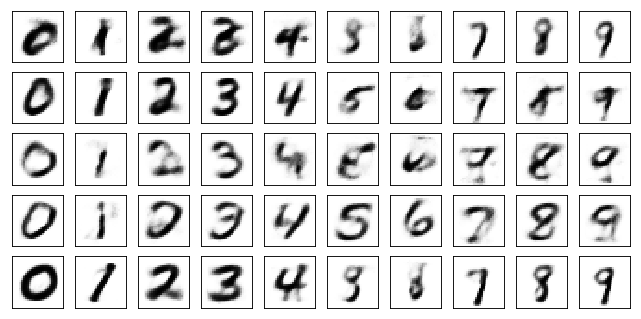

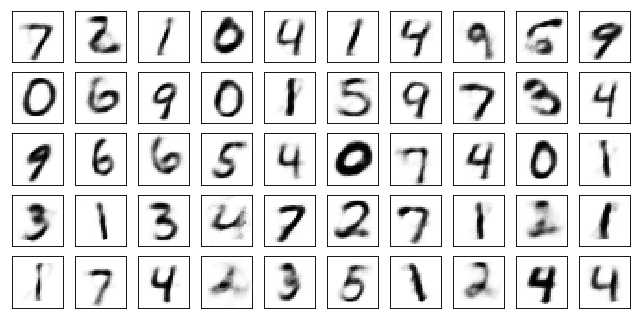

Test losses. E: 0.6940, AE: 0.0823, D: 0.6923
Train Epoch: 17 [0/50000 (0%)]	Losses E: 0.6967, AE: 0.0857, D: 0.6896
Train Epoch: 17 [5000/50000 (10%)]	Losses E: 0.7014, AE: 0.0777, D: 0.6886
Train Epoch: 17 [10000/50000 (20%)]	Losses E: 0.6932, AE: 0.0709, D: 0.6915
Train Epoch: 17 [15000/50000 (30%)]	Losses E: 0.6954, AE: 0.0865, D: 0.6914
Train Epoch: 17 [20000/50000 (40%)]	Losses E: 0.6851, AE: 0.0808, D: 0.6988
Train Epoch: 17 [25000/50000 (50%)]	Losses E: 0.7033, AE: 0.0786, D: 0.6912
Train Epoch: 17 [30000/50000 (60%)]	Losses E: 0.6882, AE: 0.0817, D: 0.6944
Train Epoch: 17 [35000/50000 (70%)]	Losses E: 0.7011, AE: 0.0789, D: 0.6904
Train Epoch: 17 [40000/50000 (80%)]	Losses E: 0.6884, AE: 0.0903, D: 0.6957
Train Epoch: 17 [45000/50000 (90%)]	Losses E: 0.6934, AE: 0.0800, D: 0.6926
Train Epoch: 17 [50000/50000 (100%)]	Losses E: 0.6979, AE: 0.0720, D: 0.6920


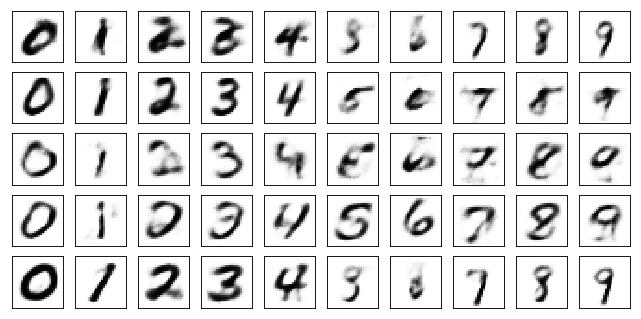

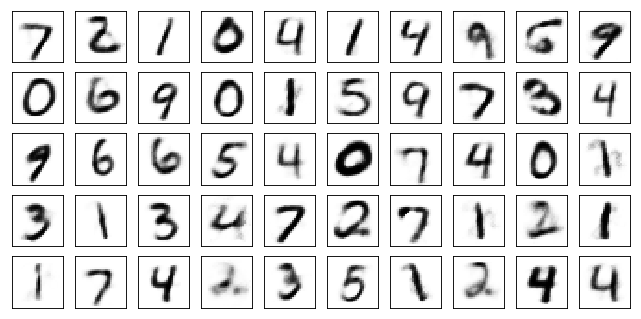

Test losses. E: 0.7018, AE: 0.0810, D: 0.6918
Train Epoch: 18 [0/50000 (0%)]	Losses E: 0.7007, AE: 0.0791, D: 0.6895
Train Epoch: 18 [5000/50000 (10%)]	Losses E: 0.6999, AE: 0.0830, D: 0.6924
Train Epoch: 18 [10000/50000 (20%)]	Losses E: 0.6861, AE: 0.0729, D: 0.6943
Train Epoch: 18 [15000/50000 (30%)]	Losses E: 0.6838, AE: 0.0778, D: 0.6993
Train Epoch: 18 [20000/50000 (40%)]	Losses E: 0.6940, AE: 0.0656, D: 0.6889
Train Epoch: 18 [25000/50000 (50%)]	Losses E: 0.6947, AE: 0.0797, D: 0.6839
Train Epoch: 18 [30000/50000 (60%)]	Losses E: 0.6989, AE: 0.0772, D: 0.6877
Train Epoch: 18 [35000/50000 (70%)]	Losses E: 0.6992, AE: 0.0816, D: 0.6915
Train Epoch: 18 [40000/50000 (80%)]	Losses E: 0.6927, AE: 0.0746, D: 0.6876
Train Epoch: 18 [45000/50000 (90%)]	Losses E: 0.6955, AE: 0.0773, D: 0.6944
Train Epoch: 18 [50000/50000 (100%)]	Losses E: 0.6877, AE: 0.0742, D: 0.6856


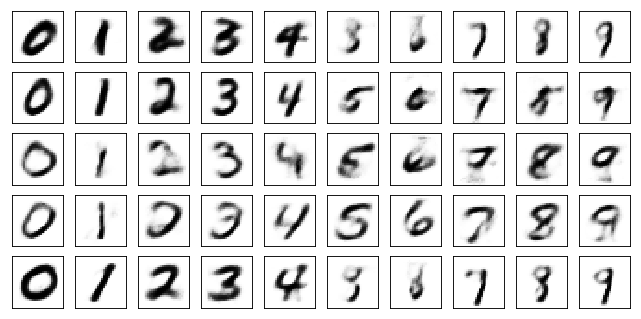

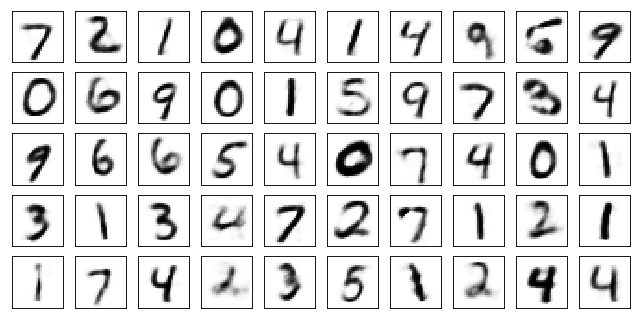

Test losses. E: 0.6958, AE: 0.0772, D: 0.6908
Train Epoch: 19 [0/50000 (0%)]	Losses E: 0.6985, AE: 0.0819, D: 0.6870
Train Epoch: 19 [5000/50000 (10%)]	Losses E: 0.6827, AE: 0.0817, D: 0.7028
Train Epoch: 19 [10000/50000 (20%)]	Losses E: 0.6964, AE: 0.0775, D: 0.6944
Train Epoch: 19 [15000/50000 (30%)]	Losses E: 0.6908, AE: 0.0704, D: 0.6894
Train Epoch: 19 [20000/50000 (40%)]	Losses E: 0.6992, AE: 0.0797, D: 0.6858
Train Epoch: 19 [25000/50000 (50%)]	Losses E: 0.6974, AE: 0.0770, D: 0.6908
Train Epoch: 19 [30000/50000 (60%)]	Losses E: 0.6953, AE: 0.0732, D: 0.6931
Train Epoch: 19 [35000/50000 (70%)]	Losses E: 0.6897, AE: 0.0721, D: 0.6935
Train Epoch: 19 [40000/50000 (80%)]	Losses E: 0.7044, AE: 0.0712, D: 0.6913
Train Epoch: 19 [45000/50000 (90%)]	Losses E: 0.7067, AE: 0.0742, D: 0.6911
Train Epoch: 19 [50000/50000 (100%)]	Losses E: 0.6990, AE: 0.0715, D: 0.6922


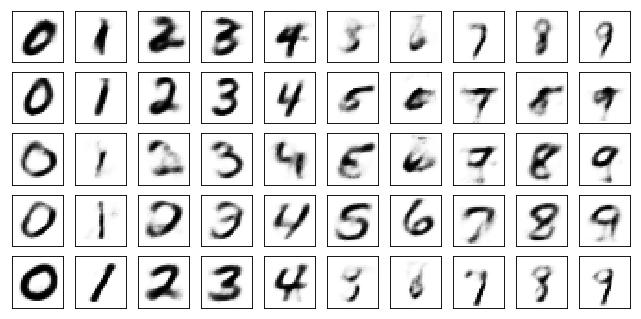

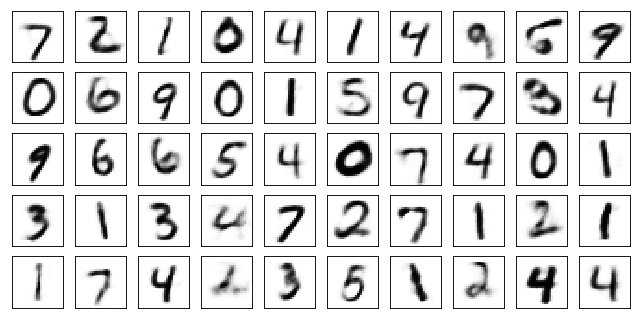

Test losses. E: 0.6971, AE: 0.0732, D: 0.6916
Train Epoch: 20 [0/50000 (0%)]	Losses E: 0.7020, AE: 0.0678, D: 0.6933
Train Epoch: 20 [5000/50000 (10%)]	Losses E: 0.6983, AE: 0.0778, D: 0.6867
Train Epoch: 20 [10000/50000 (20%)]	Losses E: 0.7008, AE: 0.0713, D: 0.6918
Train Epoch: 20 [15000/50000 (30%)]	Losses E: 0.6963, AE: 0.0751, D: 0.6932
Train Epoch: 20 [20000/50000 (40%)]	Losses E: 0.6875, AE: 0.0648, D: 0.6943
Train Epoch: 20 [25000/50000 (50%)]	Losses E: 0.7057, AE: 0.0659, D: 0.6861
Train Epoch: 20 [30000/50000 (60%)]	Losses E: 0.6901, AE: 0.0714, D: 0.6874
Train Epoch: 20 [35000/50000 (70%)]	Losses E: 0.6904, AE: 0.0700, D: 0.6956
Train Epoch: 20 [40000/50000 (80%)]	Losses E: 0.7016, AE: 0.0653, D: 0.6971
Train Epoch: 20 [45000/50000 (90%)]	Losses E: 0.6824, AE: 0.0808, D: 0.7008
Train Epoch: 20 [50000/50000 (100%)]	Losses E: 0.6916, AE: 0.0768, D: 0.6935


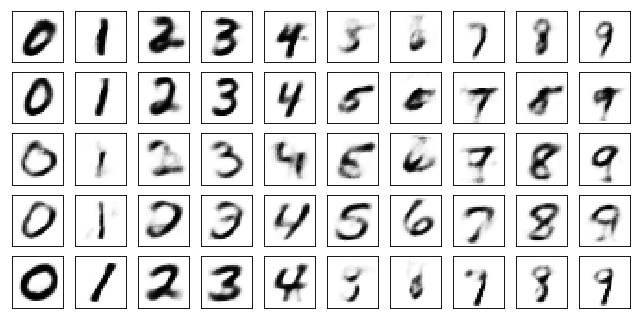

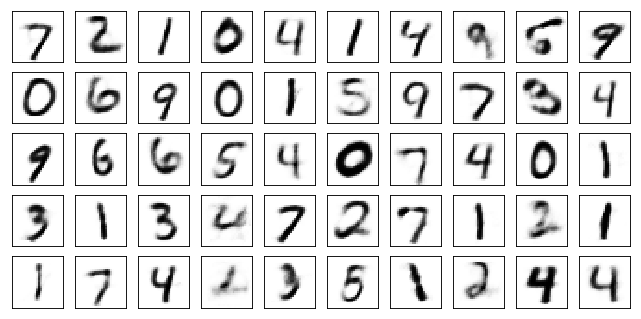

Test losses. E: 0.6870, AE: 0.0758, D: 0.6932
Train Epoch: 21 [0/50000 (0%)]	Losses E: 0.6901, AE: 0.0739, D: 0.6954
Train Epoch: 21 [5000/50000 (10%)]	Losses E: 0.6890, AE: 0.0776, D: 0.6948
Train Epoch: 21 [10000/50000 (20%)]	Losses E: 0.7035, AE: 0.0609, D: 0.6864
Train Epoch: 21 [15000/50000 (30%)]	Losses E: 0.6917, AE: 0.0793, D: 0.6941
Train Epoch: 21 [20000/50000 (40%)]	Losses E: 0.6946, AE: 0.0804, D: 0.6908
Train Epoch: 21 [25000/50000 (50%)]	Losses E: 0.6844, AE: 0.0694, D: 0.6964
Train Epoch: 21 [30000/50000 (60%)]	Losses E: 0.6937, AE: 0.0753, D: 0.6919
Train Epoch: 21 [35000/50000 (70%)]	Losses E: 0.6988, AE: 0.0757, D: 0.6944
Train Epoch: 21 [40000/50000 (80%)]	Losses E: 0.6806, AE: 0.0733, D: 0.6996
Train Epoch: 21 [45000/50000 (90%)]	Losses E: 0.6889, AE: 0.0794, D: 0.6934
Train Epoch: 21 [50000/50000 (100%)]	Losses E: 0.7010, AE: 0.0692, D: 0.6909


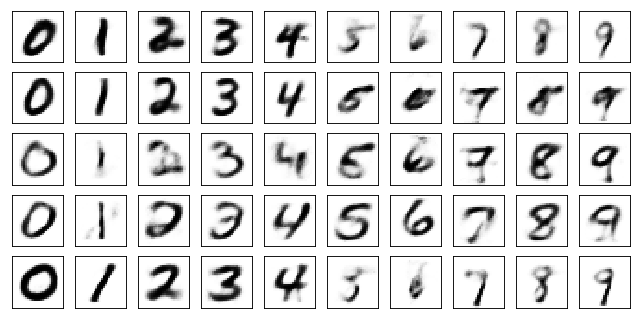

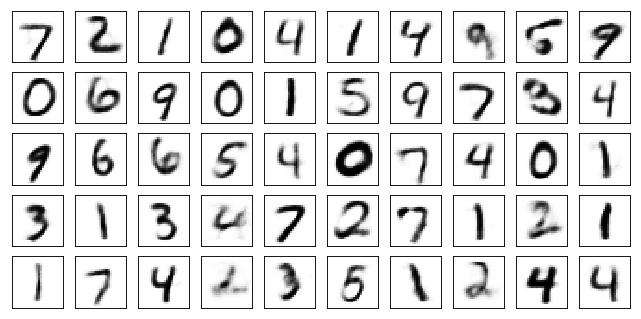

Test losses. E: 0.6946, AE: 0.0709, D: 0.6917
Train Epoch: 22 [0/50000 (0%)]	Losses E: 0.6973, AE: 0.0642, D: 0.6898
Train Epoch: 22 [5000/50000 (10%)]	Losses E: 0.6948, AE: 0.0659, D: 0.6885
Train Epoch: 22 [10000/50000 (20%)]	Losses E: 0.6984, AE: 0.0701, D: 0.6894
Train Epoch: 22 [15000/50000 (30%)]	Losses E: 0.6972, AE: 0.0617, D: 0.6915
Train Epoch: 22 [20000/50000 (40%)]	Losses E: 0.6904, AE: 0.0655, D: 0.6949
Train Epoch: 22 [25000/50000 (50%)]	Losses E: 0.6902, AE: 0.0675, D: 0.6892
Train Epoch: 22 [30000/50000 (60%)]	Losses E: 0.6916, AE: 0.0701, D: 0.6951
Train Epoch: 22 [35000/50000 (70%)]	Losses E: 0.6889, AE: 0.0775, D: 0.6927
Train Epoch: 22 [40000/50000 (80%)]	Losses E: 0.6975, AE: 0.0678, D: 0.6924
Train Epoch: 22 [45000/50000 (90%)]	Losses E: 0.6959, AE: 0.0668, D: 0.6929
Train Epoch: 22 [50000/50000 (100%)]	Losses E: 0.6932, AE: 0.0700, D: 0.6955


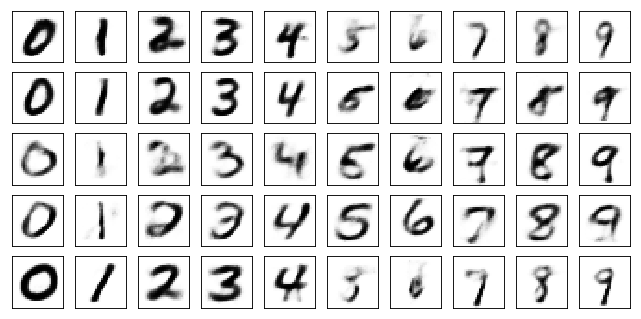

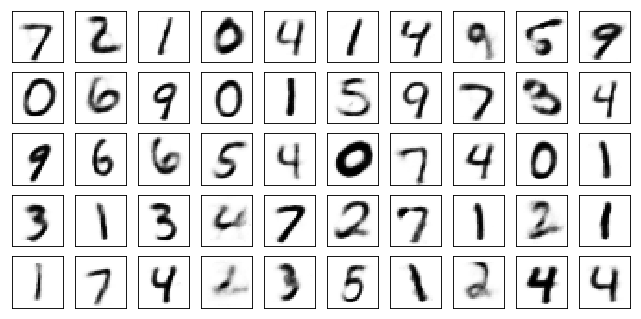

Test losses. E: 0.6894, AE: 0.0713, D: 0.6920
Train Epoch: 23 [0/50000 (0%)]	Losses E: 0.6894, AE: 0.0726, D: 0.6926
Train Epoch: 23 [5000/50000 (10%)]	Losses E: 0.6773, AE: 0.0760, D: 0.6980
Train Epoch: 23 [10000/50000 (20%)]	Losses E: 0.6829, AE: 0.0690, D: 0.6962
Train Epoch: 23 [15000/50000 (30%)]	Losses E: 0.7018, AE: 0.0808, D: 0.6899
Train Epoch: 23 [20000/50000 (40%)]	Losses E: 0.7081, AE: 0.0574, D: 0.6861
Train Epoch: 23 [25000/50000 (50%)]	Losses E: 0.6855, AE: 0.0637, D: 0.6946
Train Epoch: 23 [30000/50000 (60%)]	Losses E: 0.6949, AE: 0.0718, D: 0.6939
Train Epoch: 23 [35000/50000 (70%)]	Losses E: 0.6976, AE: 0.0645, D: 0.6937
Train Epoch: 23 [40000/50000 (80%)]	Losses E: 0.6930, AE: 0.0704, D: 0.6935
Train Epoch: 23 [45000/50000 (90%)]	Losses E: 0.6905, AE: 0.0674, D: 0.6900
Train Epoch: 23 [50000/50000 (100%)]	Losses E: 0.6893, AE: 0.0708, D: 0.6889


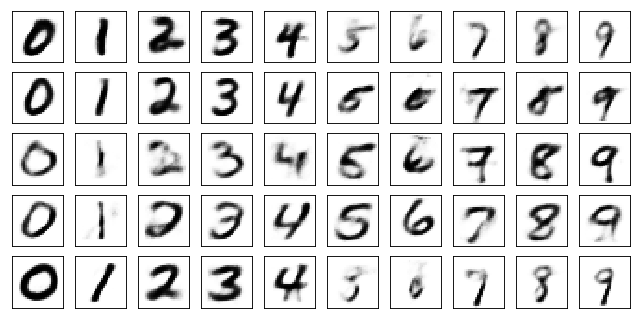

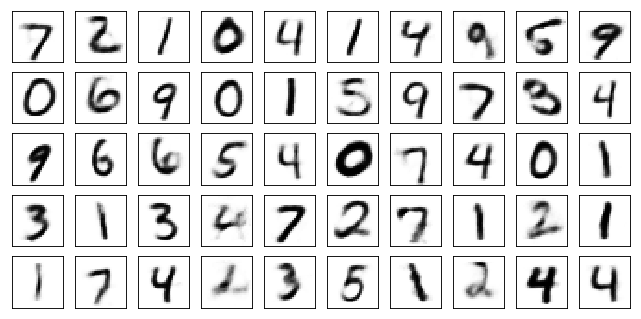

Test losses. E: 0.6929, AE: 0.0688, D: 0.6916
Train Epoch: 24 [0/50000 (0%)]	Losses E: 0.6944, AE: 0.0703, D: 0.6982
Train Epoch: 24 [5000/50000 (10%)]	Losses E: 0.6932, AE: 0.0700, D: 0.6945
Train Epoch: 24 [10000/50000 (20%)]	Losses E: 0.6863, AE: 0.0658, D: 0.6973
Train Epoch: 24 [15000/50000 (30%)]	Losses E: 0.6943, AE: 0.0693, D: 0.6995
Train Epoch: 24 [20000/50000 (40%)]	Losses E: 0.6991, AE: 0.0754, D: 0.6862
Train Epoch: 24 [25000/50000 (50%)]	Losses E: 0.7062, AE: 0.0700, D: 0.6907
Train Epoch: 24 [30000/50000 (60%)]	Losses E: 0.7023, AE: 0.0697, D: 0.6915
Train Epoch: 24 [35000/50000 (70%)]	Losses E: 0.6927, AE: 0.0724, D: 0.6955
Train Epoch: 24 [40000/50000 (80%)]	Losses E: 0.6836, AE: 0.0707, D: 0.6939
Train Epoch: 24 [45000/50000 (90%)]	Losses E: 0.6967, AE: 0.0709, D: 0.6917
Train Epoch: 24 [50000/50000 (100%)]	Losses E: 0.6976, AE: 0.0635, D: 0.6970


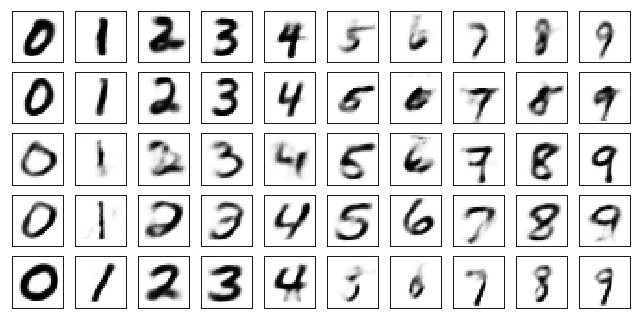

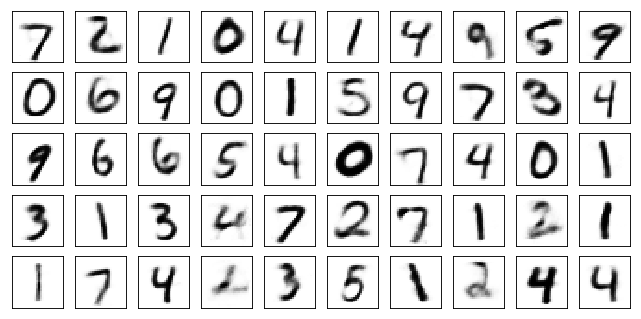

Test losses. E: 0.6958, AE: 0.0681, D: 0.6914
Train Epoch: 25 [0/50000 (0%)]	Losses E: 0.6968, AE: 0.0675, D: 0.6892
Train Epoch: 25 [5000/50000 (10%)]	Losses E: 0.7027, AE: 0.0632, D: 0.6911
Train Epoch: 25 [10000/50000 (20%)]	Losses E: 0.7056, AE: 0.0742, D: 0.6902
Train Epoch: 25 [15000/50000 (30%)]	Losses E: 0.6917, AE: 0.0614, D: 0.6939
Train Epoch: 25 [20000/50000 (40%)]	Losses E: 0.7001, AE: 0.0538, D: 0.6898
Train Epoch: 25 [25000/50000 (50%)]	Losses E: 0.6972, AE: 0.0771, D: 0.6960
Train Epoch: 25 [30000/50000 (60%)]	Losses E: 0.6895, AE: 0.0664, D: 0.6907
Train Epoch: 25 [35000/50000 (70%)]	Losses E: 0.6964, AE: 0.0712, D: 0.6923
Train Epoch: 25 [40000/50000 (80%)]	Losses E: 0.6907, AE: 0.0610, D: 0.6994
Train Epoch: 25 [45000/50000 (90%)]	Losses E: 0.6891, AE: 0.0645, D: 0.6960
Train Epoch: 25 [50000/50000 (100%)]	Losses E: 0.6986, AE: 0.0587, D: 0.6855


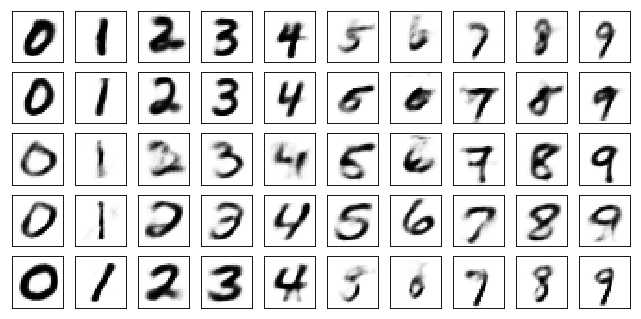

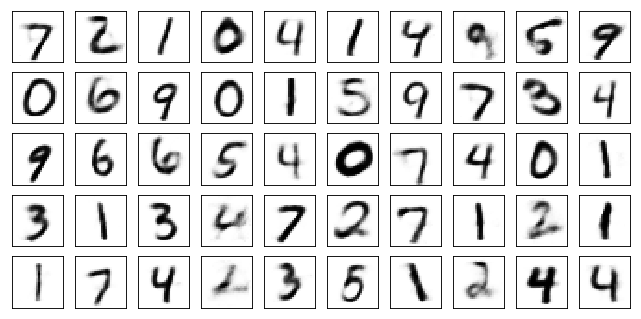

Test losses. E: 0.6947, AE: 0.0681, D: 0.6911
Train Epoch: 26 [0/50000 (0%)]	Losses E: 0.7016, AE: 0.0790, D: 0.6886
Train Epoch: 26 [5000/50000 (10%)]	Losses E: 0.6833, AE: 0.0661, D: 0.6956
Train Epoch: 26 [10000/50000 (20%)]	Losses E: 0.7098, AE: 0.0700, D: 0.6918
Train Epoch: 26 [15000/50000 (30%)]	Losses E: 0.7087, AE: 0.0671, D: 0.6901
Train Epoch: 26 [20000/50000 (40%)]	Losses E: 0.6920, AE: 0.0603, D: 0.6985
Train Epoch: 26 [25000/50000 (50%)]	Losses E: 0.6927, AE: 0.0657, D: 0.6999
Train Epoch: 26 [30000/50000 (60%)]	Losses E: 0.6921, AE: 0.0620, D: 0.6879
Train Epoch: 26 [35000/50000 (70%)]	Losses E: 0.7014, AE: 0.0751, D: 0.6950
Train Epoch: 26 [40000/50000 (80%)]	Losses E: 0.7012, AE: 0.0595, D: 0.6901
Train Epoch: 26 [45000/50000 (90%)]	Losses E: 0.6953, AE: 0.0672, D: 0.6934
Train Epoch: 26 [50000/50000 (100%)]	Losses E: 0.6905, AE: 0.0802, D: 0.6928


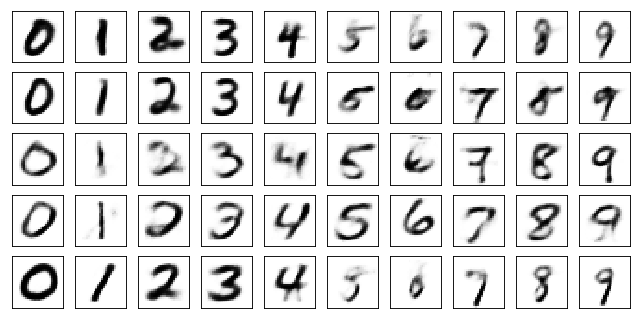

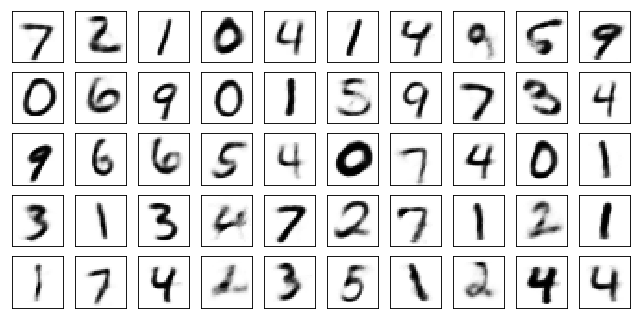

Test losses. E: 0.6884, AE: 0.0687, D: 0.6939
Train Epoch: 27 [0/50000 (0%)]	Losses E: 0.6918, AE: 0.0686, D: 0.6952
Train Epoch: 27 [5000/50000 (10%)]	Losses E: 0.7080, AE: 0.0652, D: 0.6913
Train Epoch: 27 [10000/50000 (20%)]	Losses E: 0.6957, AE: 0.0650, D: 0.6913
Train Epoch: 27 [15000/50000 (30%)]	Losses E: 0.6966, AE: 0.0578, D: 0.7000
Train Epoch: 27 [20000/50000 (40%)]	Losses E: 0.6960, AE: 0.0758, D: 0.6950
Train Epoch: 27 [25000/50000 (50%)]	Losses E: 0.6882, AE: 0.0666, D: 0.6885
Train Epoch: 27 [30000/50000 (60%)]	Losses E: 0.6986, AE: 0.0717, D: 0.6907
Train Epoch: 27 [35000/50000 (70%)]	Losses E: 0.7036, AE: 0.0683, D: 0.6889
Train Epoch: 27 [40000/50000 (80%)]	Losses E: 0.7026, AE: 0.0712, D: 0.6919
Train Epoch: 27 [45000/50000 (90%)]	Losses E: 0.6908, AE: 0.0659, D: 0.6965
Train Epoch: 27 [50000/50000 (100%)]	Losses E: 0.6923, AE: 0.0640, D: 0.6925


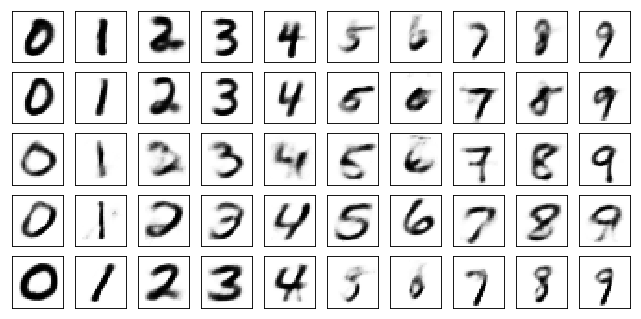

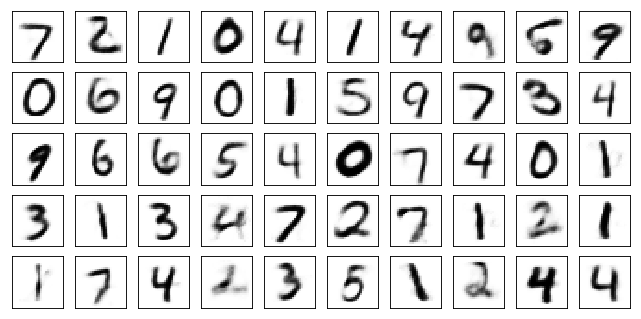

Test losses. E: 0.6891, AE: 0.0668, D: 0.6924
Train Epoch: 28 [0/50000 (0%)]	Losses E: 0.6931, AE: 0.0562, D: 0.6946
Train Epoch: 28 [5000/50000 (10%)]	Losses E: 0.7060, AE: 0.0622, D: 0.6956
Train Epoch: 28 [10000/50000 (20%)]	Losses E: 0.7015, AE: 0.0677, D: 0.6958
Train Epoch: 28 [15000/50000 (30%)]	Losses E: 0.6901, AE: 0.0746, D: 0.6959
Train Epoch: 28 [20000/50000 (40%)]	Losses E: 0.6993, AE: 0.0596, D: 0.6913
Train Epoch: 28 [25000/50000 (50%)]	Losses E: 0.6841, AE: 0.0565, D: 0.6989
Train Epoch: 28 [30000/50000 (60%)]	Losses E: 0.7018, AE: 0.0625, D: 0.6961
Train Epoch: 28 [35000/50000 (70%)]	Losses E: 0.6990, AE: 0.0645, D: 0.6970
Train Epoch: 28 [40000/50000 (80%)]	Losses E: 0.6947, AE: 0.0626, D: 0.6925
Train Epoch: 28 [45000/50000 (90%)]	Losses E: 0.6963, AE: 0.0642, D: 0.6890
Train Epoch: 28 [50000/50000 (100%)]	Losses E: 0.6881, AE: 0.0611, D: 0.6979


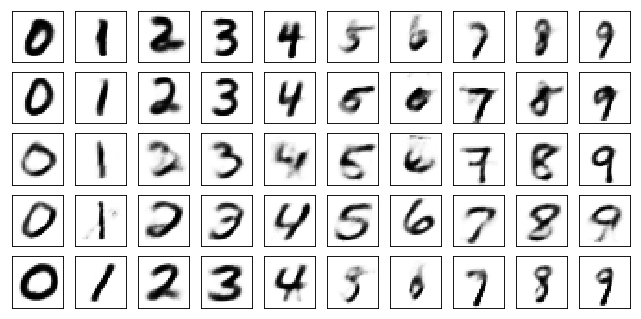

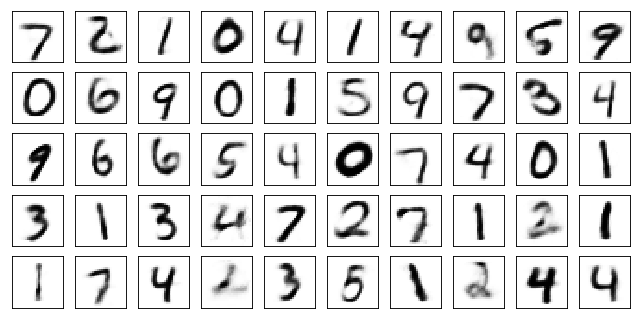

Test losses. E: 0.6898, AE: 0.0662, D: 0.6921
Train Epoch: 29 [0/50000 (0%)]	Losses E: 0.6786, AE: 0.0620, D: 0.6994
Train Epoch: 29 [5000/50000 (10%)]	Losses E: 0.6927, AE: 0.0648, D: 0.6889
Train Epoch: 29 [10000/50000 (20%)]	Losses E: 0.6951, AE: 0.0666, D: 0.6965
Train Epoch: 29 [15000/50000 (30%)]	Losses E: 0.6858, AE: 0.0725, D: 0.6986
Train Epoch: 29 [20000/50000 (40%)]	Losses E: 0.6968, AE: 0.0641, D: 0.6890
Train Epoch: 29 [25000/50000 (50%)]	Losses E: 0.6967, AE: 0.0663, D: 0.6838
Train Epoch: 29 [30000/50000 (60%)]	Losses E: 0.7072, AE: 0.0490, D: 0.6886
Train Epoch: 29 [35000/50000 (70%)]	Losses E: 0.6988, AE: 0.0572, D: 0.6941
Train Epoch: 29 [40000/50000 (80%)]	Losses E: 0.6938, AE: 0.0693, D: 0.6930
Train Epoch: 29 [45000/50000 (90%)]	Losses E: 0.7059, AE: 0.0594, D: 0.6890
Train Epoch: 29 [50000/50000 (100%)]	Losses E: 0.6900, AE: 0.0611, D: 0.6902


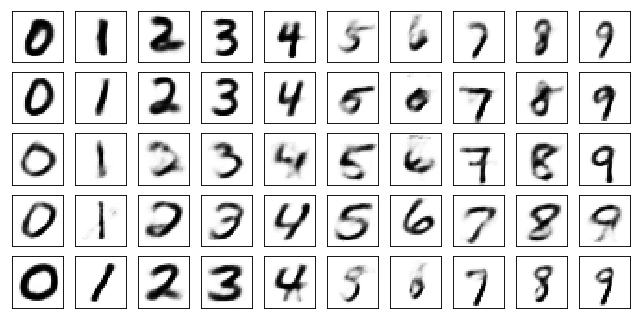

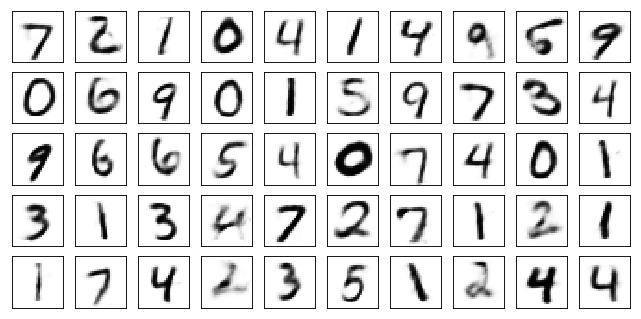

Test losses. E: 0.6922, AE: 0.0653, D: 0.6922
Train Epoch: 30 [0/50000 (0%)]	Losses E: 0.7001, AE: 0.0604, D: 0.6875
Train Epoch: 30 [5000/50000 (10%)]	Losses E: 0.6886, AE: 0.0663, D: 0.6925
Train Epoch: 30 [10000/50000 (20%)]	Losses E: 0.7014, AE: 0.0729, D: 0.6897
Train Epoch: 30 [15000/50000 (30%)]	Losses E: 0.6878, AE: 0.0647, D: 0.6938
Train Epoch: 30 [20000/50000 (40%)]	Losses E: 0.6934, AE: 0.0698, D: 0.6881
Train Epoch: 30 [25000/50000 (50%)]	Losses E: 0.6964, AE: 0.0674, D: 0.6919
Train Epoch: 30 [30000/50000 (60%)]	Losses E: 0.6876, AE: 0.0638, D: 0.6998
Train Epoch: 30 [35000/50000 (70%)]	Losses E: 0.6935, AE: 0.0672, D: 0.6984
Train Epoch: 30 [40000/50000 (80%)]	Losses E: 0.6861, AE: 0.0643, D: 0.6917
Train Epoch: 30 [45000/50000 (90%)]	Losses E: 0.7006, AE: 0.0617, D: 0.6942
Train Epoch: 30 [50000/50000 (100%)]	Losses E: 0.7120, AE: 0.0579, D: 0.6941


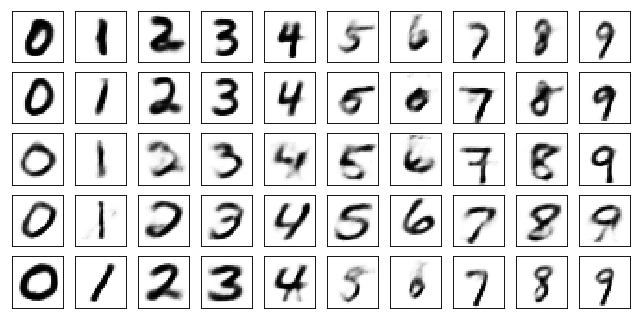

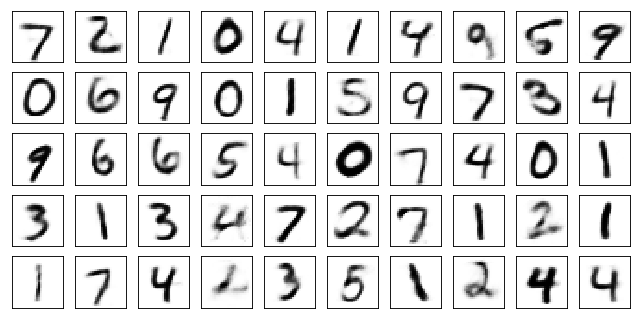

Test losses. E: 0.7066, AE: 0.0642, D: 0.6910
Train Epoch: 31 [0/50000 (0%)]	Losses E: 0.7125, AE: 0.0569, D: 0.6871
Train Epoch: 31 [5000/50000 (10%)]	Losses E: 0.6946, AE: 0.0707, D: 0.6924
Train Epoch: 31 [10000/50000 (20%)]	Losses E: 0.6884, AE: 0.0738, D: 0.6949
Train Epoch: 31 [15000/50000 (30%)]	Losses E: 0.6963, AE: 0.0654, D: 0.6993
Train Epoch: 31 [20000/50000 (40%)]	Losses E: 0.7020, AE: 0.0544, D: 0.6889
Train Epoch: 31 [25000/50000 (50%)]	Losses E: 0.6858, AE: 0.0616, D: 0.6956
Train Epoch: 31 [30000/50000 (60%)]	Losses E: 0.6940, AE: 0.0680, D: 0.6962
Train Epoch: 31 [35000/50000 (70%)]	Losses E: 0.7074, AE: 0.0606, D: 0.6920
Train Epoch: 31 [40000/50000 (80%)]	Losses E: 0.6939, AE: 0.0657, D: 0.6966
Train Epoch: 31 [45000/50000 (90%)]	Losses E: 0.6778, AE: 0.0543, D: 0.6986
Train Epoch: 31 [50000/50000 (100%)]	Losses E: 0.6887, AE: 0.0609, D: 0.6941


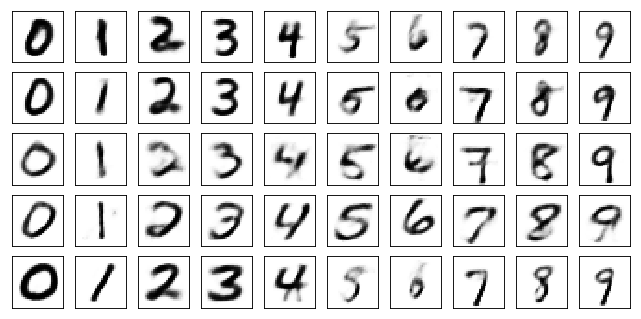

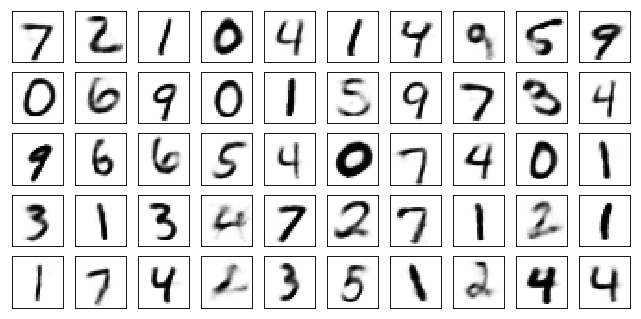

Test losses. E: 0.6906, AE: 0.0659, D: 0.6942
Train Epoch: 32 [0/50000 (0%)]	Losses E: 0.6910, AE: 0.0699, D: 0.6956
Train Epoch: 32 [5000/50000 (10%)]	Losses E: 0.6942, AE: 0.0617, D: 0.6855
Train Epoch: 32 [10000/50000 (20%)]	Losses E: 0.7016, AE: 0.0630, D: 0.6865
Train Epoch: 32 [15000/50000 (30%)]	Losses E: 0.6979, AE: 0.0602, D: 0.6932
Train Epoch: 32 [20000/50000 (40%)]	Losses E: 0.6874, AE: 0.0690, D: 0.6900
Train Epoch: 32 [25000/50000 (50%)]	Losses E: 0.6938, AE: 0.0684, D: 0.6922
Train Epoch: 32 [30000/50000 (60%)]	Losses E: 0.6940, AE: 0.0662, D: 0.6971
Train Epoch: 32 [35000/50000 (70%)]	Losses E: 0.6985, AE: 0.0621, D: 0.6855
Train Epoch: 32 [40000/50000 (80%)]	Losses E: 0.6969, AE: 0.0726, D: 0.6945
Train Epoch: 32 [45000/50000 (90%)]	Losses E: 0.6989, AE: 0.0660, D: 0.6890
Train Epoch: 32 [50000/50000 (100%)]	Losses E: 0.6830, AE: 0.0733, D: 0.6926


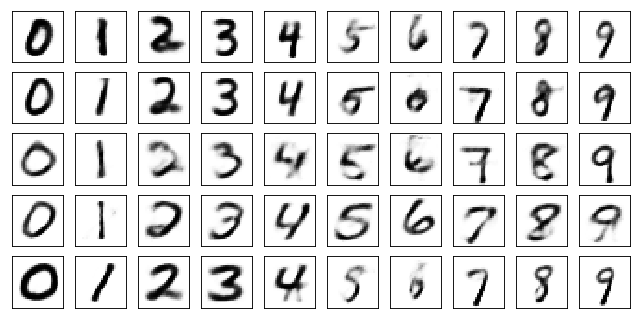

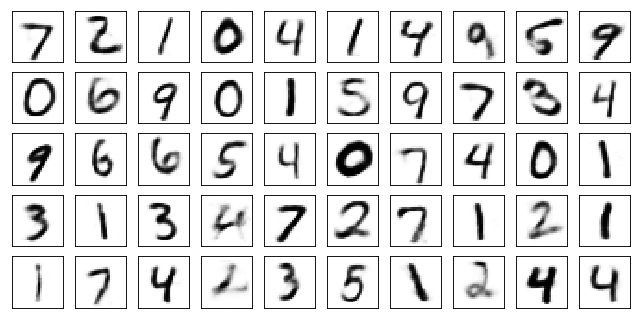

Test losses. E: 0.6863, AE: 0.0632, D: 0.6909
Train Epoch: 33 [0/50000 (0%)]	Losses E: 0.6870, AE: 0.0610, D: 0.6976
Train Epoch: 33 [5000/50000 (10%)]	Losses E: 0.6912, AE: 0.0608, D: 0.6907
Train Epoch: 33 [10000/50000 (20%)]	Losses E: 0.6983, AE: 0.0602, D: 0.6947
Train Epoch: 33 [15000/50000 (30%)]	Losses E: 0.7069, AE: 0.0600, D: 0.6960
Train Epoch: 33 [20000/50000 (40%)]	Losses E: 0.6947, AE: 0.0724, D: 0.6976
Train Epoch: 33 [25000/50000 (50%)]	Losses E: 0.6949, AE: 0.0664, D: 0.6919
Train Epoch: 33 [30000/50000 (60%)]	Losses E: 0.7014, AE: 0.0632, D: 0.6942
Train Epoch: 33 [35000/50000 (70%)]	Losses E: 0.6962, AE: 0.0666, D: 0.6968
Train Epoch: 33 [40000/50000 (80%)]	Losses E: 0.6909, AE: 0.0629, D: 0.6888
Train Epoch: 33 [45000/50000 (90%)]	Losses E: 0.6892, AE: 0.0626, D: 0.6955
Train Epoch: 33 [50000/50000 (100%)]	Losses E: 0.7084, AE: 0.0619, D: 0.6910


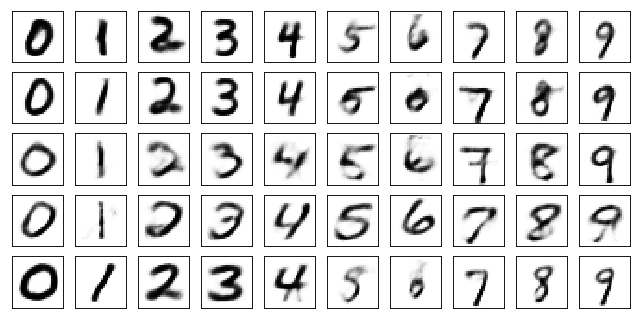

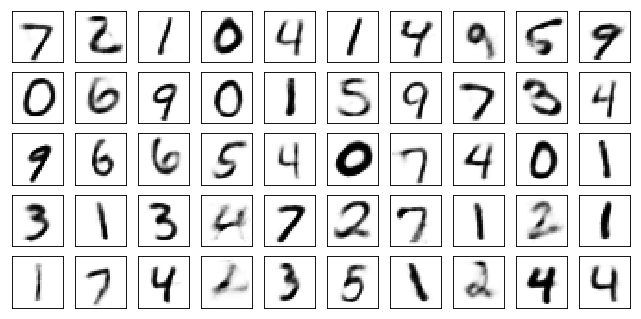

Test losses. E: 0.6983, AE: 0.0623, D: 0.6906
Train Epoch: 34 [0/50000 (0%)]	Losses E: 0.7051, AE: 0.0644, D: 0.6808
Train Epoch: 34 [5000/50000 (10%)]	Losses E: 0.6927, AE: 0.0634, D: 0.6926
Train Epoch: 34 [10000/50000 (20%)]	Losses E: 0.7007, AE: 0.0643, D: 0.6828
Train Epoch: 34 [15000/50000 (30%)]	Losses E: 0.7011, AE: 0.0670, D: 0.6969
Train Epoch: 34 [20000/50000 (40%)]	Losses E: 0.6973, AE: 0.0577, D: 0.6920
Train Epoch: 34 [25000/50000 (50%)]	Losses E: 0.7002, AE: 0.0621, D: 0.6861
Train Epoch: 34 [30000/50000 (60%)]	Losses E: 0.6970, AE: 0.0575, D: 0.6886
Train Epoch: 34 [35000/50000 (70%)]	Losses E: 0.6930, AE: 0.0594, D: 0.6953
Train Epoch: 34 [40000/50000 (80%)]	Losses E: 0.6899, AE: 0.0560, D: 0.7034
Train Epoch: 34 [45000/50000 (90%)]	Losses E: 0.6937, AE: 0.0599, D: 0.6984
Train Epoch: 34 [50000/50000 (100%)]	Losses E: 0.7007, AE: 0.0584, D: 0.6934


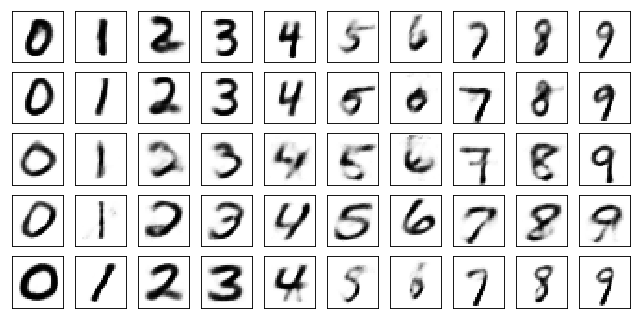

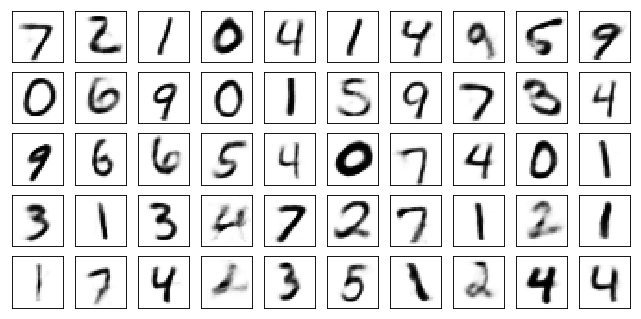

Test losses. E: 0.6924, AE: 0.0621, D: 0.6916
Train Epoch: 35 [0/50000 (0%)]	Losses E: 0.6968, AE: 0.0674, D: 0.6890
Train Epoch: 35 [5000/50000 (10%)]	Losses E: 0.6943, AE: 0.0658, D: 0.6924
Train Epoch: 35 [10000/50000 (20%)]	Losses E: 0.6856, AE: 0.0618, D: 0.6968
Train Epoch: 35 [15000/50000 (30%)]	Losses E: 0.7034, AE: 0.0598, D: 0.6905
Train Epoch: 35 [20000/50000 (40%)]	Losses E: 0.7058, AE: 0.0685, D: 0.6933
Train Epoch: 35 [25000/50000 (50%)]	Losses E: 0.6947, AE: 0.0551, D: 0.6922
Train Epoch: 35 [30000/50000 (60%)]	Losses E: 0.6961, AE: 0.0589, D: 0.7014
Train Epoch: 35 [35000/50000 (70%)]	Losses E: 0.6891, AE: 0.0573, D: 0.6980
Train Epoch: 35 [40000/50000 (80%)]	Losses E: 0.6990, AE: 0.0637, D: 0.6920
Train Epoch: 35 [45000/50000 (90%)]	Losses E: 0.6949, AE: 0.0594, D: 0.6921
Train Epoch: 35 [50000/50000 (100%)]	Losses E: 0.6928, AE: 0.0710, D: 0.6987


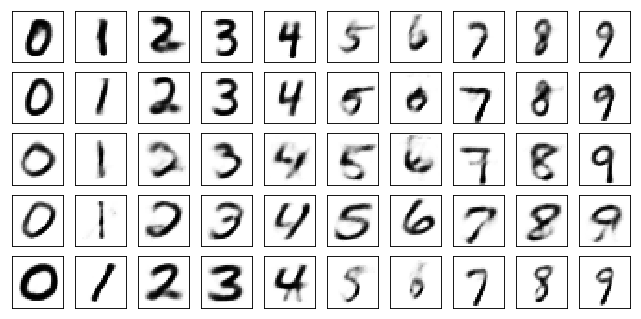

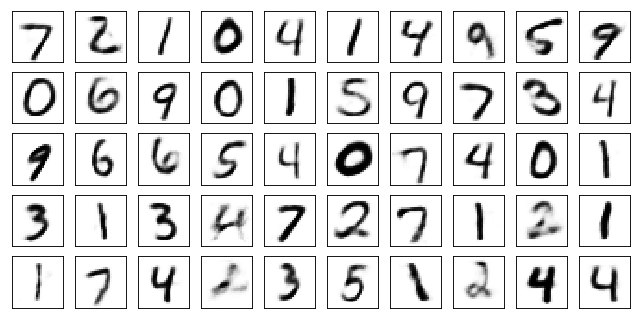

Test losses. E: 0.6918, AE: 0.0625, D: 0.6918
Train Epoch: 36 [0/50000 (0%)]	Losses E: 0.6986, AE: 0.0565, D: 0.6935
Train Epoch: 36 [5000/50000 (10%)]	Losses E: 0.7028, AE: 0.0658, D: 0.6951
Train Epoch: 36 [10000/50000 (20%)]	Losses E: 0.6962, AE: 0.0521, D: 0.6978
Train Epoch: 36 [15000/50000 (30%)]	Losses E: 0.6935, AE: 0.0654, D: 0.6952
Train Epoch: 36 [20000/50000 (40%)]	Losses E: 0.6944, AE: 0.0494, D: 0.6912
Train Epoch: 36 [25000/50000 (50%)]	Losses E: 0.7018, AE: 0.0594, D: 0.6904
Train Epoch: 36 [30000/50000 (60%)]	Losses E: 0.6741, AE: 0.0599, D: 0.6960
Train Epoch: 36 [35000/50000 (70%)]	Losses E: 0.6796, AE: 0.0704, D: 0.6941
Train Epoch: 36 [40000/50000 (80%)]	Losses E: 0.6860, AE: 0.0588, D: 0.6948
Train Epoch: 36 [45000/50000 (90%)]	Losses E: 0.7009, AE: 0.0606, D: 0.6941
Train Epoch: 36 [50000/50000 (100%)]	Losses E: 0.6925, AE: 0.0578, D: 0.6824


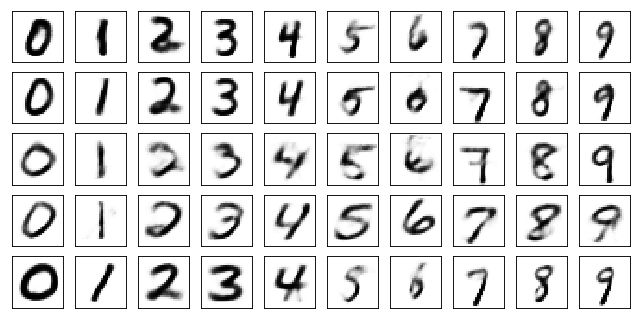

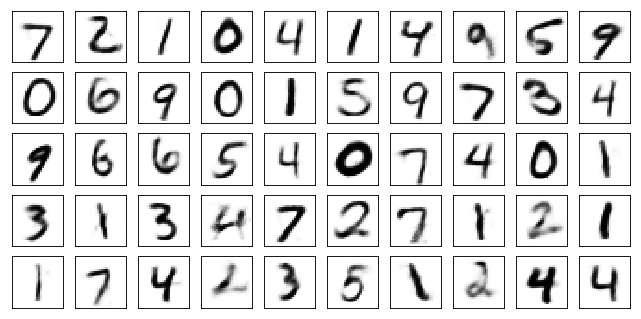

Test losses. E: 0.6935, AE: 0.0621, D: 0.6920
Train Epoch: 37 [0/50000 (0%)]	Losses E: 0.6930, AE: 0.0545, D: 0.6970
Train Epoch: 37 [5000/50000 (10%)]	Losses E: 0.6871, AE: 0.0730, D: 0.7012
Train Epoch: 37 [10000/50000 (20%)]	Losses E: 0.6874, AE: 0.0649, D: 0.6919
Train Epoch: 37 [15000/50000 (30%)]	Losses E: 0.6919, AE: 0.0661, D: 0.6968
Train Epoch: 37 [20000/50000 (40%)]	Losses E: 0.6972, AE: 0.0656, D: 0.6941
Train Epoch: 37 [25000/50000 (50%)]	Losses E: 0.7005, AE: 0.0617, D: 0.6941
Train Epoch: 37 [30000/50000 (60%)]	Losses E: 0.6906, AE: 0.0537, D: 0.6886
Train Epoch: 37 [35000/50000 (70%)]	Losses E: 0.6954, AE: 0.0606, D: 0.6902
Train Epoch: 37 [40000/50000 (80%)]	Losses E: 0.7050, AE: 0.0622, D: 0.6959
Train Epoch: 37 [45000/50000 (90%)]	Losses E: 0.6961, AE: 0.0613, D: 0.6891
Train Epoch: 37 [50000/50000 (100%)]	Losses E: 0.7036, AE: 0.0565, D: 0.7025


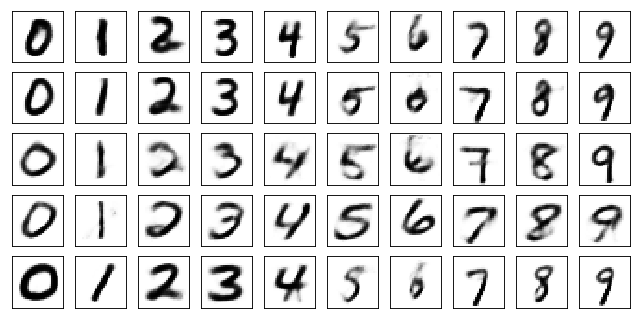

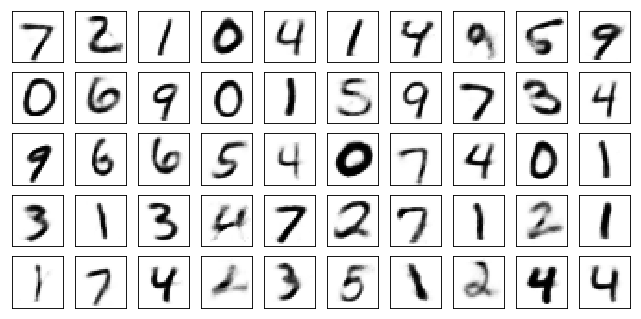

Test losses. E: 0.6973, AE: 0.0623, D: 0.6924
Train Epoch: 38 [0/50000 (0%)]	Losses E: 0.6951, AE: 0.0592, D: 0.6924
Train Epoch: 38 [5000/50000 (10%)]	Losses E: 0.7032, AE: 0.0637, D: 0.6897
Train Epoch: 38 [10000/50000 (20%)]	Losses E: 0.7043, AE: 0.0745, D: 0.6879
Train Epoch: 38 [15000/50000 (30%)]	Losses E: 0.7041, AE: 0.0684, D: 0.6888
Train Epoch: 38 [20000/50000 (40%)]	Losses E: 0.6997, AE: 0.0620, D: 0.6865
Train Epoch: 38 [25000/50000 (50%)]	Losses E: 0.6923, AE: 0.0604, D: 0.6932
Train Epoch: 38 [30000/50000 (60%)]	Losses E: 0.6931, AE: 0.0567, D: 0.6926
Train Epoch: 38 [35000/50000 (70%)]	Losses E: 0.7035, AE: 0.0623, D: 0.6941
Train Epoch: 38 [40000/50000 (80%)]	Losses E: 0.6901, AE: 0.0661, D: 0.6954
Train Epoch: 38 [45000/50000 (90%)]	Losses E: 0.6841, AE: 0.0777, D: 0.6915
Train Epoch: 38 [50000/50000 (100%)]	Losses E: 0.6901, AE: 0.0607, D: 0.6910


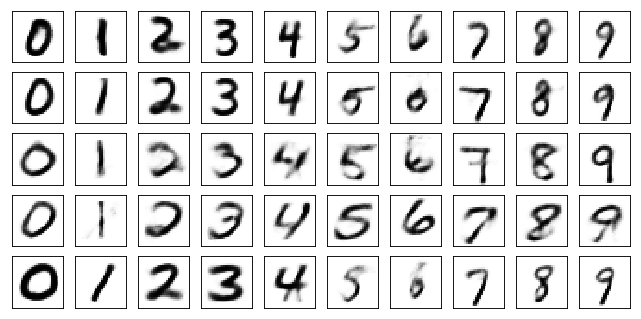

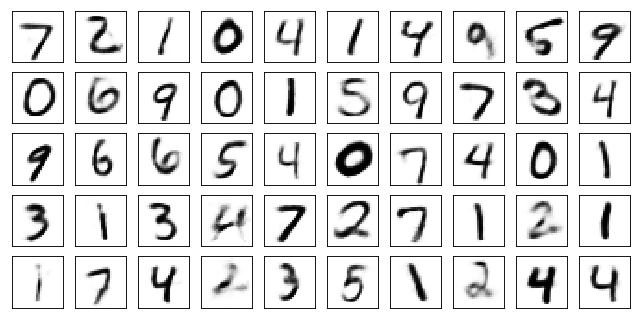

Test losses. E: 0.6914, AE: 0.0613, D: 0.6919
Train Epoch: 39 [0/50000 (0%)]	Losses E: 0.6978, AE: 0.0542, D: 0.6896
Train Epoch: 39 [5000/50000 (10%)]	Losses E: 0.6942, AE: 0.0554, D: 0.6917
Train Epoch: 39 [10000/50000 (20%)]	Losses E: 0.6871, AE: 0.0542, D: 0.6978
Train Epoch: 39 [15000/50000 (30%)]	Losses E: 0.6961, AE: 0.0512, D: 0.6958
Train Epoch: 39 [20000/50000 (40%)]	Losses E: 0.6949, AE: 0.0626, D: 0.6907
Train Epoch: 39 [25000/50000 (50%)]	Losses E: 0.7009, AE: 0.0528, D: 0.6977
Train Epoch: 39 [30000/50000 (60%)]	Losses E: 0.6969, AE: 0.0640, D: 0.6905
Train Epoch: 39 [35000/50000 (70%)]	Losses E: 0.6960, AE: 0.0606, D: 0.6972
Train Epoch: 39 [40000/50000 (80%)]	Losses E: 0.6873, AE: 0.0733, D: 0.6935
Train Epoch: 39 [45000/50000 (90%)]	Losses E: 0.6860, AE: 0.0546, D: 0.6949
Train Epoch: 39 [50000/50000 (100%)]	Losses E: 0.6923, AE: 0.0688, D: 0.6965


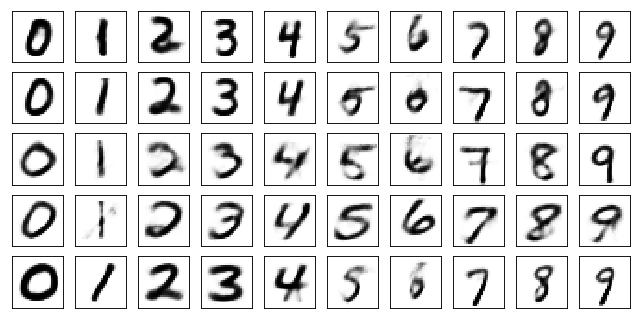

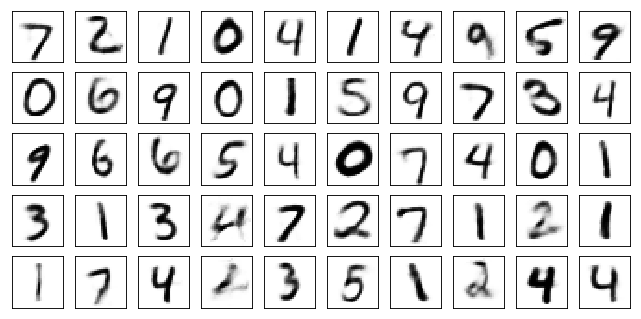

Test losses. E: 0.6908, AE: 0.0613, D: 0.6923
Train Epoch: 40 [0/50000 (0%)]	Losses E: 0.6978, AE: 0.0521, D: 0.6887
Train Epoch: 40 [5000/50000 (10%)]	Losses E: 0.7034, AE: 0.0531, D: 0.6932
Train Epoch: 40 [10000/50000 (20%)]	Losses E: 0.6928, AE: 0.0567, D: 0.6945
Train Epoch: 40 [15000/50000 (30%)]	Losses E: 0.6989, AE: 0.0623, D: 0.6941
Train Epoch: 40 [20000/50000 (40%)]	Losses E: 0.6947, AE: 0.0624, D: 0.6966
Train Epoch: 40 [25000/50000 (50%)]	Losses E: 0.7001, AE: 0.0632, D: 0.6946
Train Epoch: 40 [30000/50000 (60%)]	Losses E: 0.7105, AE: 0.0560, D: 0.6951
Train Epoch: 40 [35000/50000 (70%)]	Losses E: 0.6983, AE: 0.0591, D: 0.6897
Train Epoch: 40 [40000/50000 (80%)]	Losses E: 0.6923, AE: 0.0577, D: 0.6938
Train Epoch: 40 [45000/50000 (90%)]	Losses E: 0.6876, AE: 0.0663, D: 0.6922
Train Epoch: 40 [50000/50000 (100%)]	Losses E: 0.6950, AE: 0.0533, D: 0.6932


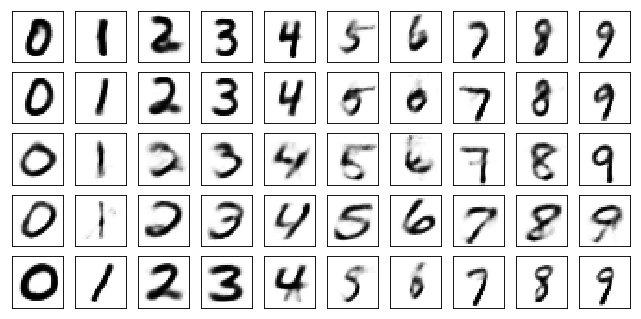

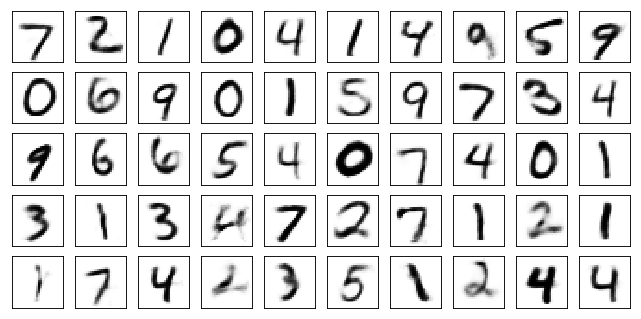

Test losses. E: 0.6923, AE: 0.0613, D: 0.6935
Train Epoch: 41 [0/50000 (0%)]	Losses E: 0.6862, AE: 0.0659, D: 0.6987
Train Epoch: 41 [5000/50000 (10%)]	Losses E: 0.6949, AE: 0.0624, D: 0.6985
Train Epoch: 41 [10000/50000 (20%)]	Losses E: 0.6921, AE: 0.0660, D: 0.6952
Train Epoch: 41 [15000/50000 (30%)]	Losses E: 0.7078, AE: 0.0536, D: 0.6903
Train Epoch: 41 [20000/50000 (40%)]	Losses E: 0.6944, AE: 0.0577, D: 0.6939
Train Epoch: 41 [25000/50000 (50%)]	Losses E: 0.6870, AE: 0.0619, D: 0.6933
Train Epoch: 41 [30000/50000 (60%)]	Losses E: 0.6944, AE: 0.0619, D: 0.6881
Train Epoch: 41 [35000/50000 (70%)]	Losses E: 0.6964, AE: 0.0600, D: 0.6912
Train Epoch: 41 [40000/50000 (80%)]	Losses E: 0.6933, AE: 0.0672, D: 0.6963
Train Epoch: 41 [45000/50000 (90%)]	Losses E: 0.6950, AE: 0.0544, D: 0.6877
Train Epoch: 41 [50000/50000 (100%)]	Losses E: 0.7067, AE: 0.0586, D: 0.6935


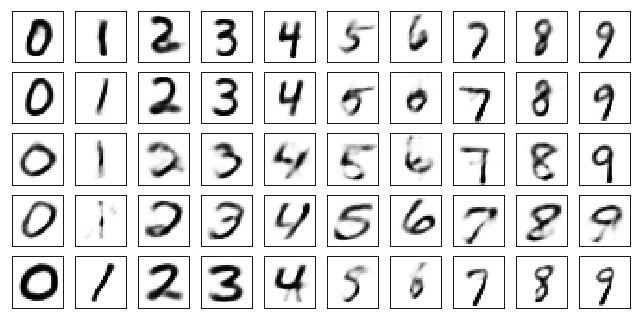

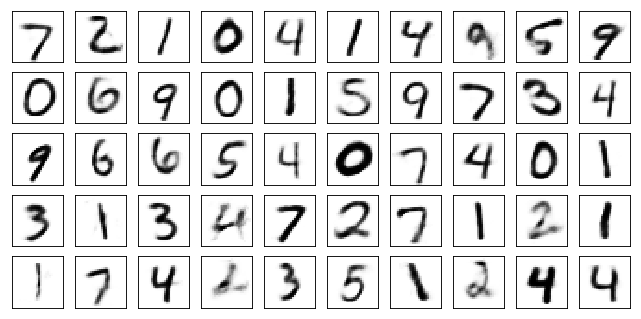

Test losses. E: 0.7070, AE: 0.0604, D: 0.6900
Train Epoch: 42 [0/50000 (0%)]	Losses E: 0.7074, AE: 0.0595, D: 0.6943
Train Epoch: 42 [5000/50000 (10%)]	Losses E: 0.6816, AE: 0.0626, D: 0.6955
Train Epoch: 42 [10000/50000 (20%)]	Losses E: 0.6912, AE: 0.0580, D: 0.6883
Train Epoch: 42 [15000/50000 (30%)]	Losses E: 0.7060, AE: 0.0557, D: 0.6976
Train Epoch: 42 [20000/50000 (40%)]	Losses E: 0.6935, AE: 0.0614, D: 0.6916
Train Epoch: 42 [25000/50000 (50%)]	Losses E: 0.6960, AE: 0.0493, D: 0.6948
Train Epoch: 42 [30000/50000 (60%)]	Losses E: 0.7020, AE: 0.0532, D: 0.6922
Train Epoch: 42 [35000/50000 (70%)]	Losses E: 0.6878, AE: 0.0534, D: 0.6931
Train Epoch: 42 [40000/50000 (80%)]	Losses E: 0.7021, AE: 0.0477, D: 0.6842
Train Epoch: 42 [45000/50000 (90%)]	Losses E: 0.6925, AE: 0.0545, D: 0.6940
Train Epoch: 42 [50000/50000 (100%)]	Losses E: 0.6886, AE: 0.0598, D: 0.6926


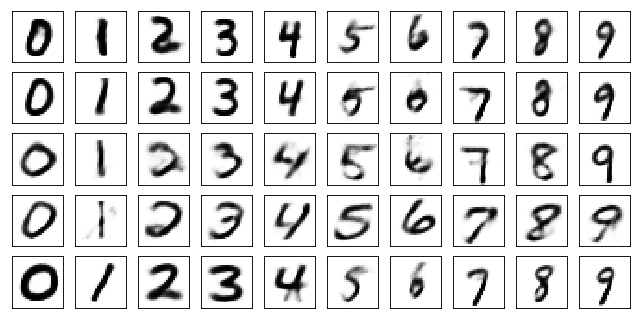

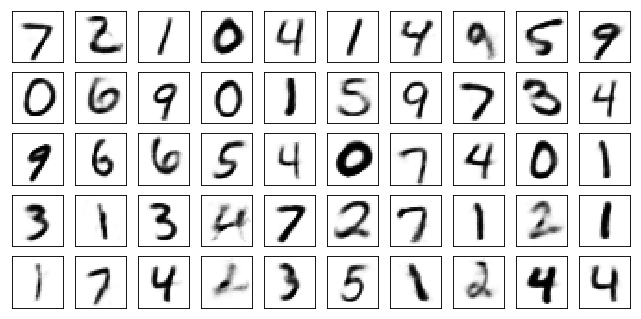

Test losses. E: 0.6911, AE: 0.0599, D: 0.6912
Train Epoch: 43 [0/50000 (0%)]	Losses E: 0.6854, AE: 0.0619, D: 0.6937
Train Epoch: 43 [5000/50000 (10%)]	Losses E: 0.6986, AE: 0.0570, D: 0.6959
Train Epoch: 43 [10000/50000 (20%)]	Losses E: 0.6888, AE: 0.0486, D: 0.6932
Train Epoch: 43 [15000/50000 (30%)]	Losses E: 0.6938, AE: 0.0500, D: 0.6967
Train Epoch: 43 [20000/50000 (40%)]	Losses E: 0.6859, AE: 0.0596, D: 0.7012
Train Epoch: 43 [25000/50000 (50%)]	Losses E: 0.6996, AE: 0.0544, D: 0.6916
Train Epoch: 43 [30000/50000 (60%)]	Losses E: 0.6999, AE: 0.0509, D: 0.6959
Train Epoch: 43 [35000/50000 (70%)]	Losses E: 0.7037, AE: 0.0559, D: 0.6895
Train Epoch: 43 [40000/50000 (80%)]	Losses E: 0.7050, AE: 0.0528, D: 0.6917
Train Epoch: 43 [45000/50000 (90%)]	Losses E: 0.6884, AE: 0.0619, D: 0.6901
Train Epoch: 43 [50000/50000 (100%)]	Losses E: 0.6895, AE: 0.0621, D: 0.7008


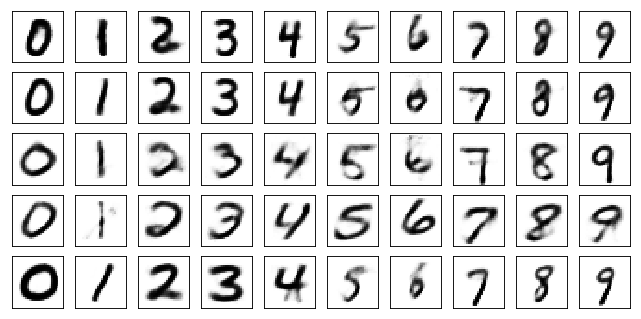

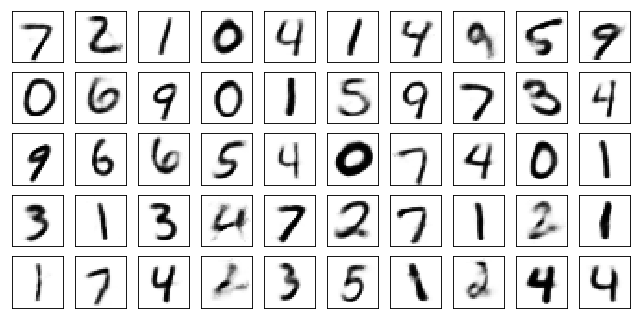

Test losses. E: 0.6951, AE: 0.0601, D: 0.6922
Train Epoch: 44 [0/50000 (0%)]	Losses E: 0.6987, AE: 0.0476, D: 0.6858
Train Epoch: 44 [5000/50000 (10%)]	Losses E: 0.6925, AE: 0.0634, D: 0.6890
Train Epoch: 44 [10000/50000 (20%)]	Losses E: 0.6968, AE: 0.0485, D: 0.6872
Train Epoch: 44 [15000/50000 (30%)]	Losses E: 0.7055, AE: 0.0592, D: 0.6961
Train Epoch: 44 [20000/50000 (40%)]	Losses E: 0.7046, AE: 0.0567, D: 0.6883
Train Epoch: 44 [25000/50000 (50%)]	Losses E: 0.6944, AE: 0.0606, D: 0.6826
Train Epoch: 44 [30000/50000 (60%)]	Losses E: 0.6968, AE: 0.0622, D: 0.6896
Train Epoch: 44 [35000/50000 (70%)]	Losses E: 0.6984, AE: 0.0591, D: 0.6868
Train Epoch: 44 [40000/50000 (80%)]	Losses E: 0.6862, AE: 0.0621, D: 0.6930
Train Epoch: 44 [45000/50000 (90%)]	Losses E: 0.7035, AE: 0.0487, D: 0.6952
Train Epoch: 44 [50000/50000 (100%)]	Losses E: 0.7062, AE: 0.0581, D: 0.6853


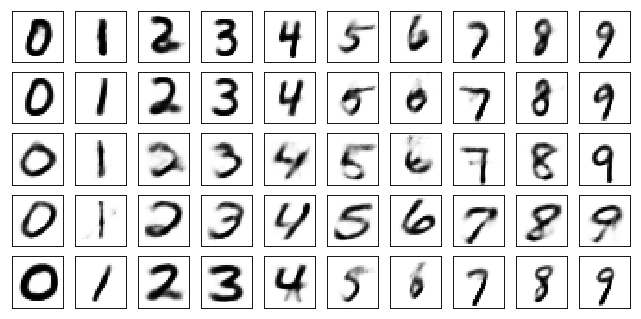

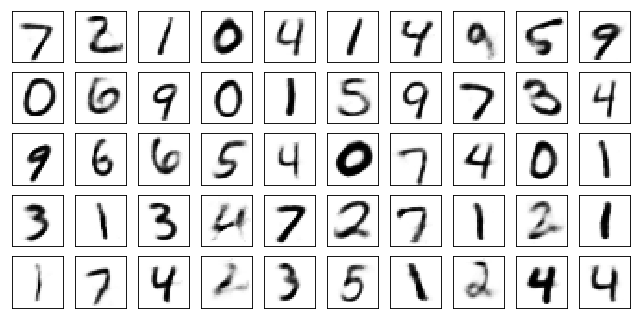

Test losses. E: 0.6974, AE: 0.0585, D: 0.6917
Train Epoch: 45 [0/50000 (0%)]	Losses E: 0.6937, AE: 0.0681, D: 0.6967
Train Epoch: 45 [5000/50000 (10%)]	Losses E: 0.6933, AE: 0.0669, D: 0.6928
Train Epoch: 45 [10000/50000 (20%)]	Losses E: 0.6979, AE: 0.0504, D: 0.6904
Train Epoch: 45 [15000/50000 (30%)]	Losses E: 0.6889, AE: 0.0564, D: 0.6974
Train Epoch: 45 [20000/50000 (40%)]	Losses E: 0.6854, AE: 0.0559, D: 0.6930
Train Epoch: 45 [25000/50000 (50%)]	Losses E: 0.6815, AE: 0.0584, D: 0.6936
Train Epoch: 45 [30000/50000 (60%)]	Losses E: 0.6926, AE: 0.0627, D: 0.6971
Train Epoch: 45 [35000/50000 (70%)]	Losses E: 0.6962, AE: 0.0627, D: 0.6947
Train Epoch: 45 [40000/50000 (80%)]	Losses E: 0.6938, AE: 0.0558, D: 0.6830
Train Epoch: 45 [45000/50000 (90%)]	Losses E: 0.6923, AE: 0.0548, D: 0.6930
Train Epoch: 45 [50000/50000 (100%)]	Losses E: 0.7038, AE: 0.0503, D: 0.6956


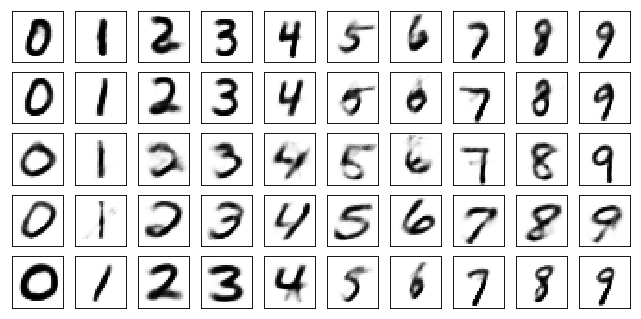

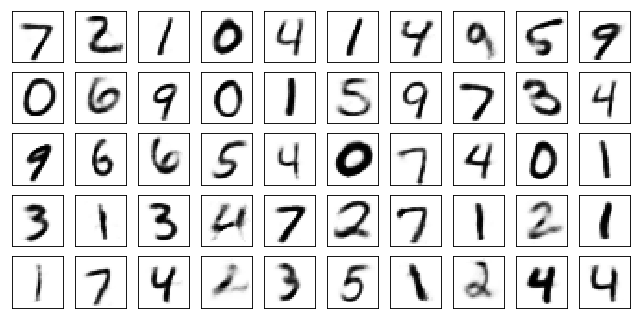

Test losses. E: 0.7026, AE: 0.0601, D: 0.6922
Train Epoch: 46 [0/50000 (0%)]	Losses E: 0.7133, AE: 0.0518, D: 0.6937
Train Epoch: 46 [5000/50000 (10%)]	Losses E: 0.6966, AE: 0.0579, D: 0.6912
Train Epoch: 46 [10000/50000 (20%)]	Losses E: 0.6853, AE: 0.0575, D: 0.6950
Train Epoch: 46 [15000/50000 (30%)]	Losses E: 0.6894, AE: 0.0538, D: 0.6952
Train Epoch: 46 [20000/50000 (40%)]	Losses E: 0.7027, AE: 0.0592, D: 0.6895
Train Epoch: 46 [25000/50000 (50%)]	Losses E: 0.6946, AE: 0.0614, D: 0.6885
Train Epoch: 46 [30000/50000 (60%)]	Losses E: 0.6851, AE: 0.0638, D: 0.6933
Train Epoch: 46 [35000/50000 (70%)]	Losses E: 0.6930, AE: 0.0528, D: 0.6920
Train Epoch: 46 [40000/50000 (80%)]	Losses E: 0.6939, AE: 0.0531, D: 0.6924
Train Epoch: 46 [45000/50000 (90%)]	Losses E: 0.7111, AE: 0.0566, D: 0.6901
Train Epoch: 46 [50000/50000 (100%)]	Losses E: 0.7107, AE: 0.0471, D: 0.6909


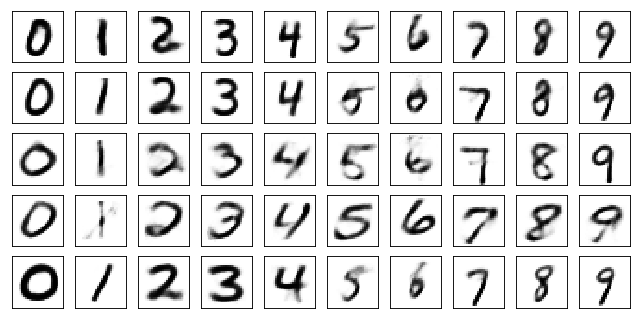

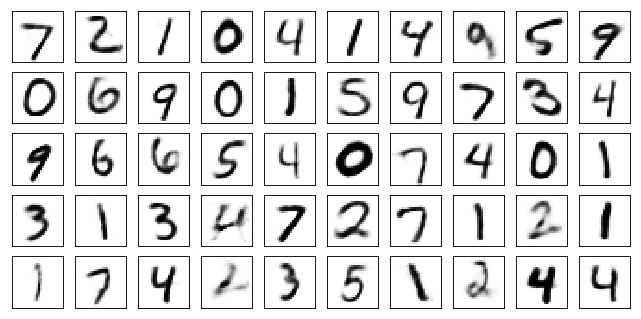

Test losses. E: 0.6979, AE: 0.0584, D: 0.6919
Train Epoch: 47 [0/50000 (0%)]	Losses E: 0.6983, AE: 0.0567, D: 0.6989
Train Epoch: 47 [5000/50000 (10%)]	Losses E: 0.6959, AE: 0.0521, D: 0.6897
Train Epoch: 47 [10000/50000 (20%)]	Losses E: 0.7037, AE: 0.0597, D: 0.6907
Train Epoch: 47 [15000/50000 (30%)]	Losses E: 0.7074, AE: 0.0557, D: 0.6842
Train Epoch: 47 [20000/50000 (40%)]	Losses E: 0.6914, AE: 0.0516, D: 0.6875
Train Epoch: 47 [25000/50000 (50%)]	Losses E: 0.7015, AE: 0.0493, D: 0.6909
Train Epoch: 47 [30000/50000 (60%)]	Losses E: 0.6927, AE: 0.0604, D: 0.6957
Train Epoch: 47 [35000/50000 (70%)]	Losses E: 0.6990, AE: 0.0554, D: 0.6933
Train Epoch: 47 [40000/50000 (80%)]	Losses E: 0.7006, AE: 0.0507, D: 0.6933
Train Epoch: 47 [45000/50000 (90%)]	Losses E: 0.6933, AE: 0.0547, D: 0.6940
Train Epoch: 47 [50000/50000 (100%)]	Losses E: 0.6867, AE: 0.0539, D: 0.6932


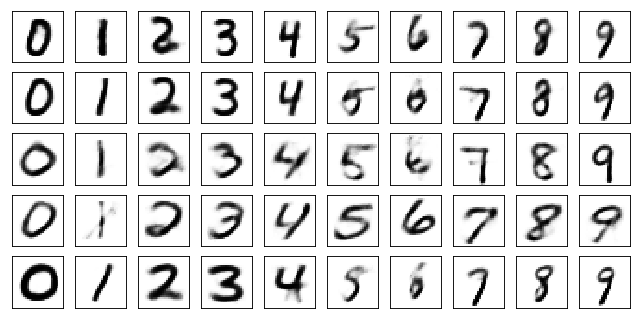

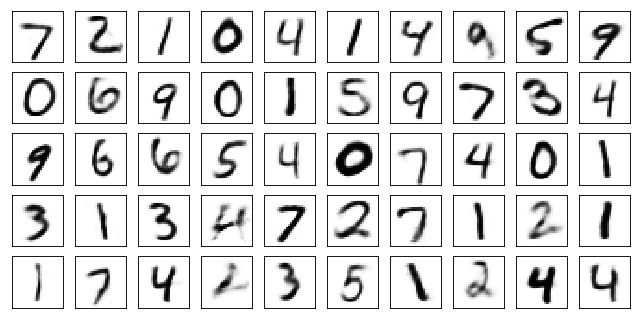

Test losses. E: 0.6842, AE: 0.0591, D: 0.6923
Train Epoch: 48 [0/50000 (0%)]	Losses E: 0.6843, AE: 0.0580, D: 0.6868
Train Epoch: 48 [5000/50000 (10%)]	Losses E: 0.6855, AE: 0.0543, D: 0.6969
Train Epoch: 48 [10000/50000 (20%)]	Losses E: 0.6899, AE: 0.0509, D: 0.6957
Train Epoch: 48 [15000/50000 (30%)]	Losses E: 0.6927, AE: 0.0592, D: 0.6988
Train Epoch: 48 [20000/50000 (40%)]	Losses E: 0.6888, AE: 0.0577, D: 0.7029
Train Epoch: 48 [25000/50000 (50%)]	Losses E: 0.6962, AE: 0.0575, D: 0.6985
Train Epoch: 48 [30000/50000 (60%)]	Losses E: 0.7058, AE: 0.0561, D: 0.6963
Train Epoch: 48 [35000/50000 (70%)]	Losses E: 0.6883, AE: 0.0488, D: 0.6978
Train Epoch: 48 [40000/50000 (80%)]	Losses E: 0.6879, AE: 0.0565, D: 0.6899
Train Epoch: 48 [45000/50000 (90%)]	Losses E: 0.6943, AE: 0.0553, D: 0.6940
Train Epoch: 48 [50000/50000 (100%)]	Losses E: 0.6987, AE: 0.0464, D: 0.6919


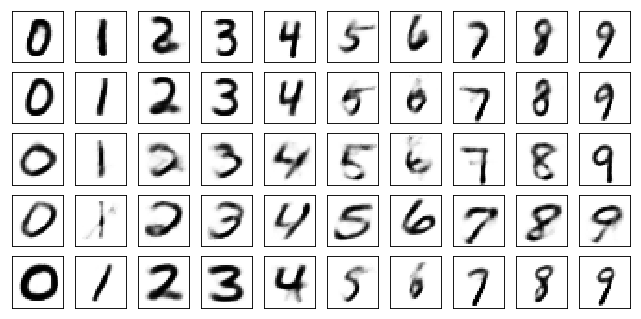

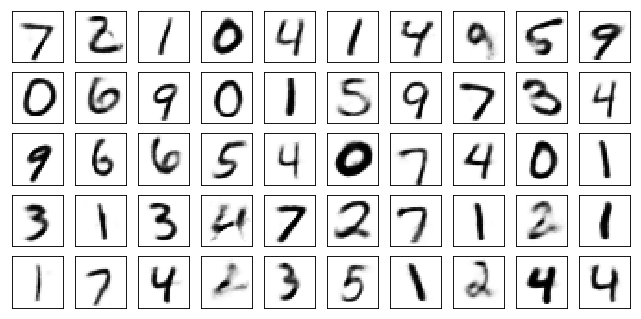

Test losses. E: 0.6902, AE: 0.0582, D: 0.6921
Train Epoch: 49 [0/50000 (0%)]	Losses E: 0.6945, AE: 0.0551, D: 0.6934
Train Epoch: 49 [5000/50000 (10%)]	Losses E: 0.7054, AE: 0.0535, D: 0.6907
Train Epoch: 49 [10000/50000 (20%)]	Losses E: 0.6874, AE: 0.0543, D: 0.6934
Train Epoch: 49 [15000/50000 (30%)]	Losses E: 0.6951, AE: 0.0505, D: 0.6910
Train Epoch: 49 [20000/50000 (40%)]	Losses E: 0.6913, AE: 0.0599, D: 0.6905
Train Epoch: 49 [25000/50000 (50%)]	Losses E: 0.6930, AE: 0.0628, D: 0.6995
Train Epoch: 49 [30000/50000 (60%)]	Losses E: 0.7026, AE: 0.0529, D: 0.6864
Train Epoch: 49 [35000/50000 (70%)]	Losses E: 0.6877, AE: 0.0604, D: 0.6958
Train Epoch: 49 [40000/50000 (80%)]	Losses E: 0.6929, AE: 0.0527, D: 0.6927
Train Epoch: 49 [45000/50000 (90%)]	Losses E: 0.6922, AE: 0.0594, D: 0.6947
Train Epoch: 49 [50000/50000 (100%)]	Losses E: 0.7066, AE: 0.0570, D: 0.6856


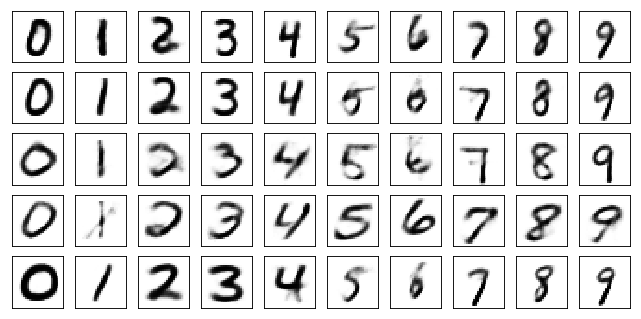

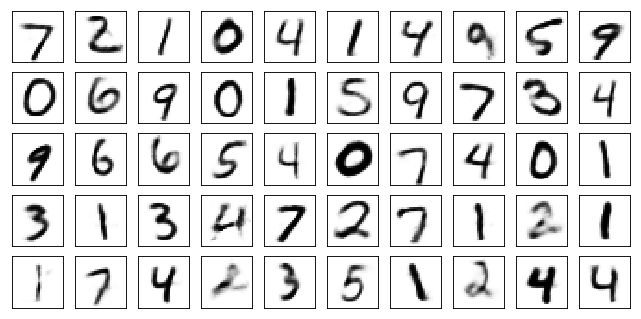

Test losses. E: 0.6941, AE: 0.0573, D: 0.6918
Train Epoch: 50 [0/50000 (0%)]	Losses E: 0.6962, AE: 0.0437, D: 0.6912
Train Epoch: 50 [5000/50000 (10%)]	Losses E: 0.6998, AE: 0.0620, D: 0.6894
Train Epoch: 50 [10000/50000 (20%)]	Losses E: 0.6995, AE: 0.0519, D: 0.6927
Train Epoch: 50 [15000/50000 (30%)]	Losses E: 0.6950, AE: 0.0518, D: 0.6906
Train Epoch: 50 [20000/50000 (40%)]	Losses E: 0.6762, AE: 0.0649, D: 0.6900
Train Epoch: 50 [25000/50000 (50%)]	Losses E: 0.7106, AE: 0.0567, D: 0.6846
Train Epoch: 50 [30000/50000 (60%)]	Losses E: 0.6943, AE: 0.0498, D: 0.6948
Train Epoch: 50 [35000/50000 (70%)]	Losses E: 0.6895, AE: 0.0553, D: 0.6943
Train Epoch: 50 [40000/50000 (80%)]	Losses E: 0.7013, AE: 0.0530, D: 0.6876
Train Epoch: 50 [45000/50000 (90%)]	Losses E: 0.6965, AE: 0.0499, D: 0.6901
Train Epoch: 50 [50000/50000 (100%)]	Losses E: 0.7089, AE: 0.0554, D: 0.6870


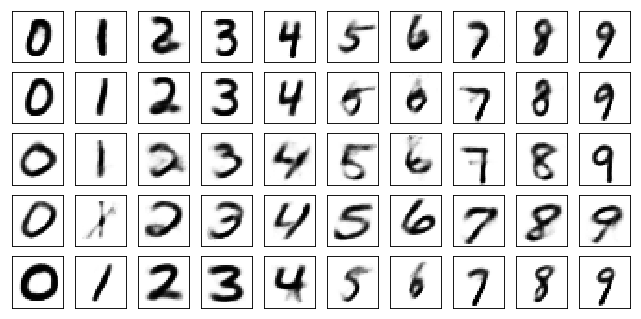

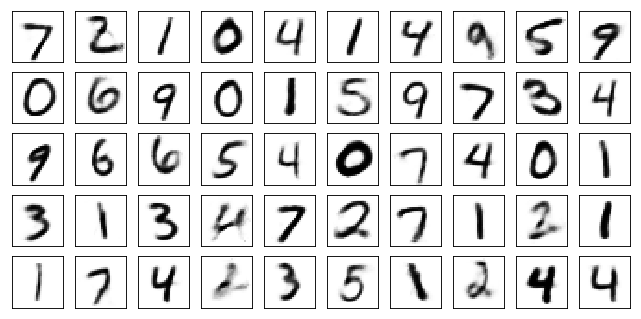

Test losses. E: 0.7047, AE: 0.0588, D: 0.6912


In [13]:
# В процессе обучения происходит перенос стиля в строках (на первом графике)
for epoch in range(1, train_epoch+1):
    Enc.train()
    Dec.train()
    Disc.train()
    train(epoch, Enc, Dec, Disc, train_log)
    Enc.eval()
    Dec.eval()
    Disc.eval()
    test(Enc, Dec, Disc, valid_loader, epoch, test_log)

In [14]:
torch.save(Enc.state_dict(), 'checkpointEnc+.pt')
torch.save(Dec.state_dict(), 'checkpointDec+.pt')

In [ ]:
## Нечестный CAAE

In [35]:
Enc1 = FullyConnected([28*28, 500, 501, prior_size], activation_fn=nn.LeakyReLU(0.2), flatten=True, device=device)
Dec1 = FullyConnected([prior_size+10, 500, 501, 28*28], activation_fn=nn.LeakyReLU(0.2), last_fn=nn.Tanh(), device=device)
Disc1 = FullyConnected([prior_size, 500, 501, 1], dropout=0.3, activation_fn=nn.LeakyReLU(0.2), device=device)

Enc_optimizer = optim.Adam(Enc1.parameters(), lr=lr)
Dec_optimizer = optim.Adam(Dec1.parameters(), lr=lr)
Disc_optimizer = optim.Adam(Disc1.parameters(), lr=lr)

In [14]:
train_log1 = {'E': [],'AE': [], 'D': []}
test_log1 = {'E': [],'AE': [], 'D': []}

In [12]:
def train_1(epoch, Enc, Dec, Disc, log=None):
    train_size = len(train_loader.sampler)
    for batch_idx, (data, label) in enumerate(train_loader):
        label = to_onehot(label, 10, device)
        # train D
        Enc.zero_grad()
        Disc.zero_grad()
        
        z = torch.randn((batch_size, prior_size)).to(device)
       # z_label = to_onehot(np.random.randint(0, 10, (batch_size)), 10, device)

        fake_pred = Disc(Enc(data))
        true_pred = Disc(z)

        
        fake_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_zeros)
        true_loss = F.binary_cross_entropy_with_logits(true_pred, batch_ones)
        
        Disc_loss = 0.5*(fake_loss + true_loss)
        
        Disc_loss.backward()
        Disc_optimizer.step()
        
        # train AE
        Enc.zero_grad()
        Dec.zero_grad()
        Disc.zero_grad()
        
        #z = torch.randn((batch_size, prior_size))
        #z_label = to_onehot(np.random.randint(0, 10, (batch_size)), 10)
        
        latent = Enc(data)
        reconstructed = Dec(latent, label).view(-1, 1, 28, 28)
        fake_pred = Disc(latent)
        
        Enc_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_ones)
        AE_loss = F.mse_loss(reconstructed, data)
        G_loss = AE_loss + Enc_loss
        
        G_loss.backward()
        Dec_optimizer.step()
        Enc_optimizer.step()
            
        if batch_idx % 100 == 0:
            line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
                epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
            losses = 'E: {:.4f}, AE: {:.4f}, D: {:.4f}'.format(Enc_loss.item(), AE_loss.item(), Disc_loss.item())
            print(line + losses)
            
    else:
        batch_idx += 1
        line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
            epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
        losses = 'E: {:.4f}, AE: {:.4f}, D: {:.4f}'.format(Enc_loss.item(), AE_loss.item(), Disc_loss.item())
        print(line + losses)
        log['E'].append(Enc_loss.item())
        log['AE'].append(AE_loss.item())
        log['D'].append(Disc_loss.item())

In [13]:
def test_1(Enc, Dec, Disc, loader, epoch, log=None):
    test_size = len(loader)
    E_loss = 0.
    AE_loss = 0.
    D_loss = 0.
    test_loss = {'E': 0., 'AE': 0., 'D': 0.}
    with torch.no_grad():
        for data, label in loader:
            label = to_onehot(label, 10, device)
            z = torch.randn((batch_size, prior_size)).to(device)
           # z_label = to_onehot(np.random.randint(0, 10, (batch_size)), 10, device)
            latent = Enc(data)
            reconstructed = Dec(latent, label).view(-1, 1, 28, 28)
            fake_pred = Disc(latent)
            true_pred = Disc(z)
        
            fake_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_zeros).item()
            true_loss = F.binary_cross_entropy_with_logits(true_pred, batch_ones).item()
            
            D_loss += 0.5*(fake_loss + true_loss)
            E_loss += F.binary_cross_entropy_with_logits(fake_pred, batch_ones).item()
            AE_loss += F.mse_loss(reconstructed, data)
            
        E_loss /= test_size
        D_loss /= test_size
        AE_loss /= test_size

        
        fixed_gen = Dec(fixed_z, fixed_z_label).cpu().data.numpy().reshape(batch_size, 1, 28, 28)
        plot_mnist(fixed_gen, (10, 10), True, fixed_folder + '%03d.png' % epoch)
        fixed_reconstruction = Dec(Enc(fixed_data), fixed_label).cpu().data.numpy().reshape(batch_size, 1, 28, 28)
        plot_mnist(fixed_reconstruction, (10, 10), True, recon_folder + '%03d.png' % epoch)
        
    report = 'Test losses. E: {:.4f}, AE: {:.4f}, D: {:.4f}'.format(E_loss, AE_loss, D_loss)
    print(report)

Train Epoch: 1 [0/50000 (0%)]	Losses E: 0.6842, AE: 0.9270, D: 0.6773
Train Epoch: 1 [5000/50000 (10%)]	Losses E: 0.2282, AE: 0.2761, D: 2.5592
Train Epoch: 1 [10000/50000 (20%)]	Losses E: 2.7214, AE: 0.2978, D: 1.1041
Train Epoch: 1 [15000/50000 (30%)]	Losses E: 0.7729, AE: 0.2613, D: 0.9474
Train Epoch: 1 [20000/50000 (40%)]	Losses E: 0.6593, AE: 0.2474, D: 0.8647
Train Epoch: 1 [25000/50000 (50%)]	Losses E: 0.8904, AE: 0.2673, D: 0.7213
Train Epoch: 1 [30000/50000 (60%)]	Losses E: 0.7380, AE: 0.2531, D: 0.7824
Train Epoch: 1 [35000/50000 (70%)]	Losses E: 0.6361, AE: 0.2503, D: 0.7652
Train Epoch: 1 [40000/50000 (80%)]	Losses E: 0.7040, AE: 0.2368, D: 0.7230
Train Epoch: 1 [45000/50000 (90%)]	Losses E: 0.6517, AE: 0.2553, D: 0.7674
Train Epoch: 1 [50000/50000 (100%)]	Losses E: 0.6208, AE: 0.2289, D: 0.7370


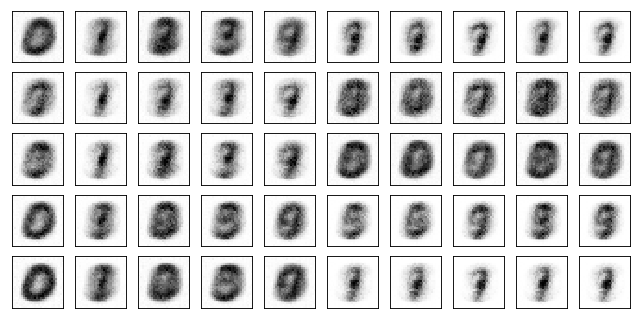

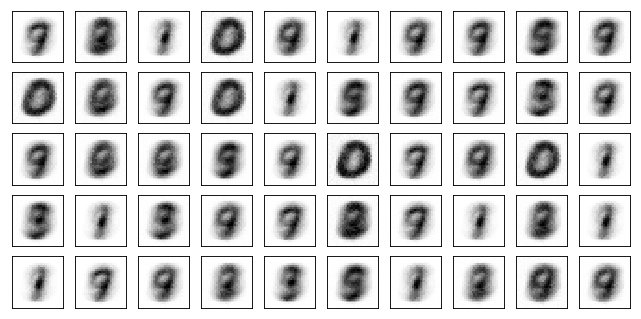

Test losses. E: 0.6189, AE: 0.2312, D: 0.7294
Train Epoch: 2 [0/50000 (0%)]	Losses E: 0.6355, AE: 0.2259, D: 0.7469
Train Epoch: 2 [5000/50000 (10%)]	Losses E: 0.6007, AE: 0.2135, D: 0.7475
Train Epoch: 2 [10000/50000 (20%)]	Losses E: 0.6539, AE: 0.2118, D: 0.7839
Train Epoch: 2 [15000/50000 (30%)]	Losses E: 0.6362, AE: 0.2194, D: 0.7607
Train Epoch: 2 [20000/50000 (40%)]	Losses E: 0.5937, AE: 0.2079, D: 0.7327
Train Epoch: 2 [25000/50000 (50%)]	Losses E: 0.6288, AE: 0.2194, D: 0.7026
Train Epoch: 2 [30000/50000 (60%)]	Losses E: 0.9573, AE: 0.2168, D: 0.6756
Train Epoch: 2 [35000/50000 (70%)]	Losses E: 0.6582, AE: 0.2057, D: 0.7228
Train Epoch: 2 [40000/50000 (80%)]	Losses E: 0.6002, AE: 0.2024, D: 0.7214
Train Epoch: 2 [45000/50000 (90%)]	Losses E: 0.7131, AE: 0.1964, D: 0.6967
Train Epoch: 2 [50000/50000 (100%)]	Losses E: 0.7082, AE: 0.1981, D: 0.7060


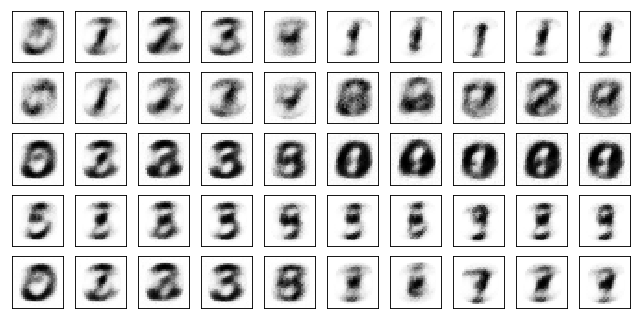

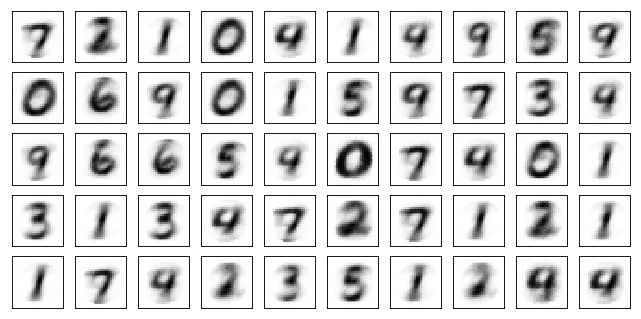

Test losses. E: 0.6984, AE: 0.1938, D: 0.7061
Train Epoch: 3 [0/50000 (0%)]	Losses E: 0.7045, AE: 0.1858, D: 0.7054
Train Epoch: 3 [5000/50000 (10%)]	Losses E: 0.6194, AE: 0.1864, D: 0.7077
Train Epoch: 3 [10000/50000 (20%)]	Losses E: 0.5980, AE: 0.1924, D: 0.7229
Train Epoch: 3 [15000/50000 (30%)]	Losses E: 0.6743, AE: 0.1967, D: 0.7072
Train Epoch: 3 [20000/50000 (40%)]	Losses E: 0.7111, AE: 0.1828, D: 0.7289
Train Epoch: 3 [25000/50000 (50%)]	Losses E: 0.6444, AE: 0.1832, D: 0.7069
Train Epoch: 3 [30000/50000 (60%)]	Losses E: 0.6772, AE: 0.1847, D: 0.6685
Train Epoch: 3 [35000/50000 (70%)]	Losses E: 0.7864, AE: 0.1844, D: 0.7382
Train Epoch: 3 [40000/50000 (80%)]	Losses E: 0.6841, AE: 0.1691, D: 0.7110
Train Epoch: 3 [45000/50000 (90%)]	Losses E: 0.6002, AE: 0.1784, D: 0.7139
Train Epoch: 3 [50000/50000 (100%)]	Losses E: 0.5570, AE: 0.1756, D: 0.7910


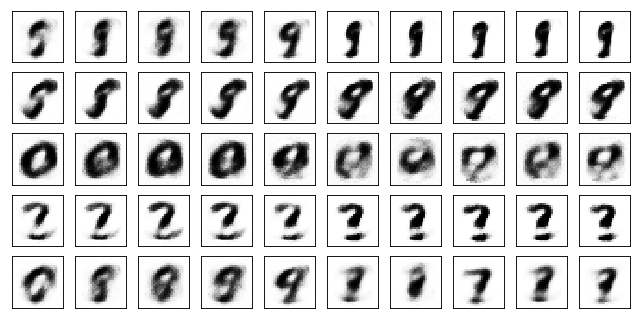

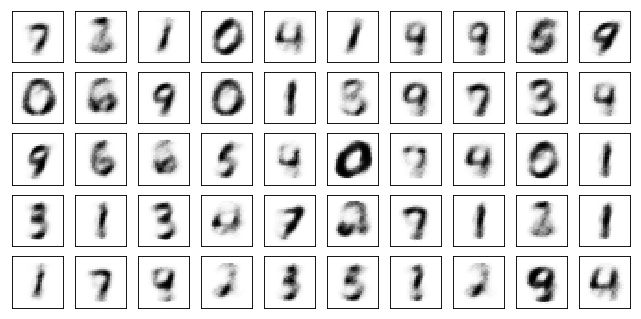

Test losses. E: 0.5199, AE: 0.1705, D: 0.7858
Train Epoch: 4 [0/50000 (0%)]	Losses E: 0.5357, AE: 0.1683, D: 0.8051
Train Epoch: 4 [5000/50000 (10%)]	Losses E: 0.6858, AE: 0.1580, D: 0.7267
Train Epoch: 4 [10000/50000 (20%)]	Losses E: 0.6749, AE: 0.1647, D: 0.7012
Train Epoch: 4 [15000/50000 (30%)]	Losses E: 0.7247, AE: 0.1536, D: 0.6678
Train Epoch: 4 [20000/50000 (40%)]	Losses E: 0.7997, AE: 0.1596, D: 0.6747
Train Epoch: 4 [25000/50000 (50%)]	Losses E: 0.7038, AE: 0.1666, D: 0.7120
Train Epoch: 4 [30000/50000 (60%)]	Losses E: 0.6677, AE: 0.1560, D: 0.6954
Train Epoch: 4 [35000/50000 (70%)]	Losses E: 0.7256, AE: 0.1611, D: 0.6701
Train Epoch: 4 [40000/50000 (80%)]	Losses E: 0.6991, AE: 0.1560, D: 0.7219
Train Epoch: 4 [45000/50000 (90%)]	Losses E: 0.6779, AE: 0.1366, D: 0.7025
Train Epoch: 4 [50000/50000 (100%)]	Losses E: 0.6736, AE: 0.1458, D: 0.6981


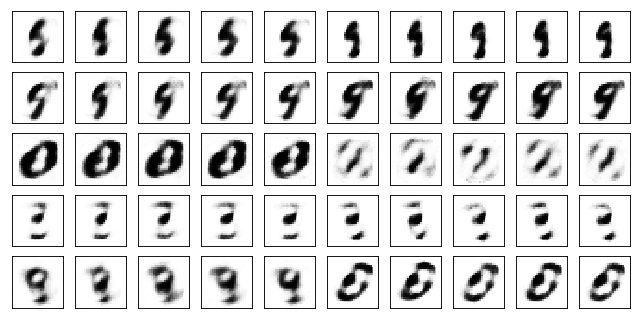

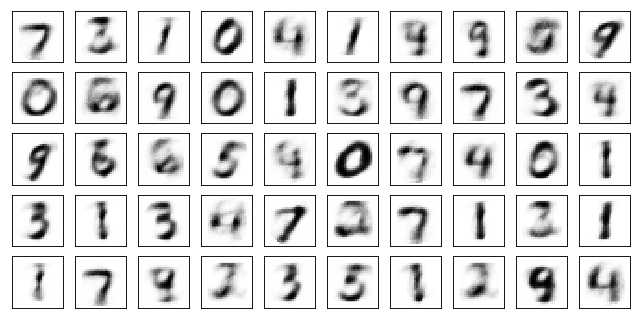

Test losses. E: 0.6724, AE: 0.1458, D: 0.6942
Train Epoch: 5 [0/50000 (0%)]	Losses E: 0.6692, AE: 0.1448, D: 0.6985
Train Epoch: 5 [5000/50000 (10%)]	Losses E: 0.6625, AE: 0.1584, D: 0.7403
Train Epoch: 5 [10000/50000 (20%)]	Losses E: 0.6881, AE: 0.1519, D: 0.7036
Train Epoch: 5 [15000/50000 (30%)]	Losses E: 0.6514, AE: 0.1424, D: 0.7005
Train Epoch: 5 [20000/50000 (40%)]	Losses E: 0.8021, AE: 0.1600, D: 0.6912
Train Epoch: 5 [25000/50000 (50%)]	Losses E: 0.7027, AE: 0.1492, D: 0.7100
Train Epoch: 5 [30000/50000 (60%)]	Losses E: 0.6825, AE: 0.1491, D: 0.6883
Train Epoch: 5 [35000/50000 (70%)]	Losses E: 0.6335, AE: 0.1564, D: 0.7000
Train Epoch: 5 [40000/50000 (80%)]	Losses E: 0.7032, AE: 0.1411, D: 0.7247
Train Epoch: 5 [45000/50000 (90%)]	Losses E: 0.6781, AE: 0.1379, D: 0.7016
Train Epoch: 5 [50000/50000 (100%)]	Losses E: 0.6534, AE: 0.1257, D: 0.6928


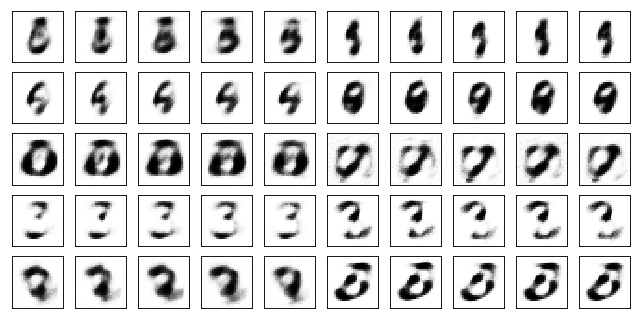

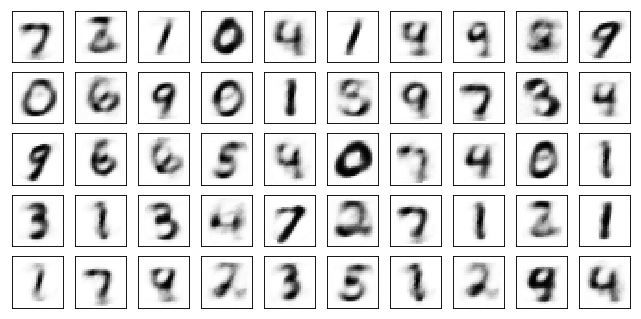

Test losses. E: 0.6502, AE: 0.1330, D: 0.6985
Train Epoch: 6 [0/50000 (0%)]	Losses E: 0.6497, AE: 0.1407, D: 0.7022
Train Epoch: 6 [5000/50000 (10%)]	Losses E: 0.6622, AE: 0.1218, D: 0.7271
Train Epoch: 6 [10000/50000 (20%)]	Losses E: 0.7034, AE: 0.1279, D: 0.6949
Train Epoch: 6 [15000/50000 (30%)]	Losses E: 0.6767, AE: 0.1204, D: 0.6892
Train Epoch: 6 [20000/50000 (40%)]	Losses E: 0.6747, AE: 0.1219, D: 0.7072
Train Epoch: 6 [25000/50000 (50%)]	Losses E: 0.6694, AE: 0.1093, D: 0.7006
Train Epoch: 6 [30000/50000 (60%)]	Losses E: 0.6697, AE: 0.1386, D: 0.6965
Train Epoch: 6 [35000/50000 (70%)]	Losses E: 0.7170, AE: 0.1273, D: 0.6865
Train Epoch: 6 [40000/50000 (80%)]	Losses E: 0.7346, AE: 0.1253, D: 0.6957
Train Epoch: 6 [45000/50000 (90%)]	Losses E: 0.6751, AE: 0.0985, D: 0.6954
Train Epoch: 6 [50000/50000 (100%)]	Losses E: 0.7527, AE: 0.1277, D: 0.6874


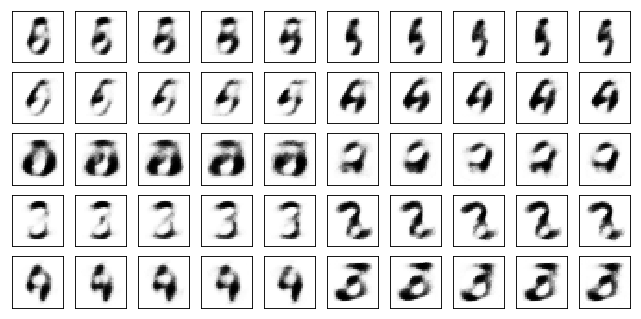

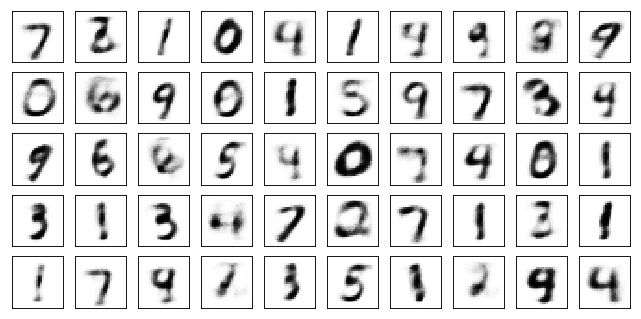

Test losses. E: 0.7402, AE: 0.1211, D: 0.6836
Train Epoch: 7 [0/50000 (0%)]	Losses E: 0.7529, AE: 0.1237, D: 0.6866
Train Epoch: 7 [5000/50000 (10%)]	Losses E: 0.7211, AE: 0.1182, D: 0.6985
Train Epoch: 7 [10000/50000 (20%)]	Losses E: 0.6492, AE: 0.1087, D: 0.7014
Train Epoch: 7 [15000/50000 (30%)]	Losses E: 0.6987, AE: 0.1187, D: 0.6978
Train Epoch: 7 [20000/50000 (40%)]	Losses E: 0.7062, AE: 0.1051, D: 0.6892
Train Epoch: 7 [25000/50000 (50%)]	Losses E: 0.6639, AE: 0.1189, D: 0.7117
Train Epoch: 7 [30000/50000 (60%)]	Losses E: 0.6970, AE: 0.1083, D: 0.7002
Train Epoch: 7 [35000/50000 (70%)]	Losses E: 0.6599, AE: 0.1131, D: 0.6957
Train Epoch: 7 [40000/50000 (80%)]	Losses E: 0.7092, AE: 0.0943, D: 0.6897
Train Epoch: 7 [45000/50000 (90%)]	Losses E: 0.7265, AE: 0.1089, D: 0.6864
Train Epoch: 7 [50000/50000 (100%)]	Losses E: 0.7127, AE: 0.1091, D: 0.7035


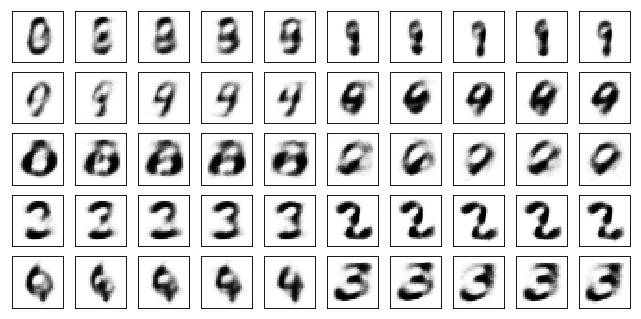

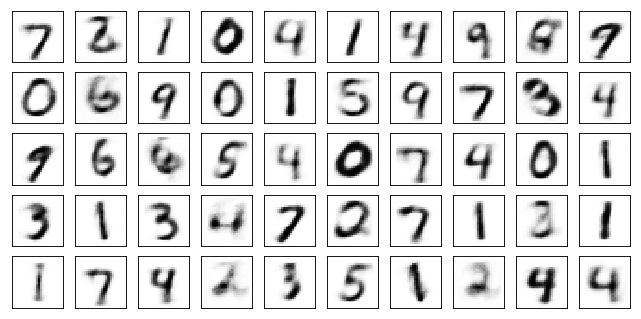

Test losses. E: 0.7097, AE: 0.1064, D: 0.7066
Train Epoch: 8 [0/50000 (0%)]	Losses E: 0.7116, AE: 0.1107, D: 0.7077
Train Epoch: 8 [5000/50000 (10%)]	Losses E: 0.6611, AE: 0.1093, D: 0.6933
Train Epoch: 8 [10000/50000 (20%)]	Losses E: 0.6996, AE: 0.0944, D: 0.6971
Train Epoch: 8 [15000/50000 (30%)]	Losses E: 0.7285, AE: 0.0940, D: 0.6941
Train Epoch: 8 [20000/50000 (40%)]	Losses E: 0.6807, AE: 0.1139, D: 0.6888
Train Epoch: 8 [25000/50000 (50%)]	Losses E: 0.7010, AE: 0.1039, D: 0.6997
Train Epoch: 8 [30000/50000 (60%)]	Losses E: 0.6820, AE: 0.1012, D: 0.6950
Train Epoch: 8 [35000/50000 (70%)]	Losses E: 0.6686, AE: 0.1014, D: 0.7044
Train Epoch: 8 [40000/50000 (80%)]	Losses E: 0.6898, AE: 0.0918, D: 0.6934
Train Epoch: 8 [45000/50000 (90%)]	Losses E: 0.6840, AE: 0.1055, D: 0.6995
Train Epoch: 8 [50000/50000 (100%)]	Losses E: 0.6715, AE: 0.0905, D: 0.6949


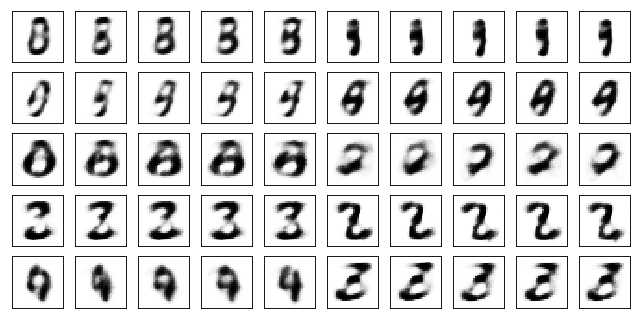

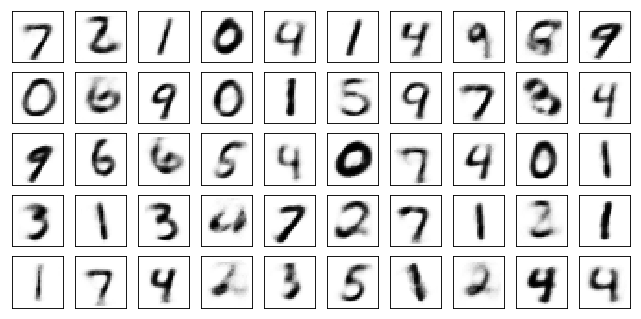

Test losses. E: 0.6717, AE: 0.0916, D: 0.6942
Train Epoch: 9 [0/50000 (0%)]	Losses E: 0.6740, AE: 0.0943, D: 0.6931
Train Epoch: 9 [5000/50000 (10%)]	Losses E: 0.6966, AE: 0.0868, D: 0.6939
Train Epoch: 9 [10000/50000 (20%)]	Losses E: 0.6851, AE: 0.0895, D: 0.6944
Train Epoch: 9 [15000/50000 (30%)]	Losses E: 0.7124, AE: 0.0843, D: 0.6836
Train Epoch: 9 [20000/50000 (40%)]	Losses E: 0.7057, AE: 0.0858, D: 0.6993
Train Epoch: 9 [25000/50000 (50%)]	Losses E: 0.6868, AE: 0.0894, D: 0.6951
Train Epoch: 9 [30000/50000 (60%)]	Losses E: 0.6849, AE: 0.0883, D: 0.6963
Train Epoch: 9 [35000/50000 (70%)]	Losses E: 0.6993, AE: 0.0888, D: 0.6912
Train Epoch: 9 [40000/50000 (80%)]	Losses E: 0.7077, AE: 0.0840, D: 0.6935
Train Epoch: 9 [45000/50000 (90%)]	Losses E: 0.6814, AE: 0.0866, D: 0.6978
Train Epoch: 9 [50000/50000 (100%)]	Losses E: 0.7217, AE: 0.0831, D: 0.6881


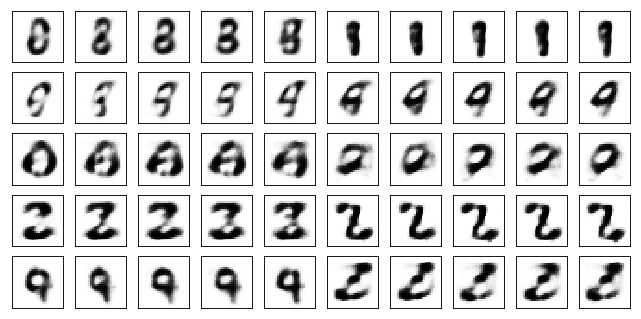

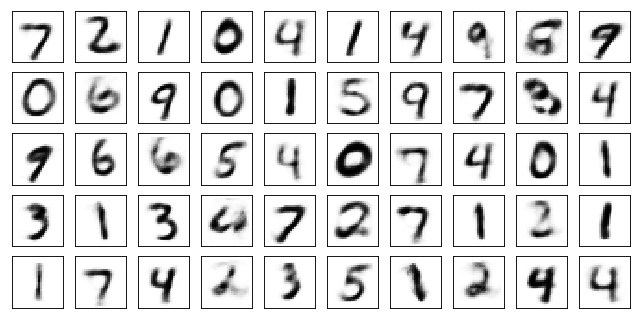

Test losses. E: 0.7151, AE: 0.0877, D: 0.6902
Train Epoch: 10 [0/50000 (0%)]	Losses E: 0.7166, AE: 0.0777, D: 0.6896
Train Epoch: 10 [5000/50000 (10%)]	Losses E: 0.6927, AE: 0.0925, D: 0.6911
Train Epoch: 10 [10000/50000 (20%)]	Losses E: 0.6977, AE: 0.0897, D: 0.6913
Train Epoch: 10 [15000/50000 (30%)]	Losses E: 0.6825, AE: 0.0940, D: 0.6980
Train Epoch: 10 [20000/50000 (40%)]	Losses E: 0.6837, AE: 0.0776, D: 0.6930
Train Epoch: 10 [25000/50000 (50%)]	Losses E: 0.6888, AE: 0.0770, D: 0.6961
Train Epoch: 10 [30000/50000 (60%)]	Losses E: 0.6939, AE: 0.0808, D: 0.6948
Train Epoch: 10 [35000/50000 (70%)]	Losses E: 0.7009, AE: 0.0827, D: 0.6936
Train Epoch: 10 [40000/50000 (80%)]	Losses E: 0.6846, AE: 0.0785, D: 0.6926
Train Epoch: 10 [45000/50000 (90%)]	Losses E: 0.6906, AE: 0.0830, D: 0.6930
Train Epoch: 10 [50000/50000 (100%)]	Losses E: 0.6734, AE: 0.0827, D: 0.6993


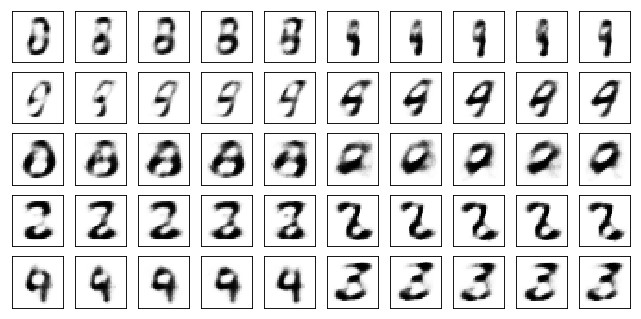

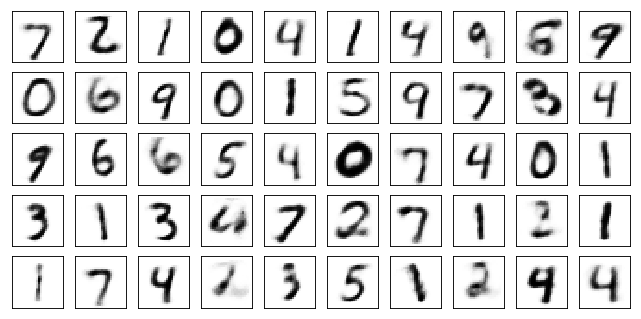

Test losses. E: 0.6765, AE: 0.0814, D: 0.6960
Train Epoch: 11 [0/50000 (0%)]	Losses E: 0.6787, AE: 0.0812, D: 0.6940
Train Epoch: 11 [5000/50000 (10%)]	Losses E: 0.6989, AE: 0.0817, D: 0.6958
Train Epoch: 11 [10000/50000 (20%)]	Losses E: 0.6768, AE: 0.0838, D: 0.6987
Train Epoch: 11 [15000/50000 (30%)]	Losses E: 0.6833, AE: 0.0866, D: 0.6896
Train Epoch: 11 [20000/50000 (40%)]	Losses E: 0.6949, AE: 0.0788, D: 0.6896
Train Epoch: 11 [25000/50000 (50%)]	Losses E: 0.6808, AE: 0.0743, D: 0.6943
Train Epoch: 11 [30000/50000 (60%)]	Losses E: 0.6994, AE: 0.0819, D: 0.6972
Train Epoch: 11 [35000/50000 (70%)]	Losses E: 0.6916, AE: 0.0805, D: 0.6934
Train Epoch: 11 [40000/50000 (80%)]	Losses E: 0.7004, AE: 0.0823, D: 0.6970
Train Epoch: 11 [45000/50000 (90%)]	Losses E: 0.6813, AE: 0.0732, D: 0.6965
Train Epoch: 11 [50000/50000 (100%)]	Losses E: 0.7005, AE: 0.0802, D: 0.6925


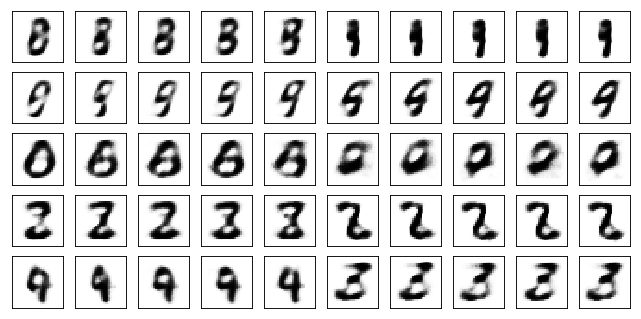

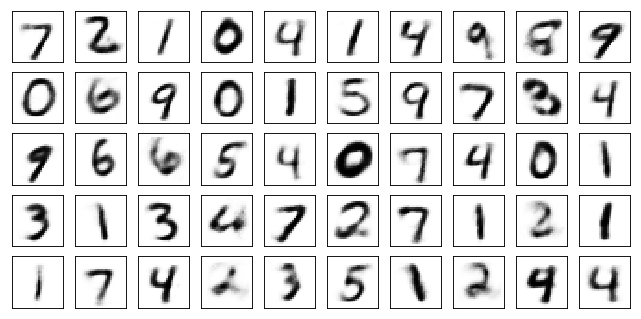

Test losses. E: 0.6983, AE: 0.0784, D: 0.6930
Train Epoch: 12 [0/50000 (0%)]	Losses E: 0.6993, AE: 0.0834, D: 0.6929
Train Epoch: 12 [5000/50000 (10%)]	Losses E: 0.6999, AE: 0.0698, D: 0.6948
Train Epoch: 12 [10000/50000 (20%)]	Losses E: 0.6902, AE: 0.0706, D: 0.6928
Train Epoch: 12 [15000/50000 (30%)]	Losses E: 0.6969, AE: 0.0820, D: 0.6933
Train Epoch: 12 [20000/50000 (40%)]	Losses E: 0.6883, AE: 0.0715, D: 0.6960
Train Epoch: 12 [25000/50000 (50%)]	Losses E: 0.7005, AE: 0.0735, D: 0.6907
Train Epoch: 12 [30000/50000 (60%)]	Losses E: 0.6950, AE: 0.0781, D: 0.6920
Train Epoch: 12 [35000/50000 (70%)]	Losses E: 0.6821, AE: 0.0694, D: 0.6958
Train Epoch: 12 [40000/50000 (80%)]	Losses E: 0.6942, AE: 0.0757, D: 0.6926
Train Epoch: 12 [45000/50000 (90%)]	Losses E: 0.6942, AE: 0.0714, D: 0.6925
Train Epoch: 12 [50000/50000 (100%)]	Losses E: 0.6933, AE: 0.0773, D: 0.6930


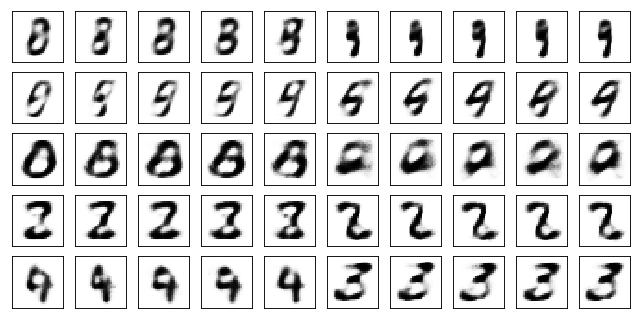

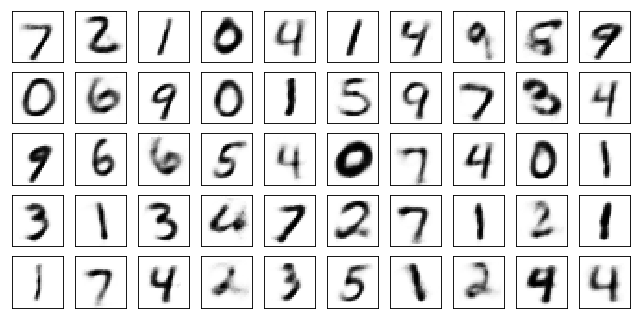

Test losses. E: 0.6925, AE: 0.0739, D: 0.6936
Train Epoch: 13 [0/50000 (0%)]	Losses E: 0.6922, AE: 0.0775, D: 0.6949
Train Epoch: 13 [5000/50000 (10%)]	Losses E: 0.6994, AE: 0.0642, D: 0.6946
Train Epoch: 13 [10000/50000 (20%)]	Losses E: 0.6943, AE: 0.0852, D: 0.6942
Train Epoch: 13 [15000/50000 (30%)]	Losses E: 0.6971, AE: 0.0679, D: 0.6941
Train Epoch: 13 [20000/50000 (40%)]	Losses E: 0.7019, AE: 0.0705, D: 0.6920
Train Epoch: 13 [25000/50000 (50%)]	Losses E: 0.6853, AE: 0.0712, D: 0.6936
Train Epoch: 13 [30000/50000 (60%)]	Losses E: 0.6950, AE: 0.0624, D: 0.6936
Train Epoch: 13 [35000/50000 (70%)]	Losses E: 0.6932, AE: 0.0683, D: 0.6924
Train Epoch: 13 [40000/50000 (80%)]	Losses E: 0.6835, AE: 0.0738, D: 0.6925
Train Epoch: 13 [45000/50000 (90%)]	Losses E: 0.6975, AE: 0.0728, D: 0.6942
Train Epoch: 13 [50000/50000 (100%)]	Losses E: 0.7049, AE: 0.0825, D: 0.6940


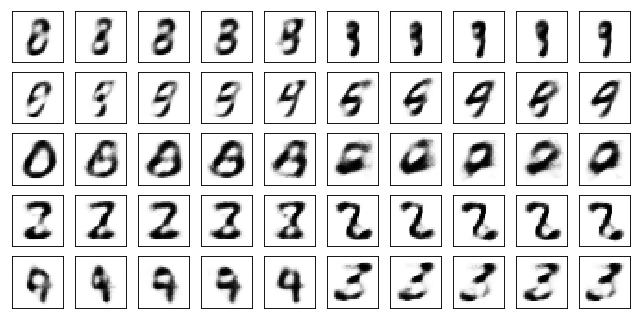

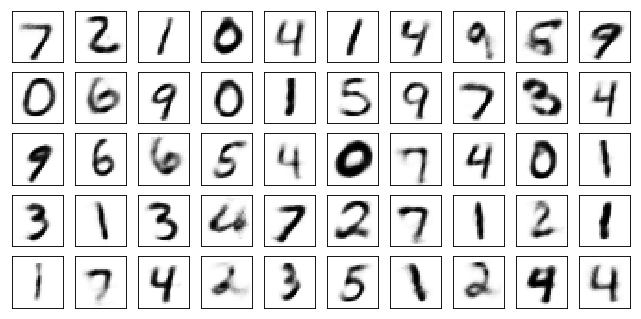

Test losses. E: 0.7037, AE: 0.0716, D: 0.6935
Train Epoch: 14 [0/50000 (0%)]	Losses E: 0.7041, AE: 0.0800, D: 0.6933
Train Epoch: 14 [5000/50000 (10%)]	Losses E: 0.6977, AE: 0.0672, D: 0.6927
Train Epoch: 14 [10000/50000 (20%)]	Losses E: 0.6925, AE: 0.0619, D: 0.6934
Train Epoch: 14 [15000/50000 (30%)]	Losses E: 0.6979, AE: 0.0571, D: 0.6887
Train Epoch: 14 [20000/50000 (40%)]	Losses E: 0.6887, AE: 0.0760, D: 0.6944
Train Epoch: 14 [25000/50000 (50%)]	Losses E: 0.7074, AE: 0.0678, D: 0.6925
Train Epoch: 14 [30000/50000 (60%)]	Losses E: 0.6819, AE: 0.0782, D: 0.6958
Train Epoch: 14 [35000/50000 (70%)]	Losses E: 0.6835, AE: 0.0757, D: 0.6931
Train Epoch: 14 [40000/50000 (80%)]	Losses E: 0.6937, AE: 0.0636, D: 0.6920
Train Epoch: 14 [45000/50000 (90%)]	Losses E: 0.7060, AE: 0.0655, D: 0.6938
Train Epoch: 14 [50000/50000 (100%)]	Losses E: 0.7001, AE: 0.0630, D: 0.6924


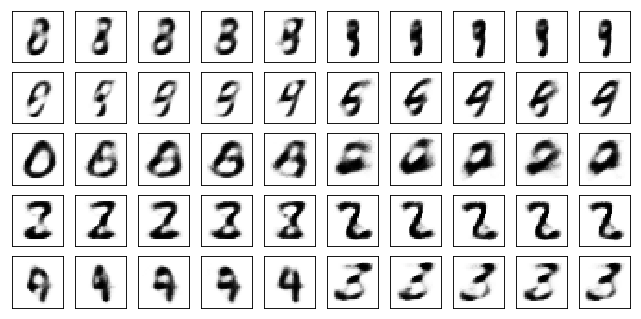

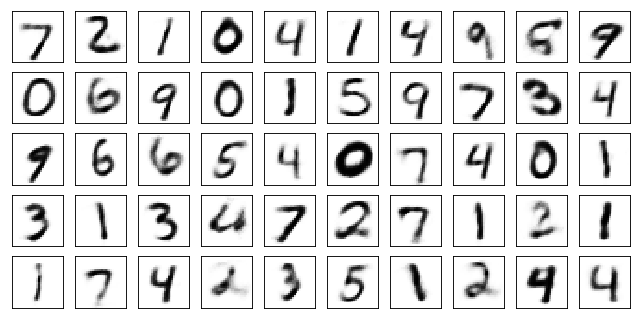

Test losses. E: 0.7003, AE: 0.0690, D: 0.6931
Train Epoch: 15 [0/50000 (0%)]	Losses E: 0.7033, AE: 0.0723, D: 0.6946
Train Epoch: 15 [5000/50000 (10%)]	Losses E: 0.6963, AE: 0.0598, D: 0.6925
Train Epoch: 15 [10000/50000 (20%)]	Losses E: 0.6940, AE: 0.0825, D: 0.6928
Train Epoch: 15 [15000/50000 (30%)]	Losses E: 0.6933, AE: 0.0711, D: 0.6936
Train Epoch: 15 [20000/50000 (40%)]	Losses E: 0.6946, AE: 0.0581, D: 0.6938
Train Epoch: 15 [25000/50000 (50%)]	Losses E: 0.7059, AE: 0.0690, D: 0.6934
Train Epoch: 15 [30000/50000 (60%)]	Losses E: 0.6975, AE: 0.0683, D: 0.6932
Train Epoch: 15 [35000/50000 (70%)]	Losses E: 0.6963, AE: 0.0634, D: 0.6919
Train Epoch: 15 [40000/50000 (80%)]	Losses E: 0.6932, AE: 0.0675, D: 0.6952
Train Epoch: 15 [45000/50000 (90%)]	Losses E: 0.6909, AE: 0.0767, D: 0.6938
Train Epoch: 15 [50000/50000 (100%)]	Losses E: 0.6932, AE: 0.0605, D: 0.6910


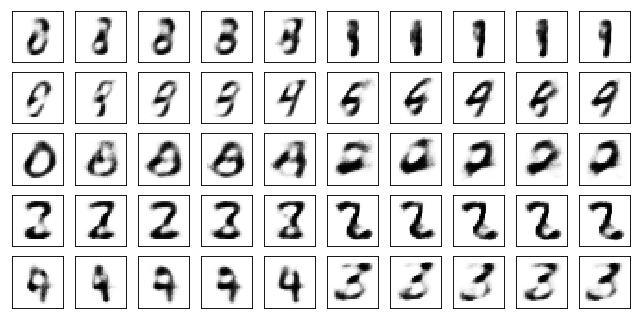

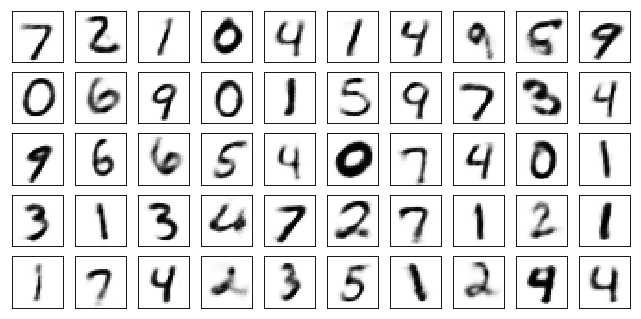

Test losses. E: 0.6912, AE: 0.0671, D: 0.6937
Train Epoch: 16 [0/50000 (0%)]	Losses E: 0.6907, AE: 0.0695, D: 0.6948
Train Epoch: 16 [5000/50000 (10%)]	Losses E: 0.6917, AE: 0.0695, D: 0.6929
Train Epoch: 16 [10000/50000 (20%)]	Losses E: 0.7039, AE: 0.0723, D: 0.6951
Train Epoch: 16 [15000/50000 (30%)]	Losses E: 0.6903, AE: 0.0648, D: 0.6955
Train Epoch: 16 [20000/50000 (40%)]	Losses E: 0.6895, AE: 0.0702, D: 0.6935
Train Epoch: 16 [25000/50000 (50%)]	Losses E: 0.6994, AE: 0.0610, D: 0.6934
Train Epoch: 16 [30000/50000 (60%)]	Losses E: 0.6919, AE: 0.0658, D: 0.6925
Train Epoch: 16 [35000/50000 (70%)]	Losses E: 0.6876, AE: 0.0550, D: 0.6933
Train Epoch: 16 [40000/50000 (80%)]	Losses E: 0.6868, AE: 0.0668, D: 0.6955
Train Epoch: 16 [45000/50000 (90%)]	Losses E: 0.6938, AE: 0.0588, D: 0.6920
Train Epoch: 16 [50000/50000 (100%)]	Losses E: 0.6883, AE: 0.0626, D: 0.6918


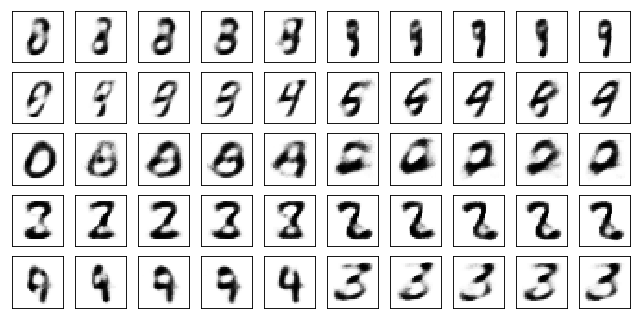

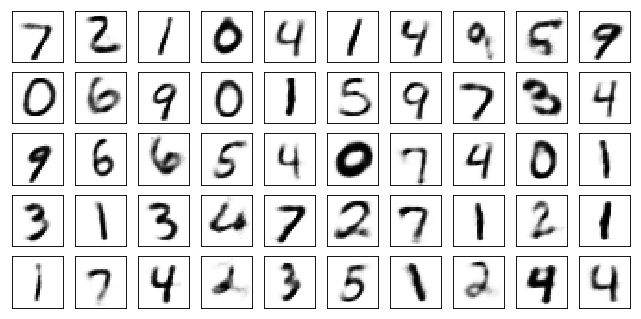

Test losses. E: 0.6900, AE: 0.0660, D: 0.6937
Train Epoch: 17 [0/50000 (0%)]	Losses E: 0.6947, AE: 0.0650, D: 0.6929
Train Epoch: 17 [5000/50000 (10%)]	Losses E: 0.6867, AE: 0.0654, D: 0.6944
Train Epoch: 17 [10000/50000 (20%)]	Losses E: 0.6902, AE: 0.0686, D: 0.6915
Train Epoch: 17 [15000/50000 (30%)]	Losses E: 0.7001, AE: 0.0639, D: 0.6926
Train Epoch: 17 [20000/50000 (40%)]	Losses E: 0.6940, AE: 0.0604, D: 0.6916
Train Epoch: 17 [25000/50000 (50%)]	Losses E: 0.6939, AE: 0.0640, D: 0.6979
Train Epoch: 17 [30000/50000 (60%)]	Losses E: 0.6955, AE: 0.0654, D: 0.6933
Train Epoch: 17 [35000/50000 (70%)]	Losses E: 0.6864, AE: 0.0552, D: 0.6926
Train Epoch: 17 [40000/50000 (80%)]	Losses E: 0.6927, AE: 0.0633, D: 0.6940
Train Epoch: 17 [45000/50000 (90%)]	Losses E: 0.6919, AE: 0.0656, D: 0.6928
Train Epoch: 17 [50000/50000 (100%)]	Losses E: 0.6966, AE: 0.0684, D: 0.6922


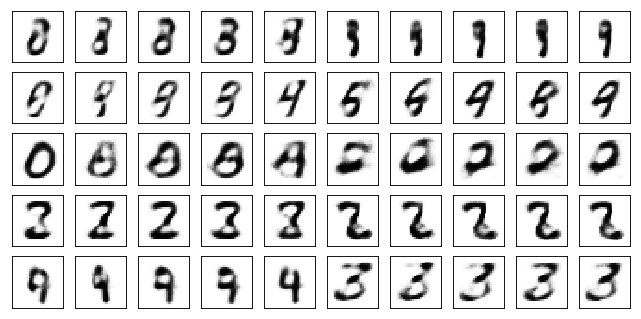

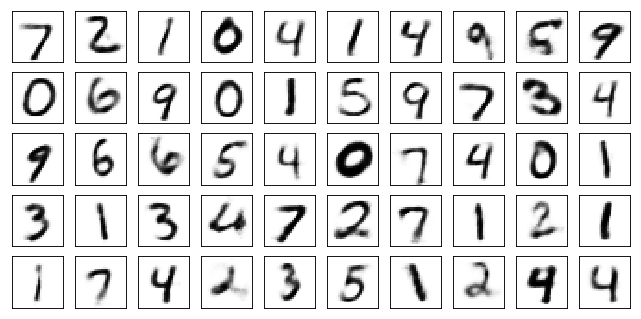

Test losses. E: 0.6938, AE: 0.0632, D: 0.6931
Train Epoch: 18 [0/50000 (0%)]	Losses E: 0.6937, AE: 0.0716, D: 0.6947
Train Epoch: 18 [5000/50000 (10%)]	Losses E: 0.6908, AE: 0.0679, D: 0.6939
Train Epoch: 18 [10000/50000 (20%)]	Losses E: 0.6954, AE: 0.0527, D: 0.6917
Train Epoch: 18 [15000/50000 (30%)]	Losses E: 0.6901, AE: 0.0615, D: 0.6920
Train Epoch: 18 [20000/50000 (40%)]	Losses E: 0.6896, AE: 0.0571, D: 0.6941
Train Epoch: 18 [25000/50000 (50%)]	Losses E: 0.6998, AE: 0.0642, D: 0.6908
Train Epoch: 18 [30000/50000 (60%)]	Losses E: 0.6953, AE: 0.0617, D: 0.6910
Train Epoch: 18 [35000/50000 (70%)]	Losses E: 0.6924, AE: 0.0620, D: 0.6935
Train Epoch: 18 [40000/50000 (80%)]	Losses E: 0.6974, AE: 0.0655, D: 0.6910
Train Epoch: 18 [45000/50000 (90%)]	Losses E: 0.6895, AE: 0.0622, D: 0.6945
Train Epoch: 18 [50000/50000 (100%)]	Losses E: 0.6926, AE: 0.0666, D: 0.6953


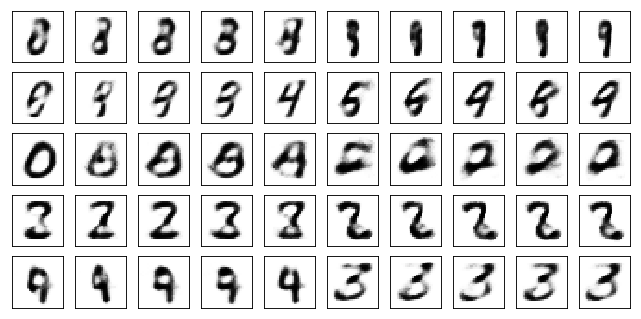

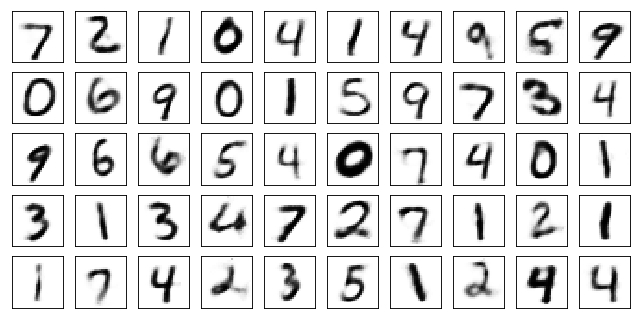

Test losses. E: 0.6905, AE: 0.0635, D: 0.6942
Train Epoch: 19 [0/50000 (0%)]	Losses E: 0.6918, AE: 0.0679, D: 0.6919
Train Epoch: 19 [5000/50000 (10%)]	Losses E: 0.7088, AE: 0.0564, D: 0.6926
Train Epoch: 19 [10000/50000 (20%)]	Losses E: 0.6988, AE: 0.0642, D: 0.6907
Train Epoch: 19 [15000/50000 (30%)]	Losses E: 0.6884, AE: 0.0640, D: 0.6967
Train Epoch: 19 [20000/50000 (40%)]	Losses E: 0.6865, AE: 0.0680, D: 0.6925
Train Epoch: 19 [25000/50000 (50%)]	Losses E: 0.6840, AE: 0.0626, D: 0.6907
Train Epoch: 19 [30000/50000 (60%)]	Losses E: 0.6862, AE: 0.0588, D: 0.6918
Train Epoch: 19 [35000/50000 (70%)]	Losses E: 0.6921, AE: 0.0644, D: 0.6941
Train Epoch: 19 [40000/50000 (80%)]	Losses E: 0.6913, AE: 0.0523, D: 0.6913
Train Epoch: 19 [45000/50000 (90%)]	Losses E: 0.6816, AE: 0.0636, D: 0.6906
Train Epoch: 19 [50000/50000 (100%)]	Losses E: 0.6912, AE: 0.0680, D: 0.6937


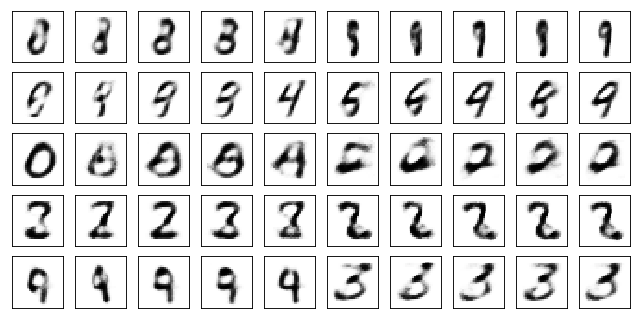

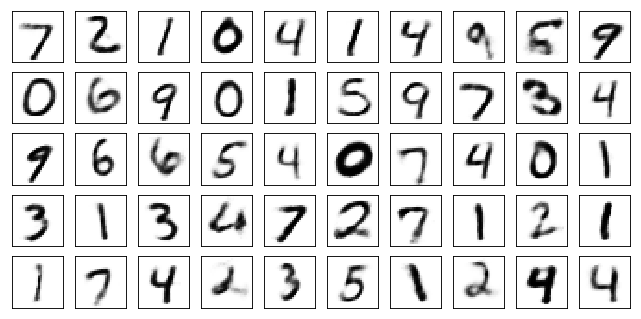

Test losses. E: 0.6874, AE: 0.0623, D: 0.6937
Train Epoch: 20 [0/50000 (0%)]	Losses E: 0.6878, AE: 0.0567, D: 0.6922
Train Epoch: 20 [5000/50000 (10%)]	Losses E: 0.6987, AE: 0.0598, D: 0.6923
Train Epoch: 20 [10000/50000 (20%)]	Losses E: 0.6913, AE: 0.0600, D: 0.6954
Train Epoch: 20 [15000/50000 (30%)]	Losses E: 0.6893, AE: 0.0620, D: 0.6928
Train Epoch: 20 [20000/50000 (40%)]	Losses E: 0.6913, AE: 0.0619, D: 0.6918
Train Epoch: 20 [25000/50000 (50%)]	Losses E: 0.6982, AE: 0.0534, D: 0.6930
Train Epoch: 20 [30000/50000 (60%)]	Losses E: 0.6856, AE: 0.0553, D: 0.6921
Train Epoch: 20 [35000/50000 (70%)]	Losses E: 0.6909, AE: 0.0618, D: 0.6922
Train Epoch: 20 [40000/50000 (80%)]	Losses E: 0.7035, AE: 0.0748, D: 0.6938
Train Epoch: 20 [45000/50000 (90%)]	Losses E: 0.6916, AE: 0.0651, D: 0.6930
Train Epoch: 20 [50000/50000 (100%)]	Losses E: 0.7027, AE: 0.0646, D: 0.6916


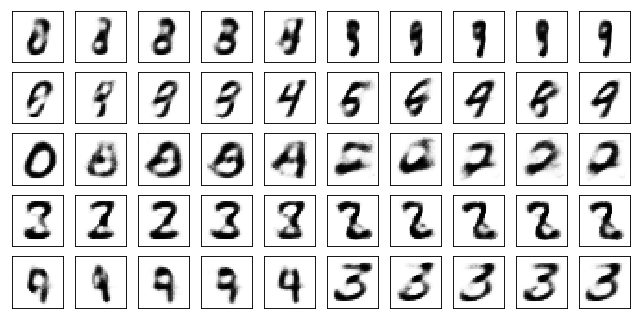

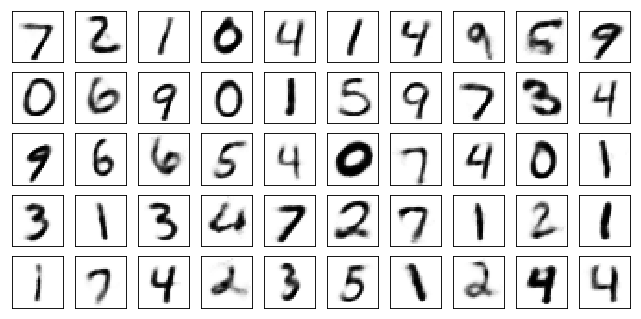

Test losses. E: 0.7005, AE: 0.0603, D: 0.6924
Train Epoch: 21 [0/50000 (0%)]	Losses E: 0.7046, AE: 0.0611, D: 0.6941
Train Epoch: 21 [5000/50000 (10%)]	Losses E: 0.6958, AE: 0.0634, D: 0.6961
Train Epoch: 21 [10000/50000 (20%)]	Losses E: 0.6928, AE: 0.0606, D: 0.6913
Train Epoch: 21 [15000/50000 (30%)]	Losses E: 0.6974, AE: 0.0637, D: 0.6897
Train Epoch: 21 [20000/50000 (40%)]	Losses E: 0.6941, AE: 0.0601, D: 0.6943
Train Epoch: 21 [25000/50000 (50%)]	Losses E: 0.7057, AE: 0.0642, D: 0.6931
Train Epoch: 21 [30000/50000 (60%)]	Losses E: 0.6899, AE: 0.0511, D: 0.6923
Train Epoch: 21 [35000/50000 (70%)]	Losses E: 0.7092, AE: 0.0617, D: 0.6898
Train Epoch: 21 [40000/50000 (80%)]	Losses E: 0.6824, AE: 0.0642, D: 0.6942
Train Epoch: 21 [45000/50000 (90%)]	Losses E: 0.6960, AE: 0.0472, D: 0.6886
Train Epoch: 21 [50000/50000 (100%)]	Losses E: 0.6794, AE: 0.0623, D: 0.6964


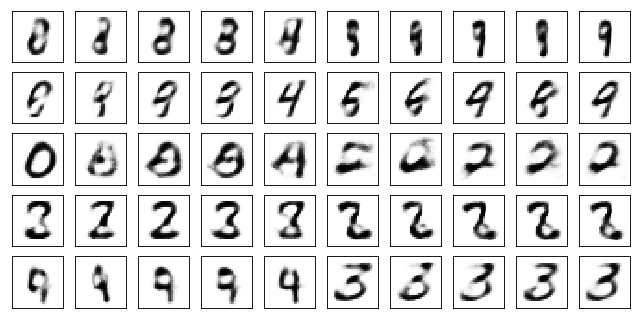

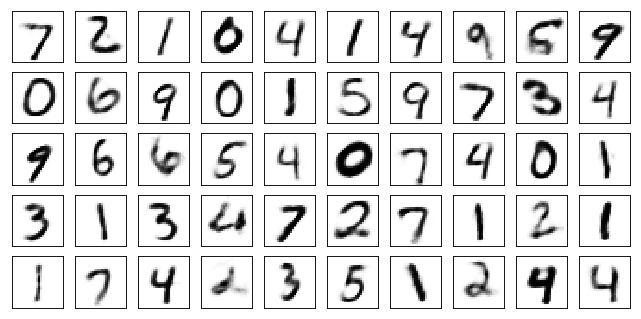

Test losses. E: 0.6797, AE: 0.0607, D: 0.6944
Train Epoch: 22 [0/50000 (0%)]	Losses E: 0.6851, AE: 0.0574, D: 0.6913
Train Epoch: 22 [5000/50000 (10%)]	Losses E: 0.6921, AE: 0.0590, D: 0.6913
Train Epoch: 22 [10000/50000 (20%)]	Losses E: 0.6986, AE: 0.0613, D: 0.6938
Train Epoch: 22 [15000/50000 (30%)]	Losses E: 0.6962, AE: 0.0544, D: 0.6914
Train Epoch: 22 [20000/50000 (40%)]	Losses E: 0.6915, AE: 0.0498, D: 0.6940
Train Epoch: 22 [25000/50000 (50%)]	Losses E: 0.6985, AE: 0.0559, D: 0.6932
Train Epoch: 22 [30000/50000 (60%)]	Losses E: 0.6982, AE: 0.0703, D: 0.6922
Train Epoch: 22 [35000/50000 (70%)]	Losses E: 0.6839, AE: 0.0657, D: 0.6962
Train Epoch: 22 [40000/50000 (80%)]	Losses E: 0.7011, AE: 0.0600, D: 0.6929
Train Epoch: 22 [45000/50000 (90%)]	Losses E: 0.7071, AE: 0.0585, D: 0.6916
Train Epoch: 22 [50000/50000 (100%)]	Losses E: 0.7030, AE: 0.0620, D: 0.6945


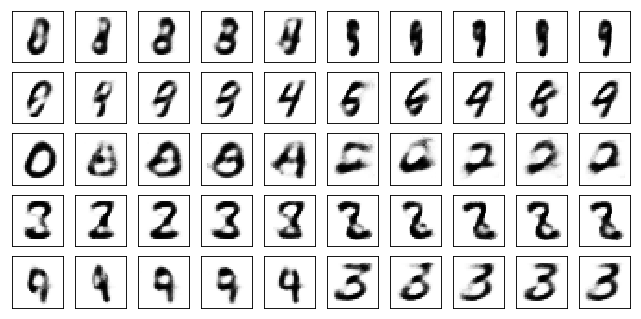

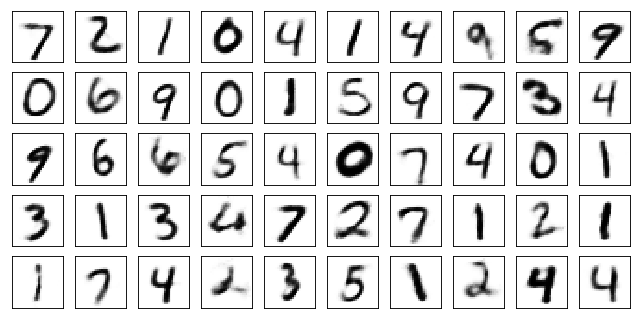

Test losses. E: 0.7012, AE: 0.0596, D: 0.6930
Train Epoch: 23 [0/50000 (0%)]	Losses E: 0.7013, AE: 0.0543, D: 0.6915
Train Epoch: 23 [5000/50000 (10%)]	Losses E: 0.6999, AE: 0.0624, D: 0.6935
Train Epoch: 23 [10000/50000 (20%)]	Losses E: 0.6912, AE: 0.0592, D: 0.6961
Train Epoch: 23 [15000/50000 (30%)]	Losses E: 0.6981, AE: 0.0485, D: 0.6939
Train Epoch: 23 [20000/50000 (40%)]	Losses E: 0.6977, AE: 0.0608, D: 0.6950
Train Epoch: 23 [25000/50000 (50%)]	Losses E: 0.6858, AE: 0.0636, D: 0.6927
Train Epoch: 23 [30000/50000 (60%)]	Losses E: 0.6933, AE: 0.0569, D: 0.6940
Train Epoch: 23 [35000/50000 (70%)]	Losses E: 0.7011, AE: 0.0617, D: 0.6944
Train Epoch: 23 [40000/50000 (80%)]	Losses E: 0.6992, AE: 0.0540, D: 0.6923
Train Epoch: 23 [45000/50000 (90%)]	Losses E: 0.6878, AE: 0.0468, D: 0.6971
Train Epoch: 23 [50000/50000 (100%)]	Losses E: 0.6957, AE: 0.0519, D: 0.6945


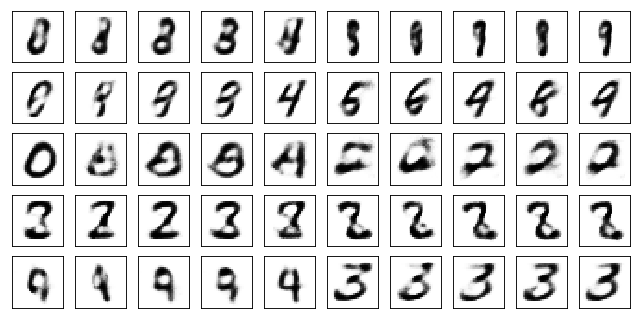

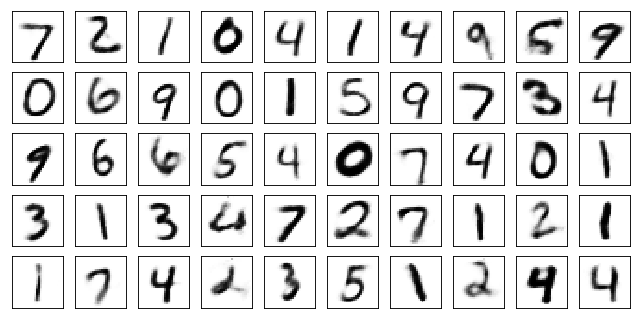

Test losses. E: 0.6969, AE: 0.0578, D: 0.6925
Train Epoch: 24 [0/50000 (0%)]	Losses E: 0.6995, AE: 0.0495, D: 0.6930
Train Epoch: 24 [5000/50000 (10%)]	Losses E: 0.6935, AE: 0.0584, D: 0.6915
Train Epoch: 24 [10000/50000 (20%)]	Losses E: 0.6946, AE: 0.0577, D: 0.6927
Train Epoch: 24 [15000/50000 (30%)]	Losses E: 0.6961, AE: 0.0617, D: 0.6952
Train Epoch: 24 [20000/50000 (40%)]	Losses E: 0.6826, AE: 0.0643, D: 0.6941
Train Epoch: 24 [25000/50000 (50%)]	Losses E: 0.6888, AE: 0.0642, D: 0.6950
Train Epoch: 24 [30000/50000 (60%)]	Losses E: 0.6991, AE: 0.0594, D: 0.6911
Train Epoch: 24 [35000/50000 (70%)]	Losses E: 0.6947, AE: 0.0550, D: 0.6941
Train Epoch: 24 [40000/50000 (80%)]	Losses E: 0.6942, AE: 0.0630, D: 0.6943
Train Epoch: 24 [45000/50000 (90%)]	Losses E: 0.6939, AE: 0.0526, D: 0.6919
Train Epoch: 24 [50000/50000 (100%)]	Losses E: 0.6989, AE: 0.0574, D: 0.6938


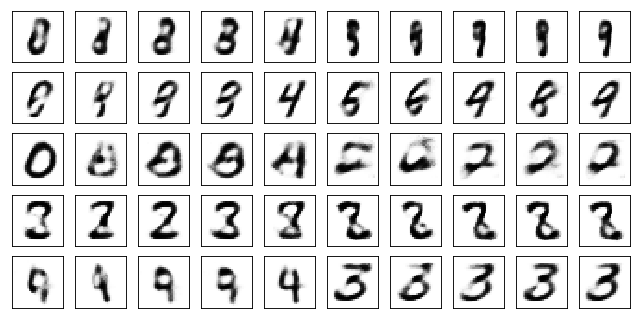

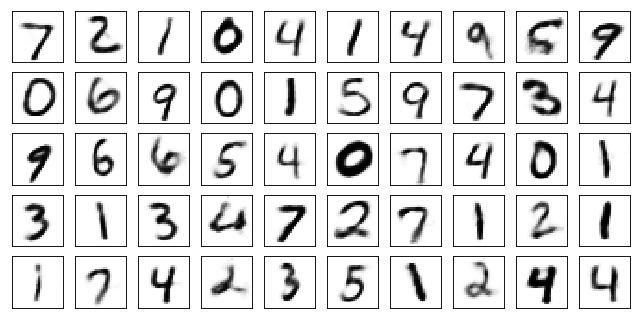

Test losses. E: 0.6962, AE: 0.0577, D: 0.6933
Train Epoch: 25 [0/50000 (0%)]	Losses E: 0.7018, AE: 0.0609, D: 0.6919
Train Epoch: 25 [5000/50000 (10%)]	Losses E: 0.6973, AE: 0.0610, D: 0.6952
Train Epoch: 25 [10000/50000 (20%)]	Losses E: 0.6965, AE: 0.0531, D: 0.6912
Train Epoch: 25 [15000/50000 (30%)]	Losses E: 0.6930, AE: 0.0516, D: 0.6900
Train Epoch: 25 [20000/50000 (40%)]	Losses E: 0.6955, AE: 0.0560, D: 0.6899
Train Epoch: 25 [25000/50000 (50%)]	Losses E: 0.6906, AE: 0.0540, D: 0.6939
Train Epoch: 25 [30000/50000 (60%)]	Losses E: 0.6900, AE: 0.0654, D: 0.6937
Train Epoch: 25 [35000/50000 (70%)]	Losses E: 0.6898, AE: 0.0534, D: 0.6923
Train Epoch: 25 [40000/50000 (80%)]	Losses E: 0.6897, AE: 0.0628, D: 0.6932
Train Epoch: 25 [45000/50000 (90%)]	Losses E: 0.6974, AE: 0.0560, D: 0.6940
Train Epoch: 25 [50000/50000 (100%)]	Losses E: 0.6902, AE: 0.0507, D: 0.6949


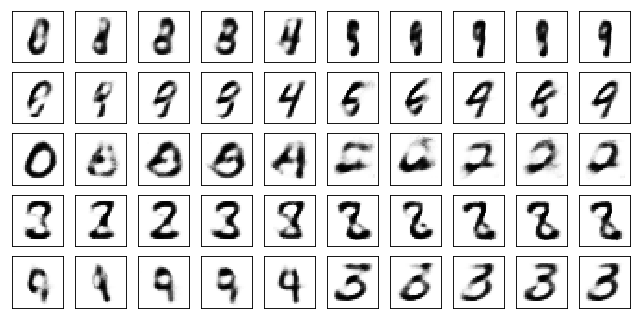

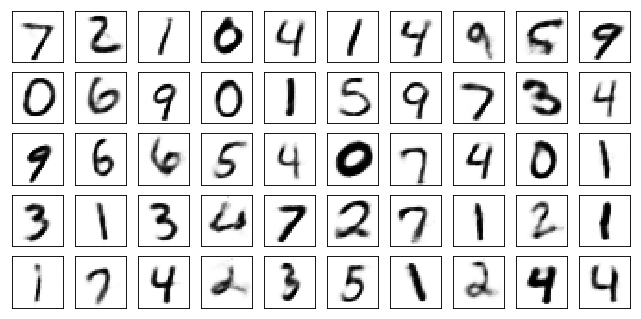

Test losses. E: 0.6899, AE: 0.0570, D: 0.6932
Train Epoch: 26 [0/50000 (0%)]	Losses E: 0.6925, AE: 0.0505, D: 0.6923
Train Epoch: 26 [5000/50000 (10%)]	Losses E: 0.6853, AE: 0.0559, D: 0.6936
Train Epoch: 26 [10000/50000 (20%)]	Losses E: 0.6997, AE: 0.0505, D: 0.6951
Train Epoch: 26 [15000/50000 (30%)]	Losses E: 0.6841, AE: 0.0590, D: 0.6910
Train Epoch: 26 [20000/50000 (40%)]	Losses E: 0.6884, AE: 0.0548, D: 0.6917
Train Epoch: 26 [25000/50000 (50%)]	Losses E: 0.6924, AE: 0.0568, D: 0.6915
Train Epoch: 26 [30000/50000 (60%)]	Losses E: 0.6936, AE: 0.0567, D: 0.6922
Train Epoch: 26 [35000/50000 (70%)]	Losses E: 0.6916, AE: 0.0567, D: 0.6947
Train Epoch: 26 [40000/50000 (80%)]	Losses E: 0.6930, AE: 0.0548, D: 0.6891
Train Epoch: 26 [45000/50000 (90%)]	Losses E: 0.6971, AE: 0.0465, D: 0.6931
Train Epoch: 26 [50000/50000 (100%)]	Losses E: 0.6862, AE: 0.0659, D: 0.6912


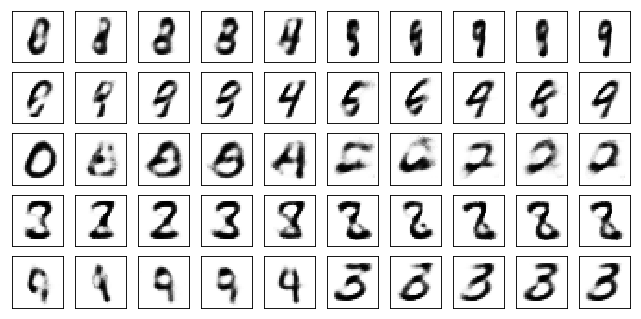

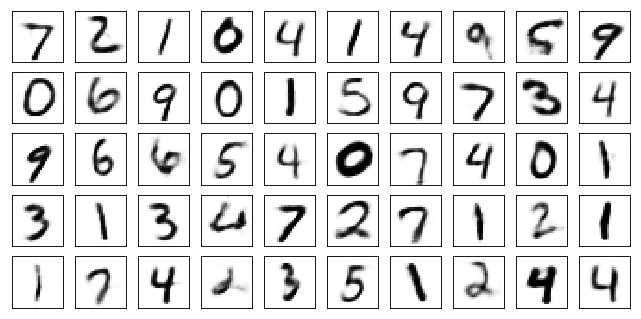

Test losses. E: 0.6838, AE: 0.0582, D: 0.6948
Train Epoch: 27 [0/50000 (0%)]	Losses E: 0.6874, AE: 0.0623, D: 0.6950
Train Epoch: 27 [5000/50000 (10%)]	Losses E: 0.6893, AE: 0.0519, D: 0.6927
Train Epoch: 27 [10000/50000 (20%)]	Losses E: 0.6827, AE: 0.0518, D: 0.6960
Train Epoch: 27 [15000/50000 (30%)]	Losses E: 0.7061, AE: 0.0552, D: 0.6905
Train Epoch: 27 [20000/50000 (40%)]	Losses E: 0.6948, AE: 0.0567, D: 0.6933
Train Epoch: 27 [25000/50000 (50%)]	Losses E: 0.6954, AE: 0.0531, D: 0.6954
Train Epoch: 27 [30000/50000 (60%)]	Losses E: 0.6932, AE: 0.0632, D: 0.6955
Train Epoch: 27 [35000/50000 (70%)]	Losses E: 0.6891, AE: 0.0520, D: 0.6923
Train Epoch: 27 [40000/50000 (80%)]	Losses E: 0.7025, AE: 0.0546, D: 0.6934
Train Epoch: 27 [45000/50000 (90%)]	Losses E: 0.7008, AE: 0.0547, D: 0.6971
Train Epoch: 27 [50000/50000 (100%)]	Losses E: 0.6994, AE: 0.0576, D: 0.6927


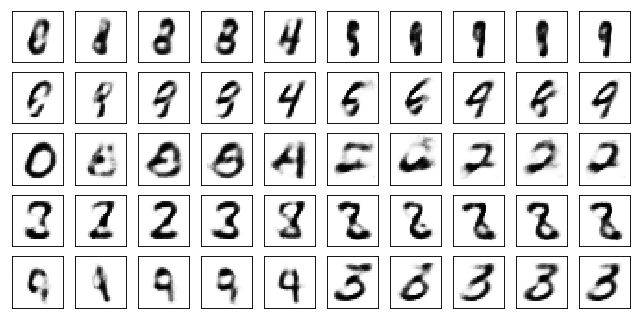

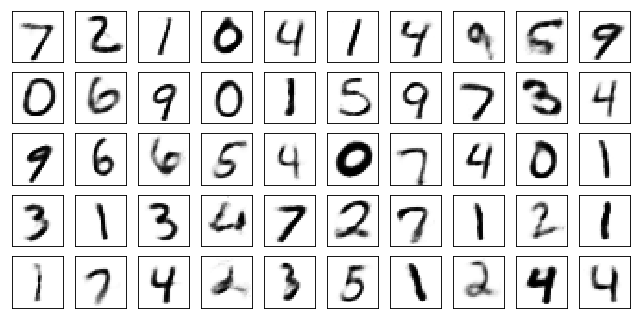

Test losses. E: 0.6980, AE: 0.0578, D: 0.6939
Train Epoch: 28 [0/50000 (0%)]	Losses E: 0.7025, AE: 0.0548, D: 0.6953
Train Epoch: 28 [5000/50000 (10%)]	Losses E: 0.6864, AE: 0.0503, D: 0.6950
Train Epoch: 28 [10000/50000 (20%)]	Losses E: 0.6929, AE: 0.0533, D: 0.6964
Train Epoch: 28 [15000/50000 (30%)]	Losses E: 0.6928, AE: 0.0533, D: 0.6945
Train Epoch: 28 [20000/50000 (40%)]	Losses E: 0.6981, AE: 0.0471, D: 0.6909
Train Epoch: 28 [25000/50000 (50%)]	Losses E: 0.6805, AE: 0.0541, D: 0.6947
Train Epoch: 28 [30000/50000 (60%)]	Losses E: 0.6793, AE: 0.0561, D: 0.6937
Train Epoch: 28 [35000/50000 (70%)]	Losses E: 0.6952, AE: 0.0540, D: 0.6942
Train Epoch: 28 [40000/50000 (80%)]	Losses E: 0.7107, AE: 0.0535, D: 0.6996
Train Epoch: 28 [45000/50000 (90%)]	Losses E: 0.6967, AE: 0.0495, D: 0.6915
Train Epoch: 28 [50000/50000 (100%)]	Losses E: 0.6985, AE: 0.0520, D: 0.6943


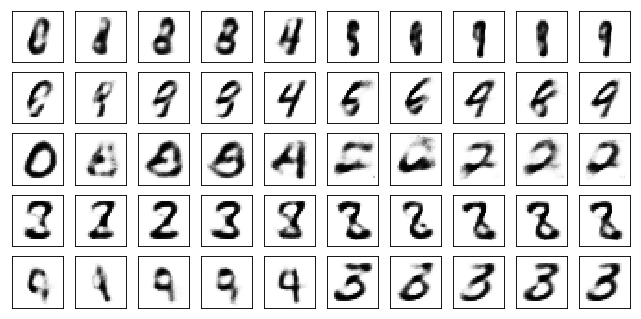

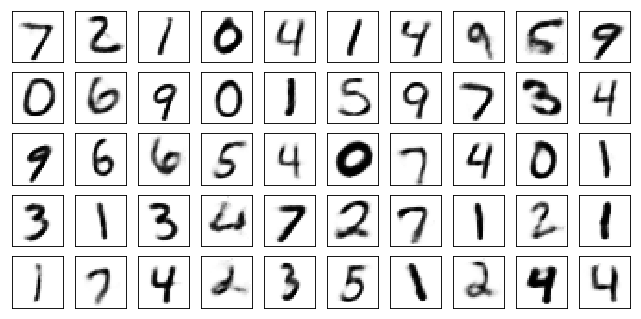

Test losses. E: 0.6971, AE: 0.0550, D: 0.6933
Train Epoch: 29 [0/50000 (0%)]	Losses E: 0.6980, AE: 0.0607, D: 0.6928
Train Epoch: 29 [5000/50000 (10%)]	Losses E: 0.7002, AE: 0.0515, D: 0.6927
Train Epoch: 29 [10000/50000 (20%)]	Losses E: 0.6843, AE: 0.0506, D: 0.6942
Train Epoch: 29 [15000/50000 (30%)]	Losses E: 0.6874, AE: 0.0460, D: 0.6957
Train Epoch: 29 [20000/50000 (40%)]	Losses E: 0.6924, AE: 0.0504, D: 0.6956
Train Epoch: 29 [25000/50000 (50%)]	Losses E: 0.7039, AE: 0.0438, D: 0.6915
Train Epoch: 29 [30000/50000 (60%)]	Losses E: 0.6947, AE: 0.0463, D: 0.6947
Train Epoch: 29 [35000/50000 (70%)]	Losses E: 0.6924, AE: 0.0639, D: 0.6929
Train Epoch: 29 [40000/50000 (80%)]	Losses E: 0.6930, AE: 0.0582, D: 0.6933
Train Epoch: 29 [45000/50000 (90%)]	Losses E: 0.6951, AE: 0.0451, D: 0.6905
Train Epoch: 29 [50000/50000 (100%)]	Losses E: 0.6891, AE: 0.0486, D: 0.6919


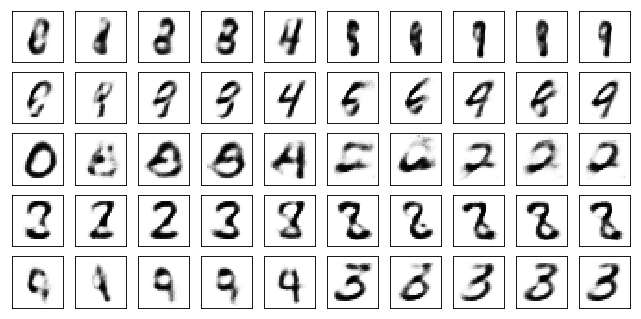

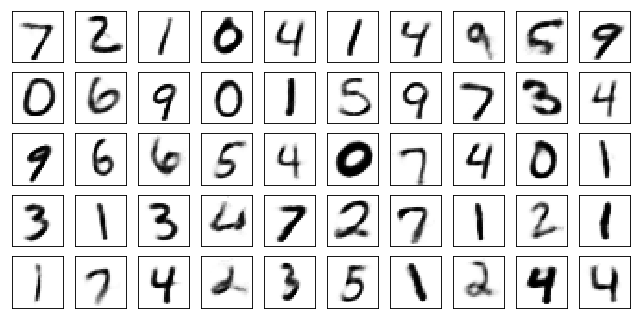

Test losses. E: 0.6883, AE: 0.0545, D: 0.6921
Train Epoch: 30 [0/50000 (0%)]	Losses E: 0.6858, AE: 0.0555, D: 0.6945
Train Epoch: 30 [5000/50000 (10%)]	Losses E: 0.6969, AE: 0.0502, D: 0.6946
Train Epoch: 30 [10000/50000 (20%)]	Losses E: 0.6925, AE: 0.0603, D: 0.6948
Train Epoch: 30 [15000/50000 (30%)]	Losses E: 0.6923, AE: 0.0503, D: 0.6908
Train Epoch: 30 [20000/50000 (40%)]	Losses E: 0.6863, AE: 0.0517, D: 0.6923
Train Epoch: 30 [25000/50000 (50%)]	Losses E: 0.7019, AE: 0.0591, D: 0.6904
Train Epoch: 30 [30000/50000 (60%)]	Losses E: 0.6934, AE: 0.0529, D: 0.6923
Train Epoch: 30 [35000/50000 (70%)]	Losses E: 0.6914, AE: 0.0503, D: 0.6924
Train Epoch: 30 [40000/50000 (80%)]	Losses E: 0.7026, AE: 0.0596, D: 0.6942
Train Epoch: 30 [45000/50000 (90%)]	Losses E: 0.6965, AE: 0.0425, D: 0.6882
Train Epoch: 30 [50000/50000 (100%)]	Losses E: 0.6973, AE: 0.0566, D: 0.6924


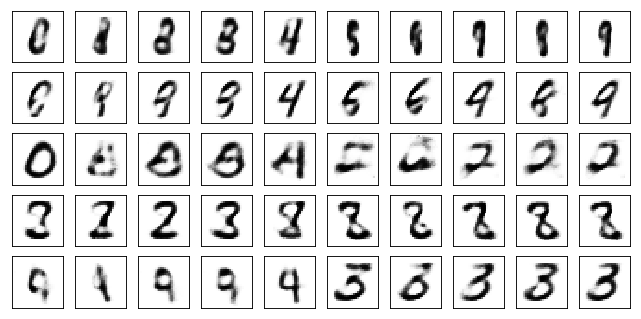

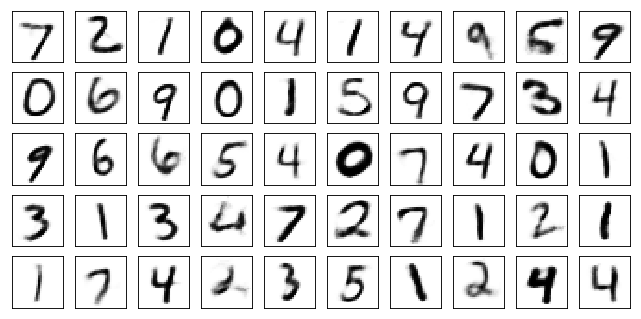

Test losses. E: 0.6951, AE: 0.0547, D: 0.6928
Train Epoch: 31 [0/50000 (0%)]	Losses E: 0.6979, AE: 0.0534, D: 0.6937
Train Epoch: 31 [5000/50000 (10%)]	Losses E: 0.6885, AE: 0.0454, D: 0.6933
Train Epoch: 31 [10000/50000 (20%)]	Losses E: 0.6981, AE: 0.0620, D: 0.6952
Train Epoch: 31 [15000/50000 (30%)]	Losses E: 0.7044, AE: 0.0544, D: 0.6944
Train Epoch: 31 [20000/50000 (40%)]	Losses E: 0.6901, AE: 0.0600, D: 0.6934
Train Epoch: 31 [25000/50000 (50%)]	Losses E: 0.6953, AE: 0.0471, D: 0.6963
Train Epoch: 31 [30000/50000 (60%)]	Losses E: 0.6949, AE: 0.0494, D: 0.6927
Train Epoch: 31 [35000/50000 (70%)]	Losses E: 0.6991, AE: 0.0518, D: 0.6931
Train Epoch: 31 [40000/50000 (80%)]	Losses E: 0.6983, AE: 0.0580, D: 0.6945
Train Epoch: 31 [45000/50000 (90%)]	Losses E: 0.6967, AE: 0.0525, D: 0.6934
Train Epoch: 31 [50000/50000 (100%)]	Losses E: 0.6887, AE: 0.0479, D: 0.6936


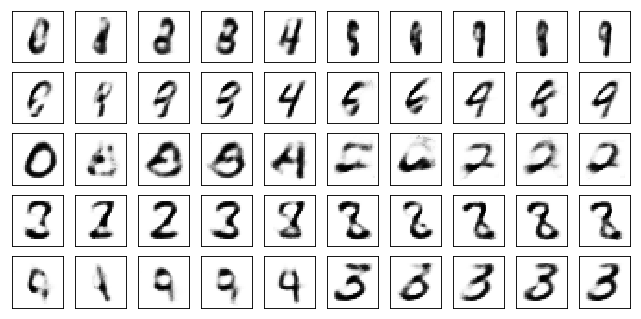

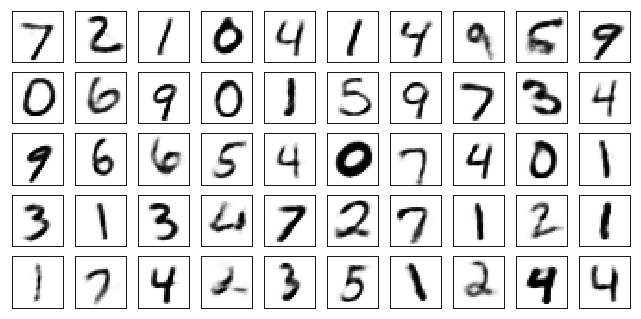

Test losses. E: 0.6915, AE: 0.0547, D: 0.6931
Train Epoch: 32 [0/50000 (0%)]	Losses E: 0.6934, AE: 0.0515, D: 0.6938
Train Epoch: 32 [5000/50000 (10%)]	Losses E: 0.6822, AE: 0.0467, D: 0.6974
Train Epoch: 32 [10000/50000 (20%)]	Losses E: 0.7010, AE: 0.0518, D: 0.6940
Train Epoch: 32 [15000/50000 (30%)]	Losses E: 0.6949, AE: 0.0419, D: 0.6955
Train Epoch: 32 [20000/50000 (40%)]	Losses E: 0.6955, AE: 0.0474, D: 0.6912
Train Epoch: 32 [25000/50000 (50%)]	Losses E: 0.6909, AE: 0.0577, D: 0.6947
Train Epoch: 32 [30000/50000 (60%)]	Losses E: 0.6930, AE: 0.0514, D: 0.6950
Train Epoch: 32 [35000/50000 (70%)]	Losses E: 0.6899, AE: 0.0475, D: 0.6910
Train Epoch: 32 [40000/50000 (80%)]	Losses E: 0.6913, AE: 0.0493, D: 0.6925
Train Epoch: 32 [45000/50000 (90%)]	Losses E: 0.6967, AE: 0.0577, D: 0.6926
Train Epoch: 32 [50000/50000 (100%)]	Losses E: 0.6928, AE: 0.0441, D: 0.6908


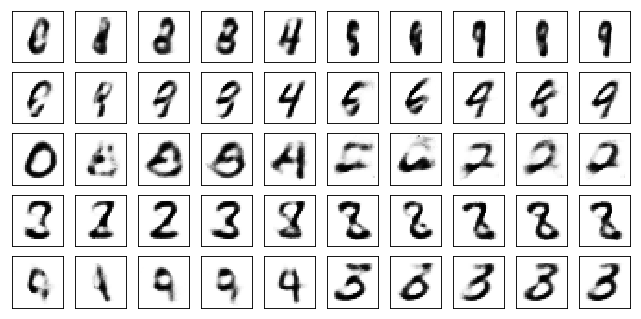

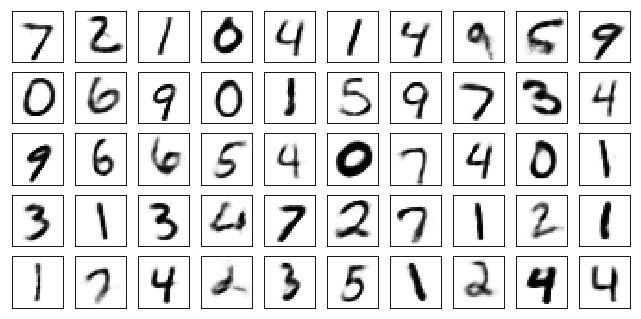

Test losses. E: 0.6930, AE: 0.0542, D: 0.6924
Train Epoch: 33 [0/50000 (0%)]	Losses E: 0.6941, AE: 0.0525, D: 0.6928
Train Epoch: 33 [5000/50000 (10%)]	Losses E: 0.6911, AE: 0.0446, D: 0.6922
Train Epoch: 33 [10000/50000 (20%)]	Losses E: 0.6940, AE: 0.0563, D: 0.6970
Train Epoch: 33 [15000/50000 (30%)]	Losses E: 0.6980, AE: 0.0506, D: 0.6917
Train Epoch: 33 [20000/50000 (40%)]	Losses E: 0.6930, AE: 0.0477, D: 0.6945
Train Epoch: 33 [25000/50000 (50%)]	Losses E: 0.6986, AE: 0.0461, D: 0.6924
Train Epoch: 33 [30000/50000 (60%)]	Losses E: 0.7061, AE: 0.0523, D: 0.6891
Train Epoch: 33 [35000/50000 (70%)]	Losses E: 0.6925, AE: 0.0551, D: 0.6941
Train Epoch: 33 [40000/50000 (80%)]	Losses E: 0.6959, AE: 0.0565, D: 0.6954
Train Epoch: 33 [45000/50000 (90%)]	Losses E: 0.6931, AE: 0.0524, D: 0.6937
Train Epoch: 33 [50000/50000 (100%)]	Losses E: 0.6911, AE: 0.0461, D: 0.6955


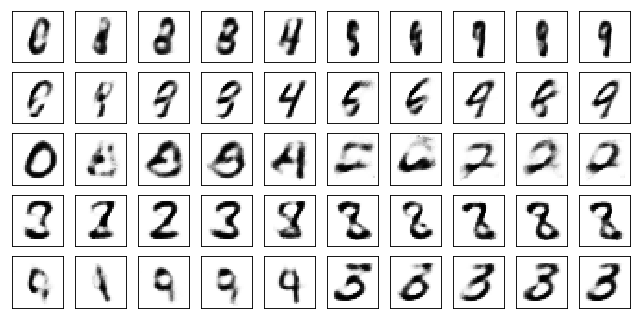

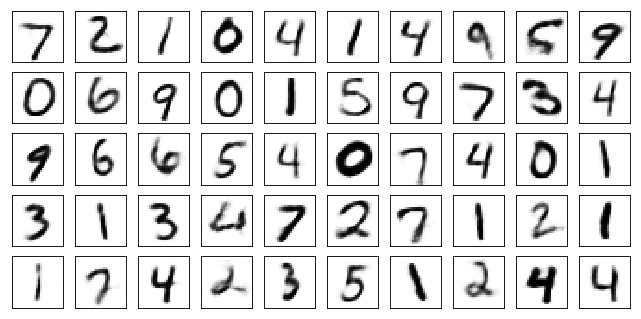

Test losses. E: 0.6892, AE: 0.0533, D: 0.6933
Train Epoch: 34 [0/50000 (0%)]	Losses E: 0.6914, AE: 0.0508, D: 0.6897
Train Epoch: 34 [5000/50000 (10%)]	Losses E: 0.6888, AE: 0.0532, D: 0.6933
Train Epoch: 34 [10000/50000 (20%)]	Losses E: 0.6884, AE: 0.0528, D: 0.6938
Train Epoch: 34 [15000/50000 (30%)]	Losses E: 0.6882, AE: 0.0456, D: 0.6965
Train Epoch: 34 [20000/50000 (40%)]	Losses E: 0.6884, AE: 0.0442, D: 0.6933
Train Epoch: 34 [25000/50000 (50%)]	Losses E: 0.6920, AE: 0.0519, D: 0.6933
Train Epoch: 34 [30000/50000 (60%)]	Losses E: 0.6998, AE: 0.0450, D: 0.6914
Train Epoch: 34 [35000/50000 (70%)]	Losses E: 0.6878, AE: 0.0459, D: 0.6922
Train Epoch: 34 [40000/50000 (80%)]	Losses E: 0.6828, AE: 0.0578, D: 0.6950
Train Epoch: 34 [45000/50000 (90%)]	Losses E: 0.7097, AE: 0.0561, D: 0.6915
Train Epoch: 34 [50000/50000 (100%)]	Losses E: 0.6974, AE: 0.0446, D: 0.6917


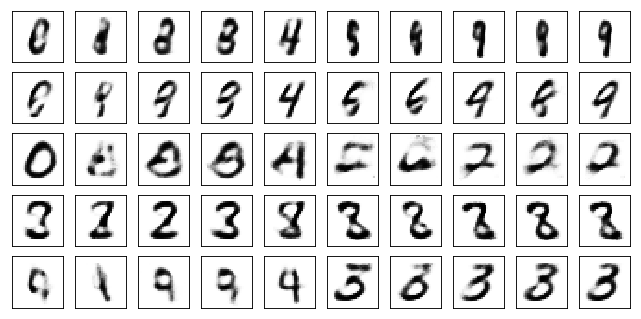

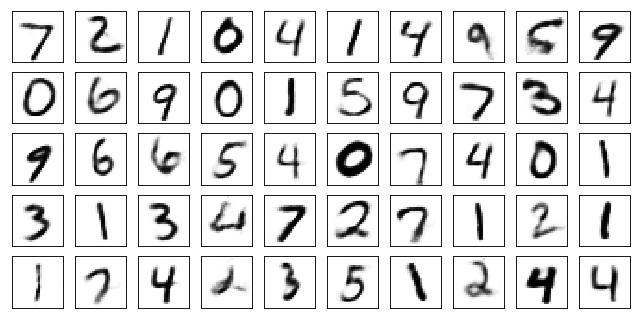

Test losses. E: 0.6977, AE: 0.0534, D: 0.6935
Train Epoch: 35 [0/50000 (0%)]	Losses E: 0.6984, AE: 0.0529, D: 0.6923
Train Epoch: 35 [5000/50000 (10%)]	Losses E: 0.6870, AE: 0.0442, D: 0.6956
Train Epoch: 35 [10000/50000 (20%)]	Losses E: 0.7005, AE: 0.0525, D: 0.6938
Train Epoch: 35 [15000/50000 (30%)]	Losses E: 0.6954, AE: 0.0488, D: 0.6938
Train Epoch: 35 [20000/50000 (40%)]	Losses E: 0.6871, AE: 0.0510, D: 0.6945
Train Epoch: 35 [25000/50000 (50%)]	Losses E: 0.7047, AE: 0.0553, D: 0.6924
Train Epoch: 35 [30000/50000 (60%)]	Losses E: 0.6858, AE: 0.0505, D: 0.6909
Train Epoch: 35 [35000/50000 (70%)]	Losses E: 0.6853, AE: 0.0523, D: 0.6924
Train Epoch: 35 [40000/50000 (80%)]	Losses E: 0.6980, AE: 0.0476, D: 0.6905
Train Epoch: 35 [45000/50000 (90%)]	Losses E: 0.6979, AE: 0.0481, D: 0.6931
Train Epoch: 35 [50000/50000 (100%)]	Losses E: 0.6816, AE: 0.0536, D: 0.6931


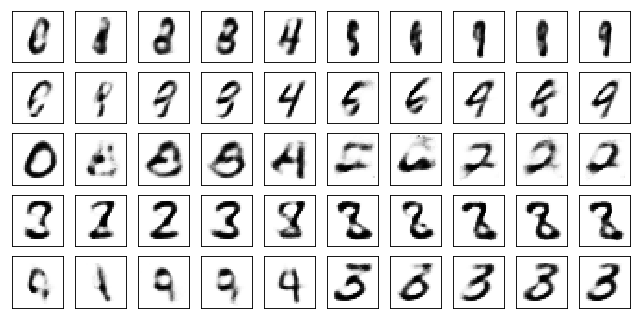

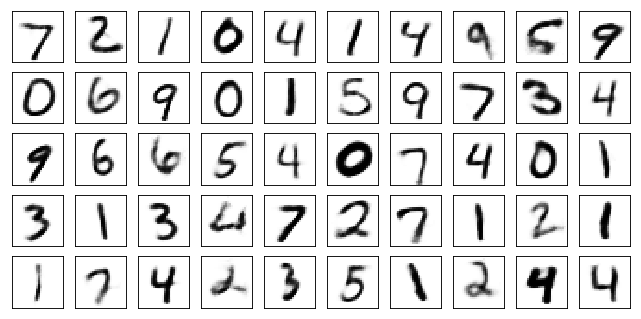

Test losses. E: 0.6871, AE: 0.0524, D: 0.6931
Train Epoch: 36 [0/50000 (0%)]	Losses E: 0.6878, AE: 0.0402, D: 0.6912
Train Epoch: 36 [5000/50000 (10%)]	Losses E: 0.6914, AE: 0.0402, D: 0.6908
Train Epoch: 36 [10000/50000 (20%)]	Losses E: 0.6872, AE: 0.0468, D: 0.6942
Train Epoch: 36 [15000/50000 (30%)]	Losses E: 0.6954, AE: 0.0481, D: 0.6963
Train Epoch: 36 [20000/50000 (40%)]	Losses E: 0.6923, AE: 0.0498, D: 0.6925
Train Epoch: 36 [25000/50000 (50%)]	Losses E: 0.6959, AE: 0.0574, D: 0.6930
Train Epoch: 36 [30000/50000 (60%)]	Losses E: 0.7058, AE: 0.0459, D: 0.6937
Train Epoch: 36 [35000/50000 (70%)]	Losses E: 0.6952, AE: 0.0606, D: 0.6937
Train Epoch: 36 [40000/50000 (80%)]	Losses E: 0.6827, AE: 0.0569, D: 0.6906
Train Epoch: 36 [45000/50000 (90%)]	Losses E: 0.6970, AE: 0.0534, D: 0.6927
Train Epoch: 36 [50000/50000 (100%)]	Losses E: 0.6883, AE: 0.0502, D: 0.6902


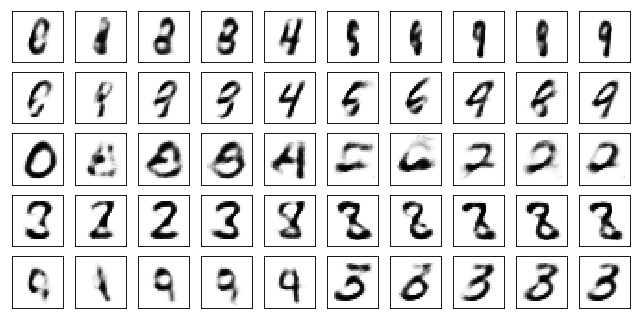

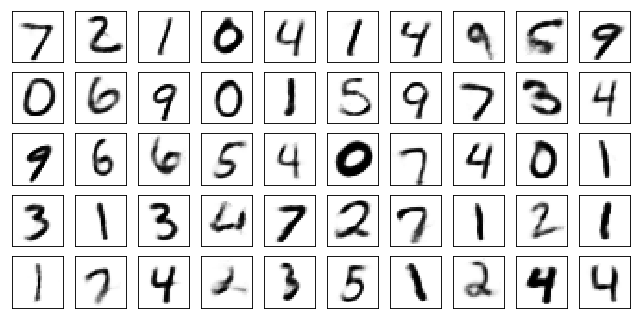

Test losses. E: 0.6884, AE: 0.0521, D: 0.6930
Train Epoch: 37 [0/50000 (0%)]	Losses E: 0.6892, AE: 0.0498, D: 0.6937
Train Epoch: 37 [5000/50000 (10%)]	Losses E: 0.6925, AE: 0.0555, D: 0.6920
Train Epoch: 37 [10000/50000 (20%)]	Losses E: 0.6891, AE: 0.0502, D: 0.6920
Train Epoch: 37 [15000/50000 (30%)]	Losses E: 0.6939, AE: 0.0469, D: 0.6912
Train Epoch: 37 [20000/50000 (40%)]	Losses E: 0.6920, AE: 0.0470, D: 0.6923
Train Epoch: 37 [25000/50000 (50%)]	Losses E: 0.6857, AE: 0.0418, D: 0.6970
Train Epoch: 37 [30000/50000 (60%)]	Losses E: 0.6981, AE: 0.0441, D: 0.6949
Train Epoch: 37 [35000/50000 (70%)]	Losses E: 0.6871, AE: 0.0478, D: 0.6909
Train Epoch: 37 [40000/50000 (80%)]	Losses E: 0.6869, AE: 0.0490, D: 0.6944
Train Epoch: 37 [45000/50000 (90%)]	Losses E: 0.6980, AE: 0.0526, D: 0.6952
Train Epoch: 37 [50000/50000 (100%)]	Losses E: 0.6866, AE: 0.0503, D: 0.6923


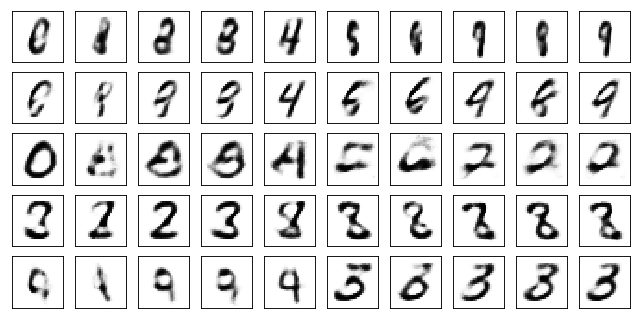

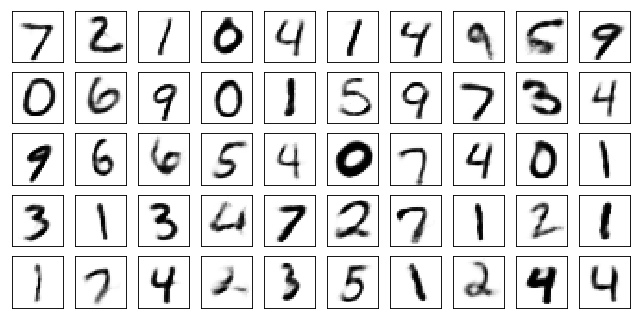

Test losses. E: 0.6874, AE: 0.0526, D: 0.6930
Train Epoch: 38 [0/50000 (0%)]	Losses E: 0.6913, AE: 0.0500, D: 0.6902
Train Epoch: 38 [5000/50000 (10%)]	Losses E: 0.6945, AE: 0.0478, D: 0.6952
Train Epoch: 38 [10000/50000 (20%)]	Losses E: 0.6983, AE: 0.0491, D: 0.6926
Train Epoch: 38 [15000/50000 (30%)]	Losses E: 0.6890, AE: 0.0469, D: 0.6926
Train Epoch: 38 [20000/50000 (40%)]	Losses E: 0.6827, AE: 0.0460, D: 0.6949
Train Epoch: 38 [25000/50000 (50%)]	Losses E: 0.6896, AE: 0.0409, D: 0.6929
Train Epoch: 38 [30000/50000 (60%)]	Losses E: 0.6904, AE: 0.0412, D: 0.6923
Train Epoch: 38 [35000/50000 (70%)]	Losses E: 0.7041, AE: 0.0538, D: 0.6923
Train Epoch: 38 [40000/50000 (80%)]	Losses E: 0.6958, AE: 0.0442, D: 0.6942
Train Epoch: 38 [45000/50000 (90%)]	Losses E: 0.6897, AE: 0.0560, D: 0.6964
Train Epoch: 38 [50000/50000 (100%)]	Losses E: 0.6956, AE: 0.0504, D: 0.6923


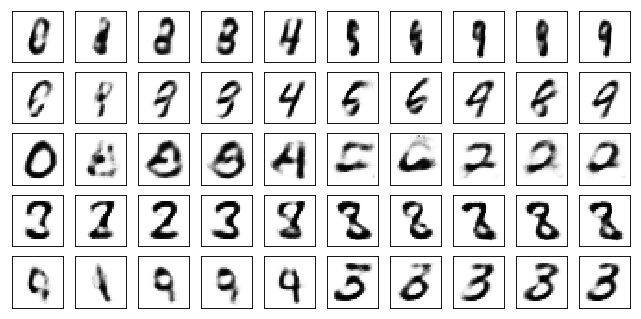

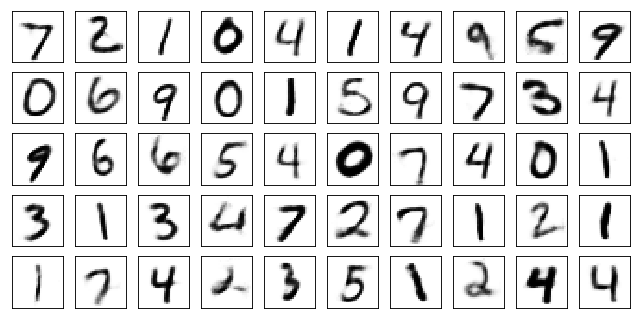

Test losses. E: 0.6955, AE: 0.0517, D: 0.6928
Train Epoch: 39 [0/50000 (0%)]	Losses E: 0.7008, AE: 0.0474, D: 0.6946
Train Epoch: 39 [5000/50000 (10%)]	Losses E: 0.6955, AE: 0.0443, D: 0.6934
Train Epoch: 39 [10000/50000 (20%)]	Losses E: 0.6887, AE: 0.0470, D: 0.6915
Train Epoch: 39 [15000/50000 (30%)]	Losses E: 0.6821, AE: 0.0514, D: 0.6922
Train Epoch: 39 [20000/50000 (40%)]	Losses E: 0.6958, AE: 0.0519, D: 0.6918
Train Epoch: 39 [25000/50000 (50%)]	Losses E: 0.6941, AE: 0.0596, D: 0.6935
Train Epoch: 39 [30000/50000 (60%)]	Losses E: 0.6914, AE: 0.0460, D: 0.6938
Train Epoch: 39 [35000/50000 (70%)]	Losses E: 0.6916, AE: 0.0472, D: 0.6922
Train Epoch: 39 [40000/50000 (80%)]	Losses E: 0.6874, AE: 0.0471, D: 0.6944
Train Epoch: 39 [45000/50000 (90%)]	Losses E: 0.6921, AE: 0.0488, D: 0.6955
Train Epoch: 39 [50000/50000 (100%)]	Losses E: 0.7003, AE: 0.0475, D: 0.6919


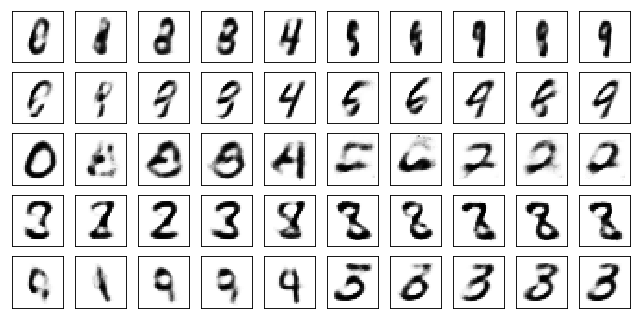

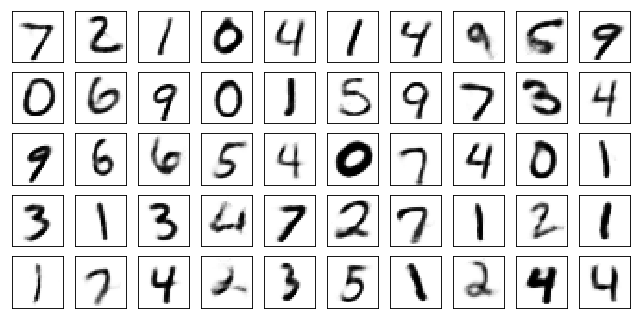

Test losses. E: 0.6952, AE: 0.0511, D: 0.6928
Train Epoch: 40 [0/50000 (0%)]	Losses E: 0.6974, AE: 0.0430, D: 0.6925
Train Epoch: 40 [5000/50000 (10%)]	Losses E: 0.6983, AE: 0.0523, D: 0.6926
Train Epoch: 40 [10000/50000 (20%)]	Losses E: 0.6895, AE: 0.0440, D: 0.6894
Train Epoch: 40 [15000/50000 (30%)]	Losses E: 0.6941, AE: 0.0475, D: 0.6940
Train Epoch: 40 [20000/50000 (40%)]	Losses E: 0.6937, AE: 0.0412, D: 0.6931
Train Epoch: 40 [25000/50000 (50%)]	Losses E: 0.6921, AE: 0.0492, D: 0.6942
Train Epoch: 40 [30000/50000 (60%)]	Losses E: 0.6885, AE: 0.0522, D: 0.6948
Train Epoch: 40 [35000/50000 (70%)]	Losses E: 0.7090, AE: 0.0448, D: 0.6924
Train Epoch: 40 [40000/50000 (80%)]	Losses E: 0.6948, AE: 0.0501, D: 0.6957
Train Epoch: 40 [45000/50000 (90%)]	Losses E: 0.6907, AE: 0.0515, D: 0.6962
Train Epoch: 40 [50000/50000 (100%)]	Losses E: 0.6948, AE: 0.0482, D: 0.6949


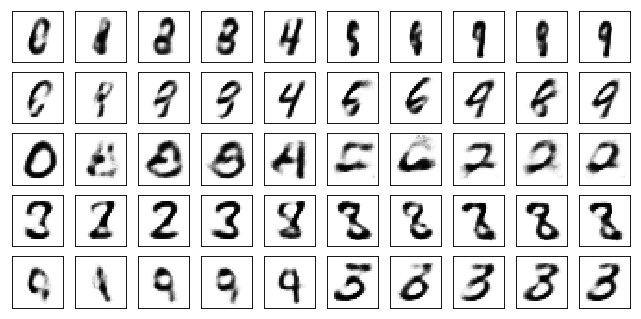

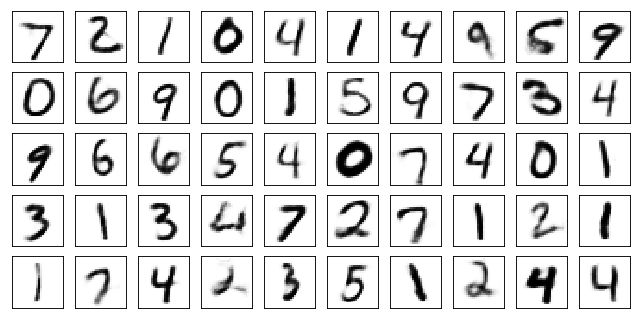

Test losses. E: 0.6931, AE: 0.0511, D: 0.6930
Train Epoch: 41 [0/50000 (0%)]	Losses E: 0.6928, AE: 0.0439, D: 0.6933
Train Epoch: 41 [5000/50000 (10%)]	Losses E: 0.6970, AE: 0.0454, D: 0.6914
Train Epoch: 41 [10000/50000 (20%)]	Losses E: 0.6906, AE: 0.0592, D: 0.6923
Train Epoch: 41 [15000/50000 (30%)]	Losses E: 0.6911, AE: 0.0491, D: 0.6927
Train Epoch: 41 [20000/50000 (40%)]	Losses E: 0.6938, AE: 0.0490, D: 0.6946
Train Epoch: 41 [25000/50000 (50%)]	Losses E: 0.6891, AE: 0.0470, D: 0.6977
Train Epoch: 41 [30000/50000 (60%)]	Losses E: 0.6934, AE: 0.0507, D: 0.6928
Train Epoch: 41 [35000/50000 (70%)]	Losses E: 0.6888, AE: 0.0427, D: 0.6960
Train Epoch: 41 [40000/50000 (80%)]	Losses E: 0.6915, AE: 0.0475, D: 0.6906
Train Epoch: 41 [45000/50000 (90%)]	Losses E: 0.6898, AE: 0.0504, D: 0.6943
Train Epoch: 41 [50000/50000 (100%)]	Losses E: 0.6938, AE: 0.0526, D: 0.6931


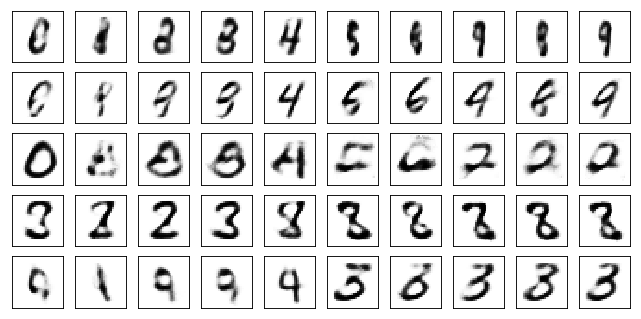

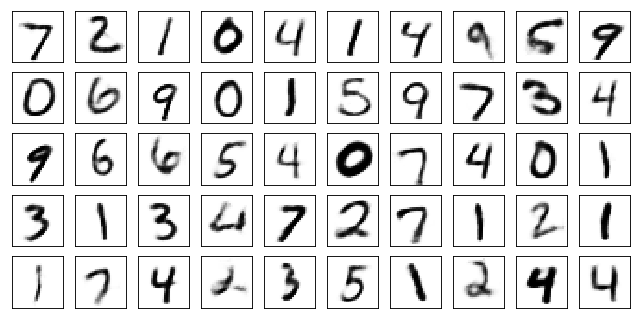

Test losses. E: 0.6916, AE: 0.0517, D: 0.6937
Train Epoch: 42 [0/50000 (0%)]	Losses E: 0.6966, AE: 0.0503, D: 0.6941
Train Epoch: 42 [5000/50000 (10%)]	Losses E: 0.6965, AE: 0.0487, D: 0.6891
Train Epoch: 42 [10000/50000 (20%)]	Losses E: 0.6963, AE: 0.0439, D: 0.6951
Train Epoch: 42 [15000/50000 (30%)]	Losses E: 0.6883, AE: 0.0427, D: 0.6948
Train Epoch: 42 [20000/50000 (40%)]	Losses E: 0.6903, AE: 0.0500, D: 0.6945
Train Epoch: 42 [25000/50000 (50%)]	Losses E: 0.6991, AE: 0.0476, D: 0.6925
Train Epoch: 42 [30000/50000 (60%)]	Losses E: 0.6953, AE: 0.0454, D: 0.6944
Train Epoch: 42 [35000/50000 (70%)]	Losses E: 0.6928, AE: 0.0479, D: 0.6946
Train Epoch: 42 [40000/50000 (80%)]	Losses E: 0.6944, AE: 0.0499, D: 0.6937
Train Epoch: 42 [45000/50000 (90%)]	Losses E: 0.6904, AE: 0.0484, D: 0.6913
Train Epoch: 42 [50000/50000 (100%)]	Losses E: 0.6967, AE: 0.0463, D: 0.6940


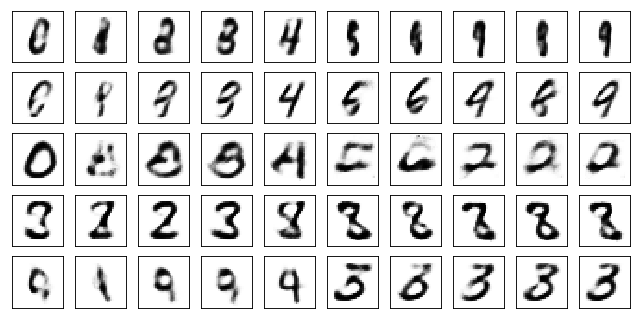

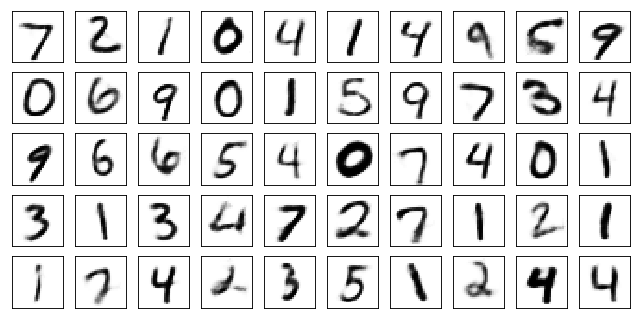

Test losses. E: 0.6946, AE: 0.0510, D: 0.6939
Train Epoch: 43 [0/50000 (0%)]	Losses E: 0.6962, AE: 0.0470, D: 0.6967
Train Epoch: 43 [5000/50000 (10%)]	Losses E: 0.7016, AE: 0.0452, D: 0.6921
Train Epoch: 43 [10000/50000 (20%)]	Losses E: 0.6933, AE: 0.0546, D: 0.6926
Train Epoch: 43 [15000/50000 (30%)]	Losses E: 0.6944, AE: 0.0455, D: 0.6944
Train Epoch: 43 [20000/50000 (40%)]	Losses E: 0.6998, AE: 0.0436, D: 0.6911
Train Epoch: 43 [25000/50000 (50%)]	Losses E: 0.6866, AE: 0.0465, D: 0.6942
Train Epoch: 43 [30000/50000 (60%)]	Losses E: 0.6919, AE: 0.0470, D: 0.6951
Train Epoch: 43 [35000/50000 (70%)]	Losses E: 0.6963, AE: 0.0540, D: 0.6942
Train Epoch: 43 [40000/50000 (80%)]	Losses E: 0.6876, AE: 0.0577, D: 0.6933
Train Epoch: 43 [45000/50000 (90%)]	Losses E: 0.6893, AE: 0.0511, D: 0.6944
Train Epoch: 43 [50000/50000 (100%)]	Losses E: 0.6939, AE: 0.0440, D: 0.6934


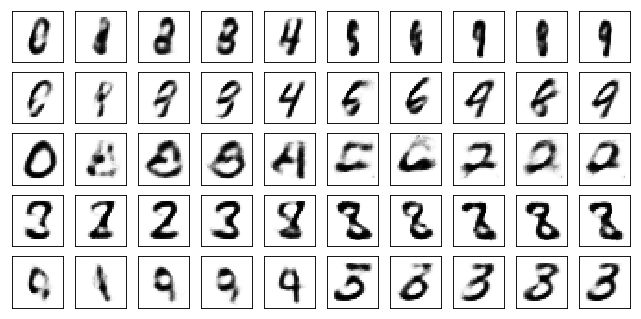

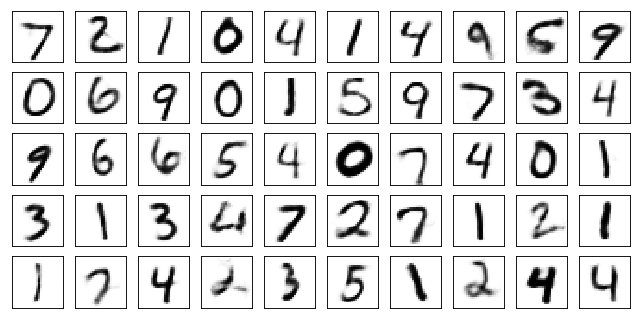

Test losses. E: 0.6964, AE: 0.0506, D: 0.6935
Train Epoch: 44 [0/50000 (0%)]	Losses E: 0.6953, AE: 0.0536, D: 0.6926
Train Epoch: 44 [5000/50000 (10%)]	Losses E: 0.6921, AE: 0.0461, D: 0.6921
Train Epoch: 44 [10000/50000 (20%)]	Losses E: 0.6892, AE: 0.0453, D: 0.6917
Train Epoch: 44 [15000/50000 (30%)]	Losses E: 0.6974, AE: 0.0541, D: 0.6918
Train Epoch: 44 [20000/50000 (40%)]	Losses E: 0.6945, AE: 0.0532, D: 0.6955
Train Epoch: 44 [25000/50000 (50%)]	Losses E: 0.6966, AE: 0.0502, D: 0.6940
Train Epoch: 44 [30000/50000 (60%)]	Losses E: 0.6939, AE: 0.0446, D: 0.6904
Train Epoch: 44 [35000/50000 (70%)]	Losses E: 0.6896, AE: 0.0489, D: 0.6964
Train Epoch: 44 [40000/50000 (80%)]	Losses E: 0.6990, AE: 0.0469, D: 0.6953
Train Epoch: 44 [45000/50000 (90%)]	Losses E: 0.6956, AE: 0.0447, D: 0.6914
Train Epoch: 44 [50000/50000 (100%)]	Losses E: 0.6882, AE: 0.0490, D: 0.6935


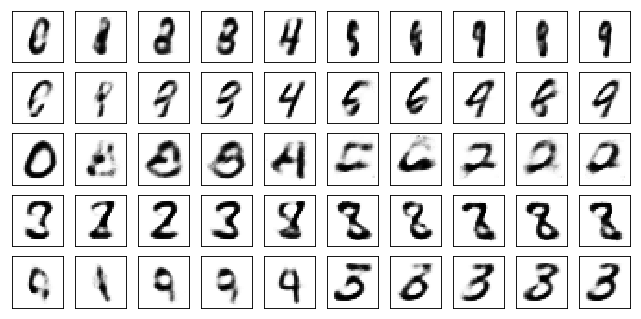

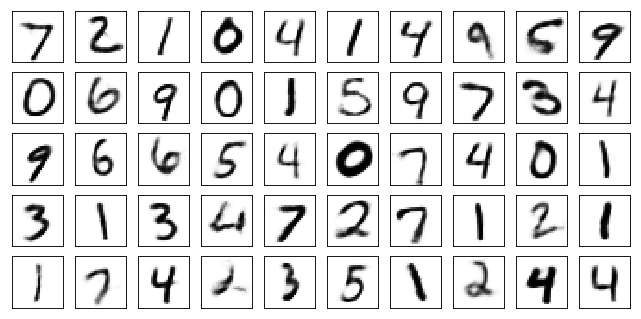

Test losses. E: 0.6883, AE: 0.0497, D: 0.6930
Train Epoch: 45 [0/50000 (0%)]	Losses E: 0.6924, AE: 0.0452, D: 0.6933
Train Epoch: 45 [5000/50000 (10%)]	Losses E: 0.6971, AE: 0.0517, D: 0.6905
Train Epoch: 45 [10000/50000 (20%)]	Losses E: 0.6928, AE: 0.0468, D: 0.6944
Train Epoch: 45 [15000/50000 (30%)]	Losses E: 0.6920, AE: 0.0503, D: 0.6927
Train Epoch: 45 [20000/50000 (40%)]	Losses E: 0.6951, AE: 0.0505, D: 0.6952
Train Epoch: 45 [25000/50000 (50%)]	Losses E: 0.6901, AE: 0.0501, D: 0.6906
Train Epoch: 45 [30000/50000 (60%)]	Losses E: 0.6856, AE: 0.0455, D: 0.6931
Train Epoch: 45 [35000/50000 (70%)]	Losses E: 0.6896, AE: 0.0459, D: 0.6924
Train Epoch: 45 [40000/50000 (80%)]	Losses E: 0.6945, AE: 0.0425, D: 0.6966
Train Epoch: 45 [45000/50000 (90%)]	Losses E: 0.7080, AE: 0.0518, D: 0.6917
Train Epoch: 45 [50000/50000 (100%)]	Losses E: 0.6962, AE: 0.0453, D: 0.6950


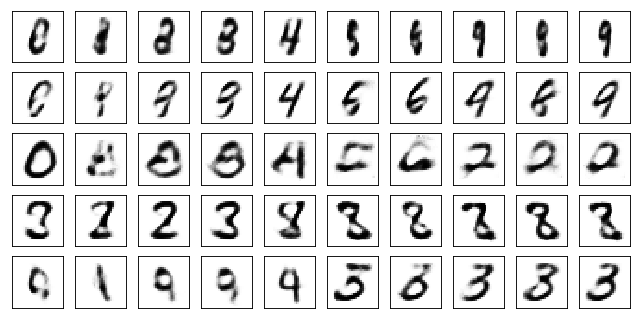

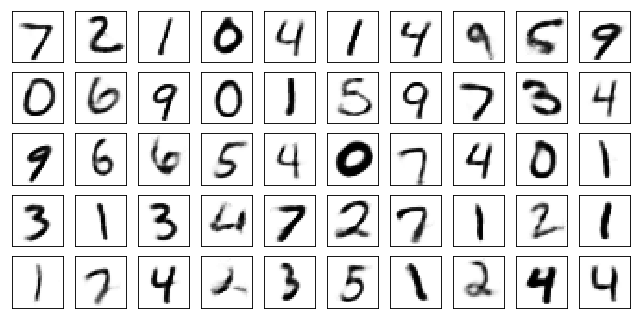

Test losses. E: 0.6924, AE: 0.0502, D: 0.6932
Train Epoch: 46 [0/50000 (0%)]	Losses E: 0.6953, AE: 0.0504, D: 0.6935
Train Epoch: 46 [5000/50000 (10%)]	Losses E: 0.6886, AE: 0.0473, D: 0.6906
Train Epoch: 46 [10000/50000 (20%)]	Losses E: 0.6967, AE: 0.0467, D: 0.6943
Train Epoch: 46 [15000/50000 (30%)]	Losses E: 0.6940, AE: 0.0403, D: 0.6935
Train Epoch: 46 [20000/50000 (40%)]	Losses E: 0.6850, AE: 0.0425, D: 0.6944
Train Epoch: 46 [25000/50000 (50%)]	Losses E: 0.6914, AE: 0.0453, D: 0.6934
Train Epoch: 46 [30000/50000 (60%)]	Losses E: 0.6917, AE: 0.0470, D: 0.6923
Train Epoch: 46 [35000/50000 (70%)]	Losses E: 0.6934, AE: 0.0445, D: 0.6929
Train Epoch: 46 [40000/50000 (80%)]	Losses E: 0.6978, AE: 0.0445, D: 0.6914
Train Epoch: 46 [45000/50000 (90%)]	Losses E: 0.6975, AE: 0.0481, D: 0.6937
Train Epoch: 46 [50000/50000 (100%)]	Losses E: 0.6987, AE: 0.0456, D: 0.6928


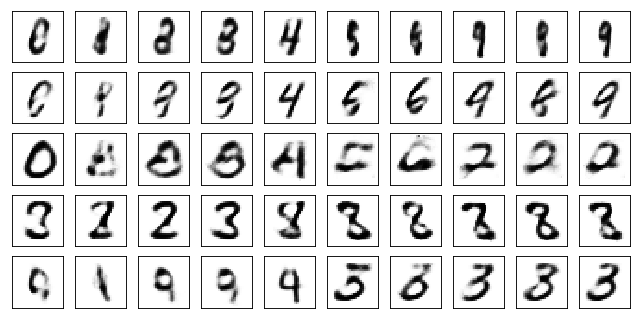

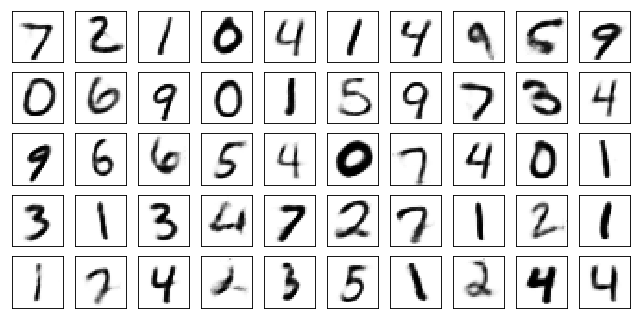

Test losses. E: 0.6976, AE: 0.0501, D: 0.6935
Train Epoch: 47 [0/50000 (0%)]	Losses E: 0.7003, AE: 0.0473, D: 0.6941
Train Epoch: 47 [5000/50000 (10%)]	Losses E: 0.6901, AE: 0.0490, D: 0.6947
Train Epoch: 47 [10000/50000 (20%)]	Losses E: 0.6915, AE: 0.0403, D: 0.6910
Train Epoch: 47 [15000/50000 (30%)]	Losses E: 0.6877, AE: 0.0407, D: 0.6929
Train Epoch: 47 [20000/50000 (40%)]	Losses E: 0.6912, AE: 0.0450, D: 0.6920
Train Epoch: 47 [25000/50000 (50%)]	Losses E: 0.7010, AE: 0.0474, D: 0.6938
Train Epoch: 47 [30000/50000 (60%)]	Losses E: 0.6905, AE: 0.0465, D: 0.6939
Train Epoch: 47 [35000/50000 (70%)]	Losses E: 0.6921, AE: 0.0416, D: 0.6927
Train Epoch: 47 [40000/50000 (80%)]	Losses E: 0.6917, AE: 0.0451, D: 0.6918
Train Epoch: 47 [45000/50000 (90%)]	Losses E: 0.6910, AE: 0.0473, D: 0.6926
Train Epoch: 47 [50000/50000 (100%)]	Losses E: 0.6942, AE: 0.0423, D: 0.6936


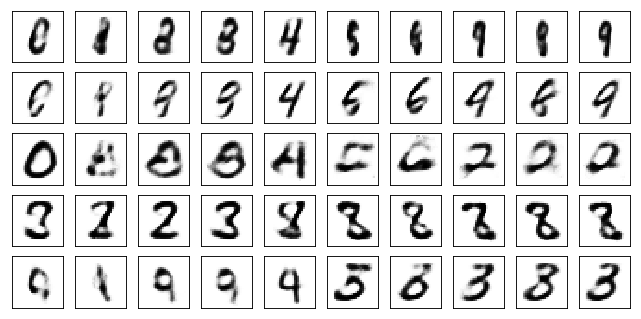

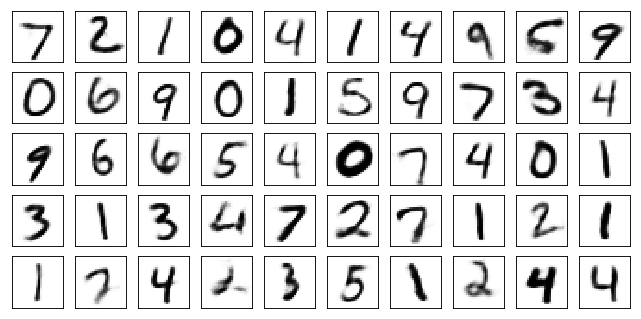

Test losses. E: 0.6926, AE: 0.0493, D: 0.6928
Train Epoch: 48 [0/50000 (0%)]	Losses E: 0.6932, AE: 0.0467, D: 0.6923
Train Epoch: 48 [5000/50000 (10%)]	Losses E: 0.6907, AE: 0.0479, D: 0.6956
Train Epoch: 48 [10000/50000 (20%)]	Losses E: 0.6944, AE: 0.0439, D: 0.6926
Train Epoch: 48 [15000/50000 (30%)]	Losses E: 0.6948, AE: 0.0454, D: 0.6928
Train Epoch: 48 [20000/50000 (40%)]	Losses E: 0.6853, AE: 0.0498, D: 0.6930
Train Epoch: 48 [25000/50000 (50%)]	Losses E: 0.6953, AE: 0.0425, D: 0.6929
Train Epoch: 48 [30000/50000 (60%)]	Losses E: 0.6878, AE: 0.0441, D: 0.6939
Train Epoch: 48 [35000/50000 (70%)]	Losses E: 0.6997, AE: 0.0383, D: 0.6952
Train Epoch: 48 [40000/50000 (80%)]	Losses E: 0.6887, AE: 0.0557, D: 0.6944
Train Epoch: 48 [45000/50000 (90%)]	Losses E: 0.6940, AE: 0.0536, D: 0.6948
Train Epoch: 48 [50000/50000 (100%)]	Losses E: 0.6940, AE: 0.0531, D: 0.6929


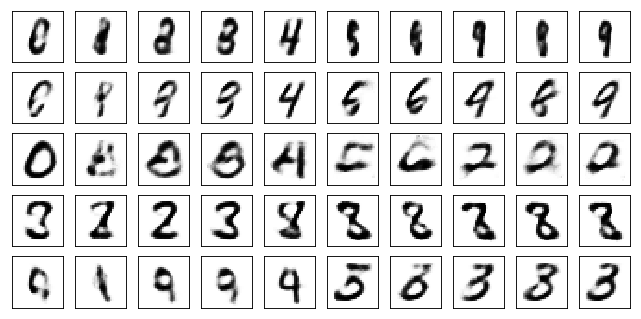

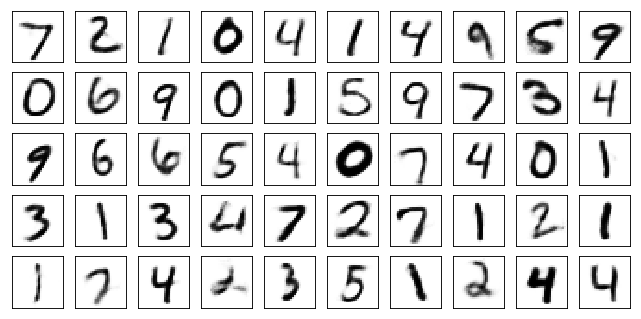

Test losses. E: 0.6988, AE: 0.0498, D: 0.6938
Train Epoch: 49 [0/50000 (0%)]	Losses E: 0.6997, AE: 0.0437, D: 0.6961
Train Epoch: 49 [5000/50000 (10%)]	Losses E: 0.7072, AE: 0.0470, D: 0.6919
Train Epoch: 49 [10000/50000 (20%)]	Losses E: 0.6946, AE: 0.0460, D: 0.6932
Train Epoch: 49 [15000/50000 (30%)]	Losses E: 0.6977, AE: 0.0497, D: 0.6935
Train Epoch: 49 [20000/50000 (40%)]	Losses E: 0.6927, AE: 0.0481, D: 0.6951
Train Epoch: 49 [25000/50000 (50%)]	Losses E: 0.6846, AE: 0.0451, D: 0.6956
Train Epoch: 49 [30000/50000 (60%)]	Losses E: 0.6920, AE: 0.0498, D: 0.6913
Train Epoch: 49 [35000/50000 (70%)]	Losses E: 0.6877, AE: 0.0421, D: 0.6920
Train Epoch: 49 [40000/50000 (80%)]	Losses E: 0.6860, AE: 0.0383, D: 0.6929
Train Epoch: 49 [45000/50000 (90%)]	Losses E: 0.6849, AE: 0.0462, D: 0.6931
Train Epoch: 49 [50000/50000 (100%)]	Losses E: 0.6979, AE: 0.0408, D: 0.6923


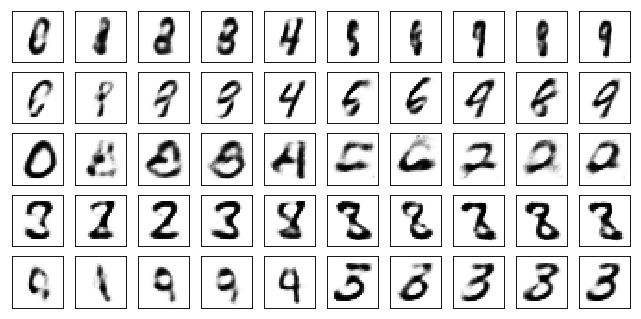

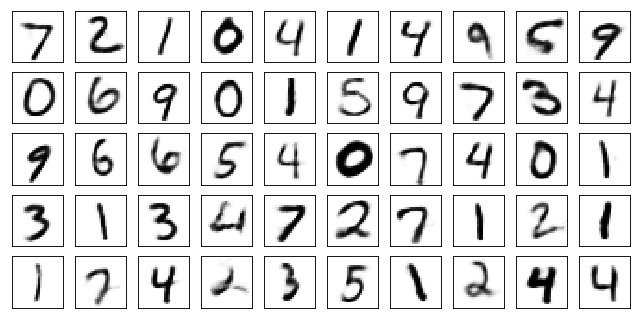

Test losses. E: 0.6967, AE: 0.0493, D: 0.6933
Train Epoch: 50 [0/50000 (0%)]	Losses E: 0.6936, AE: 0.0492, D: 0.6931
Train Epoch: 50 [5000/50000 (10%)]	Losses E: 0.6955, AE: 0.0441, D: 0.6906
Train Epoch: 50 [10000/50000 (20%)]	Losses E: 0.6967, AE: 0.0466, D: 0.6926
Train Epoch: 50 [15000/50000 (30%)]	Losses E: 0.7007, AE: 0.0485, D: 0.6914
Train Epoch: 50 [20000/50000 (40%)]	Losses E: 0.6914, AE: 0.0466, D: 0.6917
Train Epoch: 50 [25000/50000 (50%)]	Losses E: 0.6918, AE: 0.0497, D: 0.6948
Train Epoch: 50 [30000/50000 (60%)]	Losses E: 0.6979, AE: 0.0437, D: 0.6938
Train Epoch: 50 [35000/50000 (70%)]	Losses E: 0.7008, AE: 0.0462, D: 0.6929
Train Epoch: 50 [40000/50000 (80%)]	Losses E: 0.6915, AE: 0.0450, D: 0.6936
Train Epoch: 50 [45000/50000 (90%)]	Losses E: 0.6895, AE: 0.0428, D: 0.6940
Train Epoch: 50 [50000/50000 (100%)]	Losses E: 0.6932, AE: 0.0455, D: 0.6919


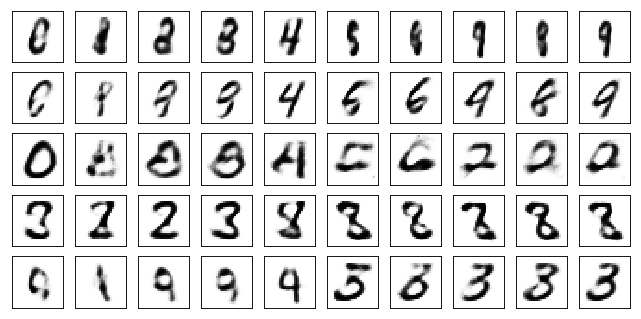

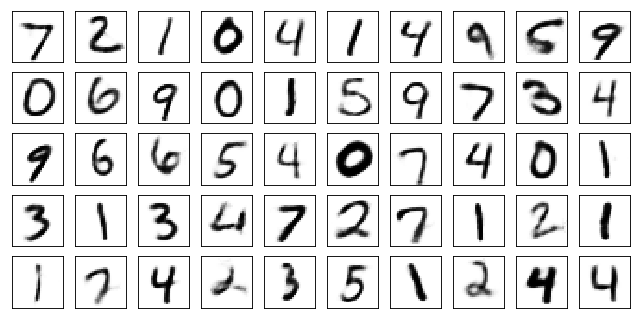

Test losses. E: 0.6940, AE: 0.0488, D: 0.6931


In [17]:
for epoch in range(1, train_epoch+1):
    Enc1.train()
    Dec1.train()
    Disc1.train()
    train_1(epoch, Enc1, Dec1, Disc1, train_log1)
    Enc1.eval()
    Dec1.eval()
    Disc1.eval()
    test_1(Enc1, Dec1, Disc1, valid_loader, epoch, test_log1)

In [18]:
torch.save(Enc1.state_dict(), 'checkpointEnc-.pt')
torch.save(Dec1.state_dict(), 'checkpointDec-.pt')

In [ ]:
## Обучение классификатора

In [11]:
class Net(nn.Module):
    def __init__(self, batchnorm=False, dropout=False, lr=1e-4, l2=0.):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(28*28, 128)
        self.fc2 = nn.Linear(128, 128)
        self.fc3 = nn.Linear(128, 10)
        if batchnorm:
            self.bn = nn.BatchNorm1d(128)
        self.batchnorm = batchnorm
        
        self.dropout = dropout
        self.optim = optim.Adam(self.parameters(), lr=lr, weight_decay=l2)
        
    def forward(self, x):
        x = x.view(-1, 28*28)
        x = torch.relu(self.fc1(x))
        if self.batchnorm:
            x = self.bn(x)
        x = torch.relu(self.fc2(x))
        if self.dropout:
            x = F.dropout(x, 0.5)
        x = self.fc3(x)
        x = torch.log_softmax(x, dim=1)
        return x
    
    def loss(self, output, target, **kwargs):
        self._loss = F.nll_loss(output, target, **kwargs)
        return self._loss

In [12]:
def train(epoch, models):
    train_size = len(train_loader.sampler)
    for batch_idx, (data, target) in enumerate(train_loader):
        for k, model in models.items():
            model.optim.zero_grad()
            output = model(data)
            loss = model.loss(output, target)
            loss.backward()
            model.optim.step()
            
        if batch_idx % 200 == 0:
            line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
                epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
            losses = ' '.join(['{}: {:.6f}'.format(k, m._loss.item()) for k, m in models.items()])
            print(line + losses)
            
    else:
        batch_idx += 1
        line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
            epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
        losses = ' '.join(['{}: {:.6f}'.format(k, m._loss.item()) for k, m in models.items()])
        print(line + losses)

In [63]:
models = {'both': Net(True, True)}
train_log = {k: [] for k in models}
test_log = {k: [] for k in models}

In [64]:
def test(models, loader, log=None):
    test_size = len(loader.sampler)
    avg_lambda = lambda l: 'Loss: {:.4f}'.format(l)
    acc_lambda = lambda c, p: 'Accuracy: {}/{} ({:.0f}%)'.format(c, test_size, p)
    line = lambda i, l, c, p: '{}: '.format(i) + avg_lambda(l) + '\t' + acc_lambda(c, p)

    test_loss = {k: 0. for k in models}
    correct = {k: 0. for k in models}
    with torch.no_grad():
        for data, target in loader:
            # output = {k: m(data) for m in models}
            for k, m in models.items():
                output = m(data)
                test_loss[k] += m.loss(output, target, reduction='sum').item() # sum up batch loss
                pred = output.data.max(1, keepdim=True)[1] # get the index of the max log-probability
                correct[k] += pred.eq(target.data.view_as(pred)).cpu().sum().item()
    
    for k in models:
        test_loss[k] /= test_size
    correct_pct = {k: 100. * correct[k] / test_size for k in correct}
    lines = '\n'.join([line(k, test_loss[k], correct[k], correct_pct[k]) for k in models]) + '\n'
    report = 'Test set:\n' + lines
    if log is not None:
        for k in models:
            log[k].append((test_loss[k], correct_pct[k]))
    print(report)

In [ ]:
## На исходных данных

In [65]:
for epoch in range(1, 51):
    for model in models.values():
        model.train()
    train(epoch, models)
    for model in models.values():
        model.eval()
    test(models, valid_loader, test_log)

Train Epoch: 1 [0/50000 (0%)]	Losses both: 2.312095
Train Epoch: 1 [10000/50000 (20%)]	Losses both: 1.417987
Train Epoch: 1 [20000/50000 (40%)]	Losses both: 0.831973
Train Epoch: 1 [30000/50000 (60%)]	Losses both: 0.548533
Train Epoch: 1 [40000/50000 (80%)]	Losses both: 0.336901
Train Epoch: 1 [50000/50000 (100%)]	Losses both: 0.530440
Test set:
both: Loss: 0.3984	Accuracy: 8962.0/10000 (90%)

Train Epoch: 2 [0/50000 (0%)]	Losses both: 0.384515
Train Epoch: 2 [10000/50000 (20%)]	Losses both: 0.297790
Train Epoch: 2 [20000/50000 (40%)]	Losses both: 0.353364
Train Epoch: 2 [30000/50000 (60%)]	Losses both: 0.174423
Train Epoch: 2 [40000/50000 (80%)]	Losses both: 0.317181
Train Epoch: 2 [50000/50000 (100%)]	Losses both: 0.328287
Test set:
both: Loss: 0.2954	Accuracy: 9156.0/10000 (92%)

Train Epoch: 3 [0/50000 (0%)]	Losses both: 0.266321
Train Epoch: 3 [10000/50000 (20%)]	Losses both: 0.526858
Train Epoch: 3 [20000/50000 (40%)]	Losses both: 0.128062
Train Epoch: 3 [30000/50000 (60%)]	Losse

Train Epoch: 21 [40000/50000 (80%)]	Losses both: 0.167802
Train Epoch: 21 [50000/50000 (100%)]	Losses both: 0.031135
Test set:
both: Loss: 0.1348	Accuracy: 9617.0/10000 (96%)

Train Epoch: 22 [0/50000 (0%)]	Losses both: 0.037491
Train Epoch: 22 [10000/50000 (20%)]	Losses both: 0.134317
Train Epoch: 22 [20000/50000 (40%)]	Losses both: 0.138536
Train Epoch: 22 [30000/50000 (60%)]	Losses both: 0.024883
Train Epoch: 22 [40000/50000 (80%)]	Losses both: 0.251777
Train Epoch: 22 [50000/50000 (100%)]	Losses both: 0.128337
Test set:
both: Loss: 0.1407	Accuracy: 9618.0/10000 (96%)

Train Epoch: 23 [0/50000 (0%)]	Losses both: 0.027170
Train Epoch: 23 [10000/50000 (20%)]	Losses both: 0.197793
Train Epoch: 23 [20000/50000 (40%)]	Losses both: 0.109352
Train Epoch: 23 [30000/50000 (60%)]	Losses both: 0.089752
Train Epoch: 23 [40000/50000 (80%)]	Losses both: 0.067536
Train Epoch: 23 [50000/50000 (100%)]	Losses both: 0.274391
Test set:
both: Loss: 0.1387	Accuracy: 9608.0/10000 (96%)

Train Epoch: 24 [0

Train Epoch: 42 [10000/50000 (20%)]	Losses both: 0.125391
Train Epoch: 42 [20000/50000 (40%)]	Losses both: 0.032970
Train Epoch: 42 [30000/50000 (60%)]	Losses both: 0.075926
Train Epoch: 42 [40000/50000 (80%)]	Losses both: 0.104613
Train Epoch: 42 [50000/50000 (100%)]	Losses both: 0.008868
Test set:
both: Loss: 0.1282	Accuracy: 9661.0/10000 (97%)

Train Epoch: 43 [0/50000 (0%)]	Losses both: 0.020921
Train Epoch: 43 [10000/50000 (20%)]	Losses both: 0.130972
Train Epoch: 43 [20000/50000 (40%)]	Losses both: 0.013478
Train Epoch: 43 [30000/50000 (60%)]	Losses both: 0.057801
Train Epoch: 43 [40000/50000 (80%)]	Losses both: 0.034243
Train Epoch: 43 [50000/50000 (100%)]	Losses both: 0.049999
Test set:
both: Loss: 0.1286	Accuracy: 9659.0/10000 (97%)

Train Epoch: 44 [0/50000 (0%)]	Losses both: 0.032845
Train Epoch: 44 [10000/50000 (20%)]	Losses both: 0.014927
Train Epoch: 44 [20000/50000 (40%)]	Losses both: 0.139934
Train Epoch: 44 [30000/50000 (60%)]	Losses both: 0.114898
Train Epoch: 44 [400

In [ ]:
## На данных честного CAAE

In [56]:
Enc.load_state_dict(torch.load('checkpointEnc+.pt'))
Enc.eval()
Dec.load_state_dict(torch.load('checkpointDec+.pt'))
Dec.eval()

FullyConnected(
  (model): Sequential(
    (0): Linear(in_features=20, out_features=500, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Linear(in_features=500, out_features=501, bias=True)
    (3): LeakyReLU(negative_slope=0.2)
    (4): Linear(in_features=501, out_features=784, bias=True)
    (5): Tanh()
  )
)

In [57]:
train_log0 = {k: [] for k in models}
test_log0 = {k: [] for k in models}

In [58]:
def train_0(epoch, models, E=Enc, D=Dec):
    train_size = len(train_loader.sampler)
    for batch_idx, (data, target) in enumerate(train_loader):
        with torch.no_grad():
            label = to_onehot(target, 10, device)
            latent = E(data)
            data0 = D(latent, label)
        for k, model in models.items():
            model.optim.zero_grad()
            output = model(data0)
            loss = model.loss(output, target)
            loss.backward()
            model.optim.step()
            
        if batch_idx % 200 == 0:
            line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
                epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
            losses = ' '.join(['{}: {:.6f}'.format(k, m._loss.item()) for k, m in models.items()])
            print(line + losses)
            
    else:
        batch_idx += 1
        line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
            epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
        losses = ' '.join(['{}: {:.6f}'.format(k, m._loss.item()) for k, m in models.items()])
        print(line + losses)

In [59]:
def test_0(models, loader,  E=Enc, D=Dec,log=None):
    test_size = len(loader.sampler)
    avg_lambda = lambda l: 'Loss: {:.4f}'.format(l)
    acc_lambda = lambda c, p: 'Accuracy: {}/{} ({:.0f}%)'.format(c, test_size, p)
    line = lambda i, l, c, p: '{}: '.format(i) + avg_lambda(l) + '\t' + acc_lambda(c, p)

    test_loss = {k: 0. for k in models}
    correct = {k: 0. for k in models}
    with torch.no_grad():
        for data, target in loader:
            label = to_onehot(target, 10, device)
            data = D(E(data), label)
            # output = {k: m(data) for m in models}
            for k, m in models.items():
                output = m(data)
                test_loss[k] += m.loss(output, target, reduction='sum').item() # sum up batch loss
                pred = output.data.max(1, keepdim=True)[1] # get the index of the max log-probability
                correct[k] += pred.eq(target.data.view_as(pred)).cpu().sum().item()
    
    for k in models:
        test_loss[k] /= test_size
    correct_pct = {k: 100. * correct[k] / test_size for k in correct}
    lines = '\n'.join([line(k, test_loss[k], correct[k], correct_pct[k]) for k in models]) + '\n'
    report = 'Test set:\n' + lines
    if log is not None:
        for k in models:
            log[k].append((test_loss[k], correct_pct[k]))
    print(report)

In [60]:
for epoch in range(1, 51):
    for model in models.values():
        model.train()
    train_0(epoch, models)
    for model in models.values():
        model.eval()
    test_0(models, valid_loader, log=test_log0)

Train Epoch: 1 [0/50000 (0%)]	Losses both: 2.331155
Train Epoch: 1 [10000/50000 (20%)]	Losses both: 1.210424
Train Epoch: 1 [20000/50000 (40%)]	Losses both: 0.774321
Train Epoch: 1 [30000/50000 (60%)]	Losses both: 0.313085
Train Epoch: 1 [40000/50000 (80%)]	Losses both: 0.253392
Train Epoch: 1 [50000/50000 (100%)]	Losses both: 0.204019
Test set:
both: Loss: 0.1482	Accuracy: 9768.0/10000 (98%)

Train Epoch: 2 [0/50000 (0%)]	Losses both: 0.171797
Train Epoch: 2 [10000/50000 (20%)]	Losses both: 0.086917
Train Epoch: 2 [20000/50000 (40%)]	Losses both: 0.063916
Train Epoch: 2 [30000/50000 (60%)]	Losses both: 0.061443
Train Epoch: 2 [40000/50000 (80%)]	Losses both: 0.026905
Train Epoch: 2 [50000/50000 (100%)]	Losses both: 0.151964
Test set:
both: Loss: 0.0700	Accuracy: 9863.0/10000 (99%)

Train Epoch: 3 [0/50000 (0%)]	Losses both: 0.088096
Train Epoch: 3 [10000/50000 (20%)]	Losses both: 0.072749
Train Epoch: 3 [20000/50000 (40%)]	Losses both: 0.026011
Train Epoch: 3 [30000/50000 (60%)]	Losse

Train Epoch: 21 [40000/50000 (80%)]	Losses both: 0.004314
Train Epoch: 21 [50000/50000 (100%)]	Losses both: 0.007012
Test set:
both: Loss: 0.0148	Accuracy: 9963.0/10000 (100%)

Train Epoch: 22 [0/50000 (0%)]	Losses both: 0.007960
Train Epoch: 22 [10000/50000 (20%)]	Losses both: 0.003917
Train Epoch: 22 [20000/50000 (40%)]	Losses both: 0.006918
Train Epoch: 22 [30000/50000 (60%)]	Losses both: 0.057055
Train Epoch: 22 [40000/50000 (80%)]	Losses both: 0.019140
Train Epoch: 22 [50000/50000 (100%)]	Losses both: 0.007965
Test set:
both: Loss: 0.0112	Accuracy: 9969.0/10000 (100%)

Train Epoch: 23 [0/50000 (0%)]	Losses both: 0.012518
Train Epoch: 23 [10000/50000 (20%)]	Losses both: 0.001930
Train Epoch: 23 [20000/50000 (40%)]	Losses both: 0.001947
Train Epoch: 23 [30000/50000 (60%)]	Losses both: 0.005758
Train Epoch: 23 [40000/50000 (80%)]	Losses both: 0.007201
Train Epoch: 23 [50000/50000 (100%)]	Losses both: 0.005852
Test set:
both: Loss: 0.0070	Accuracy: 9986.0/10000 (100%)

Train Epoch: 24

Test set:
both: Loss: 0.0059	Accuracy: 9986.0/10000 (100%)

Train Epoch: 42 [0/50000 (0%)]	Losses both: 0.000295
Train Epoch: 42 [10000/50000 (20%)]	Losses both: 0.014339
Train Epoch: 42 [20000/50000 (40%)]	Losses both: 0.001231
Train Epoch: 42 [30000/50000 (60%)]	Losses both: 0.001635
Train Epoch: 42 [40000/50000 (80%)]	Losses both: 0.001520
Train Epoch: 42 [50000/50000 (100%)]	Losses both: 0.001344
Test set:
both: Loss: 0.0056	Accuracy: 9984.0/10000 (100%)

Train Epoch: 43 [0/50000 (0%)]	Losses both: 0.015913
Train Epoch: 43 [10000/50000 (20%)]	Losses both: 0.000290
Train Epoch: 43 [20000/50000 (40%)]	Losses both: 0.062837
Train Epoch: 43 [30000/50000 (60%)]	Losses both: 0.000173
Train Epoch: 43 [40000/50000 (80%)]	Losses both: 0.000324
Train Epoch: 43 [50000/50000 (100%)]	Losses both: 0.001543
Test set:
both: Loss: 0.0051	Accuracy: 9978.0/10000 (100%)

Train Epoch: 44 [0/50000 (0%)]	Losses both: 0.000749
Train Epoch: 44 [10000/50000 (20%)]	Losses both: 0.000201
Train Epoch: 44 [2000

In [ ]:
## На данных нечестного CAAE

In [36]:
Enc1.load_state_dict(torch.load('checkpointEnc-.pt'))
Enc1.eval()
Dec1.load_state_dict(torch.load('checkpointDec-.pt'))
Dec1.eval()

FullyConnected(
  (model): Sequential(
    (0): Linear(in_features=20, out_features=500, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Linear(in_features=500, out_features=501, bias=True)
    (3): LeakyReLU(negative_slope=0.2)
    (4): Linear(in_features=501, out_features=784, bias=True)
    (5): Tanh()
  )
)

In [37]:
train_log1 = {k: [] for k in models}
test_log1 = {k: [] for k in models}

In [44]:
for epoch in range(1, 51):
    for model in models.values():
        model.train()
    train_0(epoch, models, E=Enc1, D=Dec1)
    for model in models.values():
        model.eval()
    test_0(models, valid_loader, E=Enc1, D=Dec1, log=test_log1)

Train Epoch: 1 [0/50000 (0%)]	Losses both: 0.169695
Train Epoch: 1 [10000/50000 (20%)]	Losses both: 0.035921
Train Epoch: 1 [20000/50000 (40%)]	Losses both: 0.005142
Train Epoch: 1 [30000/50000 (60%)]	Losses both: 0.056365
Train Epoch: 1 [40000/50000 (80%)]	Losses both: 0.162990
Train Epoch: 1 [50000/50000 (100%)]	Losses both: 0.003467
Test set:
both: Loss: 0.0513	Accuracy: 9849.0/10000 (98%)

Train Epoch: 2 [0/50000 (0%)]	Losses both: 0.139063
Train Epoch: 2 [10000/50000 (20%)]	Losses both: 0.020531
Train Epoch: 2 [20000/50000 (40%)]	Losses both: 0.159437
Train Epoch: 2 [30000/50000 (60%)]	Losses both: 0.010560
Train Epoch: 2 [40000/50000 (80%)]	Losses both: 0.011525
Train Epoch: 2 [50000/50000 (100%)]	Losses both: 0.018630
Test set:
both: Loss: 0.0475	Accuracy: 9856.0/10000 (99%)

Train Epoch: 3 [0/50000 (0%)]	Losses both: 0.019261
Train Epoch: 3 [10000/50000 (20%)]	Losses both: 0.091502
Train Epoch: 3 [20000/50000 (40%)]	Losses both: 0.015271
Train Epoch: 3 [30000/50000 (60%)]	Losse

Train Epoch: 21 [40000/50000 (80%)]	Losses both: 0.008631
Train Epoch: 21 [50000/50000 (100%)]	Losses both: 0.010543
Test set:
both: Loss: 0.0310	Accuracy: 9904.0/10000 (99%)

Train Epoch: 22 [0/50000 (0%)]	Losses both: 0.008115
Train Epoch: 22 [10000/50000 (20%)]	Losses both: 0.015717
Train Epoch: 22 [20000/50000 (40%)]	Losses both: 0.006299
Train Epoch: 22 [30000/50000 (60%)]	Losses both: 0.014307
Train Epoch: 22 [40000/50000 (80%)]	Losses both: 0.001080
Train Epoch: 22 [50000/50000 (100%)]	Losses both: 0.002433
Test set:
both: Loss: 0.0347	Accuracy: 9903.0/10000 (99%)

Train Epoch: 23 [0/50000 (0%)]	Losses both: 0.006431
Train Epoch: 23 [10000/50000 (20%)]	Losses both: 0.008714
Train Epoch: 23 [20000/50000 (40%)]	Losses both: 0.001927
Train Epoch: 23 [30000/50000 (60%)]	Losses both: 0.001892
Train Epoch: 23 [40000/50000 (80%)]	Losses both: 0.011112
Train Epoch: 23 [50000/50000 (100%)]	Losses both: 0.037198
Test set:
both: Loss: 0.0335	Accuracy: 9894.0/10000 (99%)

Train Epoch: 24 [0

Train Epoch: 42 [10000/50000 (20%)]	Losses both: 0.000775
Train Epoch: 42 [20000/50000 (40%)]	Losses both: 0.003810
Train Epoch: 42 [30000/50000 (60%)]	Losses both: 0.004673
Train Epoch: 42 [40000/50000 (80%)]	Losses both: 0.006091
Train Epoch: 42 [50000/50000 (100%)]	Losses both: 0.023668
Test set:
both: Loss: 0.0325	Accuracy: 9907.0/10000 (99%)

Train Epoch: 43 [0/50000 (0%)]	Losses both: 0.000519
Train Epoch: 43 [10000/50000 (20%)]	Losses both: 0.002003
Train Epoch: 43 [20000/50000 (40%)]	Losses both: 0.001750
Train Epoch: 43 [30000/50000 (60%)]	Losses both: 0.002698
Train Epoch: 43 [40000/50000 (80%)]	Losses both: 0.004314
Train Epoch: 43 [50000/50000 (100%)]	Losses both: 0.036934
Test set:
both: Loss: 0.0267	Accuracy: 9918.0/10000 (99%)

Train Epoch: 44 [0/50000 (0%)]	Losses both: 0.000365
Train Epoch: 44 [10000/50000 (20%)]	Losses both: 0.048695
Train Epoch: 44 [20000/50000 (40%)]	Losses both: 0.017794
Train Epoch: 44 [30000/50000 (60%)]	Losses both: 0.029020
Train Epoch: 44 [400

In [ ]:
## Визуализация результатов

In [108]:
def plot_graphs2(log, log1, log2, tpe='loss'):
    key = {'Data':[], 'CAAE+':[], 'CAAE-':[]}
    keys = key.keys()
    logs = {'Data':[z for z in zip(*log['both'])], 'CAAE+': [z for z in zip(*log1['both'])], 'CAAE-': [z for z in zip(*log2['both'])]}
    epochs = {k:range(len(log['both'])) for k in keys}
    if tpe == 'loss':
        handlers, = zip(*[plt.plot(epochs[k], logs[k][0][:50], label=k) for k in keys])
        plt.title('errors')
        plt.xlabel('epoch')
        plt.ylabel('error')
        plt.legend(handles=handlers)
        plt.show()
    elif tpe == 'accuracy':
        handlers, = zip(*[plt.plot(epochs[k], logs[k][1][:50], label=k) for k in keys])
        plt.title('accuracy')
        plt.xlabel('epoch')
        plt.ylabel('accuracy')
        plt.legend(handles=handlers)
        plt.show()

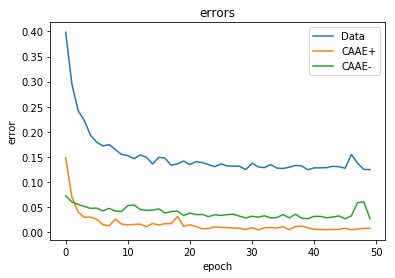

In [109]:
plot_graphs2(test_log, test_log0, test_log1, 'loss')

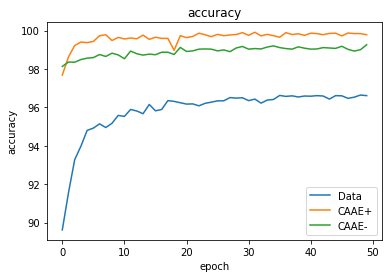

In [110]:
plot_graphs2(test_log, test_log0, test_log1, 'accuracy')